In [2]:
import os
import pandas
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from copy import deepcopy
from scipy import stats
from matplotlib.colors import Normalize
from statsmodels.stats.multitest import multipletests
from sklearn.preprocessing import MinMaxScaler

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/pandas/compat/__init__.py:97: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


# Load brainspan data

I need to come back here and add the things I did to make these notebooks

In [265]:
# Where to save figures
fig_dir = '/Users/jacobv/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/SubFigs/'

In [266]:
df = pandas.read_csv('/Users/jacobv/Science/Brainspan/ForBslav/gene_expression_original.csv',
                     )
rmd = pandas.read_csv('/Users/jacobv/Science/Brainspan/ForBslav/gene_metadata_original.csv')
cmd = pandas.read_csv('/Users/jacobv/Science/Brainspan/ForBslav/samples_metadata.csv')

In [7]:
# df = pandas.read_csv('/data1/users/jvogel/Brainspan/DevTx/expression_matrix.csv',header=None)
# rmd = pandas.read_csv('/data1/users/jvogel/Brainspan/DevTx/rows_metadata.csv')
# cmd = pandas.read_csv('/data1/users/jvogel/Brainspan/DevTx/columns_metadata.csv')

# Load component data

In [8]:
# c1 = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/txfer/GCORR_C1_genelist.csv',
#                     index_col=0)
# c1.columns = ['expr'] + c1.columns[1:].tolist()
# c2 = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/txfer/GCorr_C2_genelist.csv',
#                     index_col=0)
# c2.columns = ['expr'] + c2.columns[1:].tolist()
# c2 = c2.sort_values('expr',ascending=True)
# c3 = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/txfer/GCorr_C3_genelist.csv',
#                     index_col=0)


In [267]:
c1 = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/txfer/GCORR_C1_genelist.csv',
                    index_col=0)
c1.columns = ['expr'] + c1.columns[1:].tolist()
c1 = c1.sort_values('expr',ascending=True)
c2 = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/txfer/GCorr_C2_genelist.csv',
                    index_col=0)
c2.columns = ['expr'] + c2.columns[1:].tolist()
c2 = c2.sort_values('expr',ascending=True)
c3 = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/txfer/GCorr_C3_genelist.csv',
                    index_col=0)
c3.columns = ['expr'] + c3.columns[1:].tolist()
c3 = c3.sort_values('expr',ascending=True)

In [10]:
len(rmd.gene_symbol.unique())

47808

#### address duplicates

In [268]:
dups = []
dind = []
catch = []
for i,row in rmd.iterrows():
    x = row['gene_symbol']
    if x in catch: 
        dups.append(x)
        dind.append(i)
    else:
        catch.append(x)

It appears most uniques are RNA or things we dont care about. I will remove them

In [269]:
df.shape

(52376, 525)

In [270]:
bad_index = rmd[rmd.gene_symbol.isin(dups)].index
rmd.drop(bad_index,inplace=True)
df.drop(bad_index,inplace=True)

#### harmonize genes

In [271]:
shared = list(set(rmd.gene_symbol.values) & set(c1.gene_symbol))
len(shared)

13750

In [272]:
good_ids = rmd[rmd.gene_symbol.isin(shared)].index
gxp = df.loc[good_ids]
gxp.shape

(13750, 525)

In [273]:
gxp.index = rmd[rmd.gene_symbol.isin(shared)].gene_symbol.values
gxp.drop(gxp.columns[0],axis=1,inplace=True) # get rid of index column
gxp.head()

,0,1,2,3,4,5,6,7,8,9,...,514,515,516,517,518,519,520,521,522,523
TSPAN6,36.447128,24.251253,19.330479,27.668607,19.998231,14.680673,27.548101,16.580183,44.587799,44.943915,...,2.320932,1.781548,2.277359,1.832737,1.555696,2.081944,3.484685,4.816781,3.034464,3.082820
DPM1,34.373239,20.765661,18.734947,22.366394,19.228431,11.020365,25.394607,17.671327,32.903100,38.157569,...,23.769167,20.142132,20.063257,16.575379,18.783516,21.631293,28.006120,28.731717,16.679597,28.866042
SCYL3,4.379337,4.227521,2.551825,3.603764,2.948976,2.405183,3.613642,2.573935,3.483817,3.609830,...,1.593009,1.563377,1.648571,2.231466,2.040326,2.161741,1.275352,1.184766,1.735579,1.500363
C1orf112,3.957119,3.520794,2.037805,3.487035,2.177235,0.999693,3.481555,1.747568,3.741580,3.560650,...,0.583488,0.797376,0.607141,0.575555,0.606445,0.683625,0.495084,0.761265,0.766482,0.468859
FGR,0.244174,0.266976,0.248188,0.141398,0.467688,0.296493,0.079941,0.149822,0.204210,0.260205,...,1.319251,2.062175,1.168233,0.681609,0.490367,0.407953,1.568014,1.260039,1.736395,1.632879


#### Get gene expression for each component and each columns

In [274]:
gdf = pandas.DataFrame(cmd,copy=True)

In [275]:
c1.index = c1.gene_symbol.values
c2.index = c2.gene_symbol.values
c3.index = c3.gene_symbol.values
for i,col in enumerate(gxp.columns):
    gdf.loc[i,'C1_exp'] = np.dot(gxp[col],
                                 c1.loc[gxp.index,'expr'].values)
    gdf.loc[i,'C2_exp'] = np.dot(gxp[col],
                                 c2.loc[gxp.index,'expr'].values)
    gdf.loc[i,'C3_exp'] = np.dot(gxp[col],
                                 c3.loc[gxp.index,'expr'].values)

In [17]:
#gdf.to_csv('data/GCorr_Brainspan.csv')

In [854]:
gdf = pandas.read_csv('data/GCorr_Brainspan.csv')

#### Prepare stuff for plots

In [855]:
Occipital =  ['Ocx','V1C']
Somatomotor=['M1C-S1C','M1C','S1C']
Limbic=['AMY','HIP']
GangEm= ['MGE','CGE','LGE']
Temporal=['STC','ITC','TCx','A1C']
Cerebellum=['URL','CB','CBC']
Subcortex=['DTH','STR','MD']
Frontal=['MFC','DFC','OFC','VFC']
Parietal=['PCx','IPC']

Striatum = ['STR']
Thalamus = ['MD','DTH']
             
divs = [Occipital,Somatomotor,Limbic,GangEm,Temporal,Cerebellum,Subcortex,Frontal,Parietal]
names = ['Occipital','Somatomotor','Limbic','GangEm','Temporal','Cerebellum','Subcortex','Frontal','Parietal']
bdivs = dict(zip(names,divs))
for name, div in bdivs.items():
    gdf.loc[gdf[gdf.structure_acronym.isin(div)].index,'MacroStructure'] = name

divs = [Occipital,Somatomotor,Limbic,GangEm,Temporal,Cerebellum,Frontal,Parietal,Striatum,Thalamus]
names = ['Occipital','Sensorimotor','Limbic','GangEm','Temporal','Cerebellum','Frontal','Parietal','Striatum','Thalamus']
bdivs = dict(zip(names,divs))
for name, div in bdivs.items():
    gdf.loc[gdf[gdf.structure_acronym.isin(div)].index,'MacroStructure2'] = name
    
Tele = ['Ocx','AMY','M1C-S1C','MGE','STC',
                  'CGE','DTH','MFC','DFC','OFC','LGE',
                  'ITC','HIP','VFC','PCx','TCx','IPC',
                  'A1C','V1C','STR','M1C','S1C','MD']
Met = ['URL','CB','CBC']
divs = [Tele,Met]
names = ['Tele','Met']
bdivs = dict(zip(names,divs))
for name, div in bdivs.items():
    gdf.loc[gdf[gdf.structure_acronym.isin(div)].index,'NT_Segment'] = name

Sensory = ['M1C-S1C','A1C','V1C','M1C','S1C']
Association = ['Ocx','AMY','STC','MFC',
            'DFC','OFC','ITC','HIP',
            'VFC','PCx','TCx','IPC']
Not_Cortex = ['MGE','URL','CGE','DTH',
          'LGE','STR','CB','CBC','MD']
divs = [Sensory,Association,Not_Cortex]
names = ['Sensory','Association','Not_Cortex']
bdivs = dict(zip(names,divs))
for name, div in bdivs.items():
    gdf.loc[gdf[gdf.structure_acronym.isin(div)].index,'Sensorifugal'] = name


In [856]:
order = ['8 pcw', '9 pcw', '12 pcw', '13 pcw', '16 pcw', 
         '17 pcw', '19 pcw', '21 pcw','24 pcw', '25 pcw', 
         '26 pcw', '35 pcw', '37 pcw','4 mos','10 mos',
         '1 yrs', '2 yrs', '3 yrs','4 yrs','8 yrs',
        '11 yrs', '13 yrs', '15 yrs', '18 yrs', '19 yrs',
        '21 yrs', '23 yrs','30 yrs', '36 yrs', '37 yrs',
        '40 yrs']

# stage
fetal = ['8 pcw', '9 pcw', '12 pcw', '13 pcw', '16 pcw', 
         '17 pcw', '19 pcw', '21 pcw','24 pcw', '25 pcw', 
         '26 pcw', '35 pcw', '37 pcw',]
infant = ['4 mos','10 mos','1 yrs',]
child = ['2 yrs', '3 yrs','4 yrs','8 yrs','11 yrs']
adolescent = ['11 yrs', '13 yrs', '15 yrs', '18 yrs', '19 yrs',]
adult = ['21 yrs', '23 yrs','30 yrs', '36 yrs', '37 yrs',
        '40 yrs']
divs = [fetal,infant,child,adolescent,adult]
names = ['fetal','infant','child','adolescent','adult']
bdivs = dict(zip(names,divs))
for name, div in bdivs.items():
    gdf.loc[gdf[gdf.age.isin(div)].index,'Age_Stage'] = name

#epoch
e0 = ['8 pcw', '9 pcw']
e1 = ['12 pcw', '13 pcw', '16 pcw', '17 pcw', '19 pcw']
e2 = ['21 pcw','24 pcw', '25 pcw', '26 pcw', '35 pcw', 
      '37 pcw','4 mos']
e3 = ['10 mos','1 yrs','2 yrs', '3 yrs','4 yrs','8 yrs',
        '11 yrs', '13 yrs', '15 yrs', '18 yrs', '19 yrs',
        '21 yrs', '23 yrs','30 yrs', '36 yrs', '37 yrs',
        '40 yrs']
divs = [e0,e1,e2,e3]
names = ['e0','e1','e2','e3']
bdivs = dict(zip(names,divs))
for name, div in bdivs.items():
    gdf.loc[gdf[gdf.age.isin(div)].index,'Age_Epoch'] = name

#period
p2 = ['8 pcw', '9 pcw']
p3 = ['12 pcw', '13 pcw',]
p4 = ['16 pcw']
p5 = ['17 pcw', '19 pcw']
p6 = ['21 pcw','24 pcw']
p7 = ['25 pcw', '26 pcw', '35 pcw','37 pcw']
p8 = ['4 mos']
p9 = ['10 mos','1 yrs']
p10 = ['2 yrs', '3 yrs','4 yrs',]
p11 = ['8 yrs','11 yrs',]
p12 = ['13 yrs', '15 yrs', '18 yrs', '19 yrs','21 yrs',
       '23 yrs','30 yrs', '36 yrs', '37 yrs','40 yrs']
divs = [p2,p3,p4,p5,p6,p7,p8,p9,p10,p11,p12]
names = ['p2','p3','p4','p5','p6','p7','p8','p9',
         'p10','p11','p12']
bdivs = dict(zip(names,divs))
for name, div in bdivs.items():
    gdf.loc[gdf[gdf.age.isin(div)].index,'Age_Period'] = name


In [857]:
# deal with the nine months before birth before logging...
for i,row in gdf.iterrows():
    age = row['age']
    num,measure = age.split(' ')
    if measure == 'pcw':
        fage = int(num) / 4.35
    elif measure == 'yrs':
        fage = int(num) * 12
    else:
        fage = int(num)
    gdf.loc[i,'age_in_months'] = fage

In [858]:
for i,row in gdf.iterrows():
    age = row['age']
    num,measure = age.split(' ')
    if measure == 'pcw':
        fage = int(num)
    elif measure == 'yrs':
        fage = (int(num) * 52) + 39.105
    else:
        fage = (int(num) * 4.345) + 39.105
    gdf.loc[i,'age_in_weeks'] = fage

In [859]:
gdf.loc[:,'log_age_months'] = np.log(gdf['age_in_months']).values
gdf.loc[:,'log_age_weeks'] = np.log(gdf['age_in_weeks']).values


In [860]:
as_order = ['fetal','infant','child','adolescent','adult']
ae_order = sorted(gdf.Age_Epoch.unique())
ap_order = gdf.Age_Period.unique()

In [861]:
code = dict(zip(gdf.age.unique(),range(len(gdf.age.unique()))))
gdf.loc[:,'age_level'] = [code[x] for x in gdf.age.values]

# Derive component subcluster trajectories

### C2

In [133]:
gxp.T.head()

,TSPAN6,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,NIPAL3,...,KRT86,MC1R,CEP95,CXADRP2,TMEM179,SLC35G6,GH1,THTPA,ANP32AP1,BLID
0,36.447128,34.373239,4.379337,3.957119,0.244174,1.739810,10.093235,2.632164,24.845660,1.363100,...,0.000000,0.821452,7.177763,1.634086,1.296794,0.030182,0.000000,10.625217,41.935201,0.000000
1,24.251253,20.765661,4.227521,3.520794,0.266976,1.631157,7.413745,2.350074,27.283269,1.368581,...,0.000000,1.098753,11.569297,1.692605,1.838100,0.000000,0.000000,9.690860,52.451933,0.000000
2,19.330479,18.734947,2.551825,2.037805,0.248188,1.505638,6.844418,2.091245,26.226790,3.363718,...,0.037396,1.293542,5.527288,4.116266,4.517416,0.000000,0.000000,11.201571,35.506476,0.051061
3,27.668607,22.366394,3.603764,3.487035,0.141398,0.184312,8.241343,1.970610,26.843769,1.954944,...,0.007008,1.636771,7.484177,1.817248,3.320381,0.000000,0.080715,12.094830,35.755697,0.000000
4,19.998231,19.228431,2.948976,2.177235,0.467688,8.457812,8.193750,2.780556,29.272971,2.076517,...,0.018765,1.012451,5.848950,3.123316,2.227969,0.000000,0.000000,10.376242,38.726738,0.000000


In [751]:
c = 2

jnk = pandas.DataFrame(gxp.T,copy=True)
for col in ['donor_id','MacroStructure2','C%s_exp'%c]:
    jnk.loc[:,col] = gdf[col].values

In [752]:
#c1.loc[:,'abs_expr'] = abs(c1.expr.round(6).values)
perc = 0.025 / 3
thresh = int(round(c2.shape[0] * perc))
genes = c2.sort_values('expr').dropna().gene_symbol.iloc[-thresh:].index.tolist()
genes += c2.sort_values('expr').dropna().gene_symbol.iloc[:thresh].index.tolist()

In [753]:
len(genes)

260

In [754]:
topgenes = pandas.DataFrame(genes)
topgenes.columns = ['C2']


In [755]:
perc = 0.025 / 3
thresh = int(round(c1.shape[0] * perc))
genes1 = c1.sort_values('expr').dropna().gene_symbol.iloc[-thresh:].index.tolist()
genes1 += c1.sort_values('expr').dropna().gene_symbol.iloc[:thresh].index.tolist()
topgenes.loc[:,'C1'] = genes1
genes3 = c3.sort_values('expr').dropna().gene_symbol.iloc[-thresh:].index.tolist()
genes3 += c3.sort_values('expr').dropna().gene_symbol.iloc[:thresh].index.tolist()
topgenes.loc[:,'C3'] = genes3
topgenes.loc[:,'tail'] = (['negative'] * 130) + (['positive'] * 130)

In [286]:
cols = ['column_num', 'donor_id', 'donor_name', 'age', 
        'gender','structure_id', 'structure_acronym', 'structure_name',
       'Age_Stage', 'Age_Epoch', 'Age_Period',
       'MacroStructure', 'MacroStructure2', 'NT_Segment', 'Sensorifugal',
       'age_level','age_in_months',
       'log_age_months','age_in_weeks','log_age_weeks']

In [139]:
c = 2

jnk = pandas.DataFrame(gxp.T,copy=True)
for col in ['donor_id','MacroStructure2','C%s_exp'%c]:
    jnk.loc[:,col] = gdf[col].values
    
aba = pandas.read_csv('data/GCorr_BSComp_ABA_C%s_data.csv'%c,
               index_col=0)
aba.columns = ['ABA_mean','ABA_sem']

subsum = pandas.DataFrame(index=gdf.donor_id.unique())
for col in cols:
    subsum.loc[:,col] = gdf.groupby('donor_id')[col].first().values

for it,gene in enumerate(gxp.index):
    if it == 100:
        print('first 100')
    if it % 1000 == 0:
        print('working on %s of %s'%((it+1),len(gxp)))
    gpdf = jnk[['donor_id',gene,'MacroStructure2']
                  ].set_index(['donor_id'],append=True
                             ).pivot_table(index='donor_id',
                                           columns='MacroStructure2',
                                           values=gene)
    gpdf.drop('GangEm',axis=1,inplace=True)
    for ind,row in gpdf.iterrows():
        n_valid = len([x for x in row.values if pandas.notnull(x)])
        gpdf.loc[ind,'n_valid'] = n_valid
    aba = aba.loc[gpdf.columns[:-1]]
    for i,row in gpdf.iterrows():
        forcorr = pandas.DataFrame(aba,copy=True)
        if row['n_valid'] > 5:
            forcorr.loc[:,'gvec'] = row.values[:-1]
            forcorr.dropna(inplace=True)
            r = stats.pearsonr(forcorr['ABA_mean'].values,
                              forcorr['gvec'].values)[0]
            rho = stats.spearmanr(forcorr['ABA_mean'].values,
                              forcorr['gvec'].values)[0]
            gpdf.loc[i,'%s_r'%gene] = r
            gpdf.loc[i,'%s_rho'%gene] = rho
    subsum.loc[:,'%s_r'%gene] = gpdf.loc[:,'%s_r'%gene].values
    subsum.loc[:,'%s_rho'%gene] = gpdf.loc[:,'%s_rho'%gene].values
    subsum.loc[:,'n_valid'] = gpdf.loc[:,'n_valid'].values

working on 1 of 13750
first 100


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 1001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 2001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 3001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 4001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 5001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 6001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

working on 7001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 8001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 9001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 10001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 11001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 12001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

working on 13001 of 13750


/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConsta

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstan

In [140]:
#subsum.to_csv('/Users/jacobv/Science/PLS_GXP/BioInf_rvals_C2.csv')

In [756]:
subsum = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/BioInf_rvals_C2.csv',
                        index_col=0)

In [289]:
#subsum

In [757]:
stat = 'rho'
# stat = 'r'

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


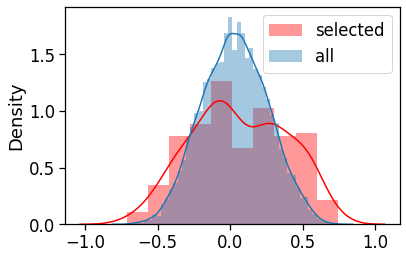

In [758]:
selected = subsum[['%s_%s'%(x,stat) for x in genes if x in gxp.index]].mean()
allrs = subsum[[x for x in subsum.columns if '_%s'%stat in x]].mean()
sns.distplot(selected,label='selected',color='red')
sns.distplot(allrs,label='all')
plt.legend()

In [272]:
# for x in [x.split('_r')[0] for x in sig]:
#     print(x)

In [759]:
sig = []
thr = round(len(allrs)*0.025)
cil = allrs.sort_values().values[thr]
ciu = allrs.sort_values().values[-thr]
print('CI:',cil,ciu)
for x in selected.index:
    if selected[x] >= ciu or selected[x] <= cil:
        sig.append(x)
print('# significant:',len(sig))
print(sig)

CI: -0.40218253968253975 0.47546296296296287
# significant: 53
['ME1_rho', 'MGAT4C_rho', 'RSPO4_rho', 'CNGB1_rho', 'GFAP_rho', 'NKAIN4_rho', 'SCN7A_rho', 'SGSH_rho', 'SLC26A11_rho', 'GOLT1A_rho', 'CHODL_rho', 'NWD1_rho', 'PCBD1_rho', 'DBX2_rho', 'RASL12_rho', 'WDR66_rho', 'CXorf57_rho', 'GPR143_rho', 'AQP1_rho', 'FERMT1_rho', 'PCDH17_rho', 'RGS22_rho', 'LRRC36_rho', 'SCN9A_rho', 'KLHL13_rho', 'PIRT_rho', 'LRRN1_rho', 'VWA5A_rho', 'SIX3_rho', 'VAT1L_rho', 'HSPB8_rho', 'KCNA5_rho', 'ZIC1_rho', 'ZMYND10_rho', 'CPLX2_rho', 'COX7A1_rho', 'ST3GAL6_rho', 'TBR1_rho', 'SEMA7A_rho', 'FAM13A_rho', 'NFIC_rho', 'BID_rho', 'CABP1_rho', 'PLEKHM2_rho', 'ATP2B2_rho', 'UBE2QL1_rho', 'TSPAN1_rho', 'BEND6_rho', 'KLF13_rho', 'CNKSR2_rho', 'MICAL2_rho', 'NDRG3_rho', 'SCRT1_rho']


In [ ]:
# vis_pass = ['MBP','LIMS2','WDR78','LDHD','TPP3','ID4','MAOB',
#            'HES5','TRPS1','CAPB1','DBX2','RASL12','FERMT1',
#            'SCN9A','KLHL13','VWA54']

In [41]:
# for gene in sig:
#     g=sns.lmplot(x='log_age_months',y=gene,
#             #hue='gender',
#             lowess=True,
#              #scatter_kws={'color':'k'},
#            data=subsum)
#     plt.title(gene.split('_')[0])
#     plt.show()

In [760]:
c2ss = pandas.DataFrame(subsum[[x for x in subsum.columns[20:] if x.split('_')[-1] == stat and \
                                                        x.split('_')[0] in genes]],
                       copy=True)
c2ss.drop([x for x in c2ss.index if all(~pandas.notnull(c2ss.loc[x]))],axis=0,inplace=True)
c2ss.drop([x for x in c2ss.columns if any(~pandas.notnull(c2ss.loc[:,x]))],axis=1,inplace=True)

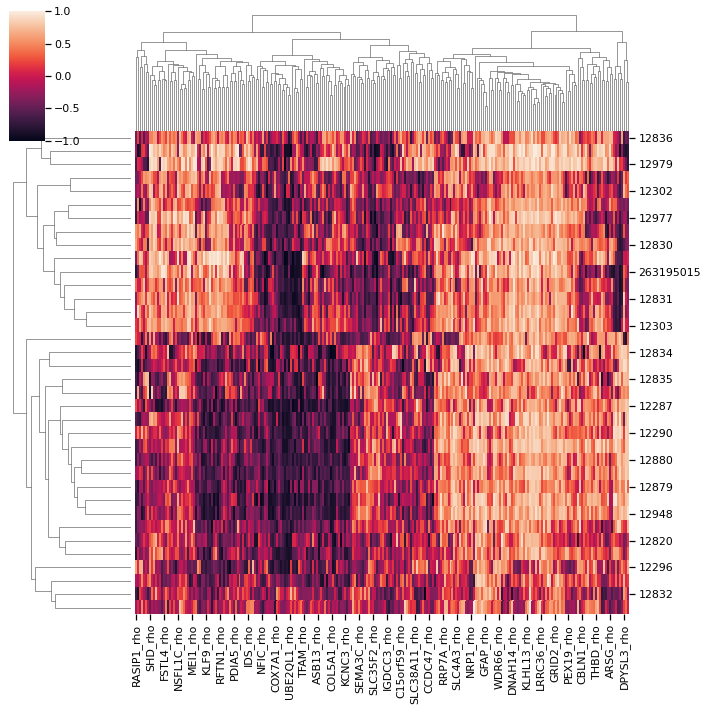

In [761]:
sns.set_context('notebook',font_scale=1)
g = sns.clustermap(c2ss)

In [305]:
subsum.loc[g.data2d.index]['age']

12836        21 pcw
13058        16 pcw
12979        19 pcw
12949         9 pcw
12302         8 pcw
12833        24 pcw
12977        16 pcw
12889        16 pcw
12830        17 pcw
12365        13 pcw
263195015    12 pcw
12980        13 pcw
12831        12 pcw
12295        13 pcw
12303        12 pcw
12304        37 pcw
12834         4 yrs
12890         8 yrs
12835        11 yrs
13057         8 yrs
12287        23 yrs
12886         1 yrs
12290        21 yrs
12837        36 yrs
12880        40 yrs
12288        13 yrs
12879        37 yrs
12960        30 yrs
12948        19 yrs
12299        10 mos
12820         4 mos
12841         4 mos
12296         3 yrs
12984         2 yrs
12832         3 yrs
12300        18 yrs
Name: age, dtype: object

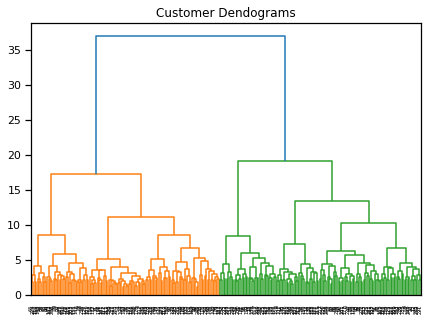

In [762]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(7, 5))
plt.title("Customer Dendograms")
link = shc.linkage(c2ss.T.values, method='ward')
dend = shc.dendrogram(link)

In [582]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.cluster import AgglomerativeClustering

csol = pandas.DataFrame()
for i,k in enumerate(range(2,100)):
    #print('working on k =',k)
    d = c2ss.T.values
    cluster = AgglomerativeClustering(n_clusters=k, affinity='euclidean', 
                                  linkage='ward')
    cluster.fit_predict(d)
    csol.loc[i,'k'] = k
    csol.loc[i,'sil_score'] = silhouette_score(d,cluster.labels_,random_state=123)
    csol.loc[i,'ch_score'] = calinski_harabasz_score(d,cluster.labels_)

<AxesSubplot:xlabel='k', ylabel='sil_score'>

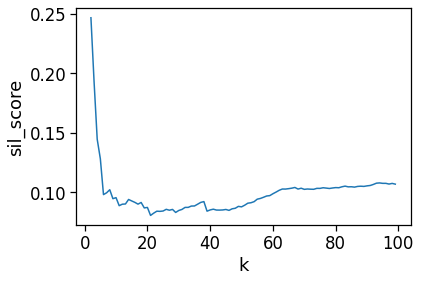

In [583]:
sns.lineplot(x='k',y='sil_score',data=csol)

In [ ]:
peaks = [2,8,12,38]

<AxesSubplot:>

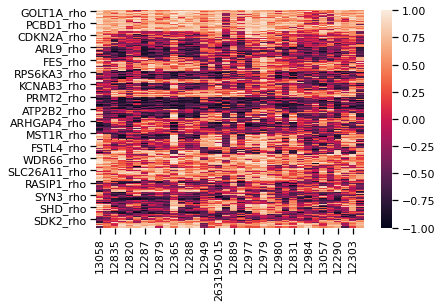

In [763]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=38, affinity='euclidean', 
                                  linkage='ward')
cluster.fit_predict(c2ss.T.values)
data = pandas.DataFrame(c2ss.T,copy=True)
data.loc[:,'labels'] = cluster.labels_
sns.heatmap(data.sort_values('labels')[data.columns[:-1]])

In [764]:
cplots = data.groupby('labels').mean().T
cplots.columns = ['cluster%s'%x for x in cplots.columns]
for col in subsum.columns[:20]:
    cplots.loc[:,col] = subsum.loc[c2ss.index,col].values
cplots.head()

,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8,cluster9,...,Age_Period,MacroStructure,MacroStructure2,NT_Segment,Sensorifugal,age_level,age_in_months,log_age_months,age_in_weeks,log_age_weeks
13058,0.828571,0.671429,0.638089,-0.168831,0.580952,0.577143,-0.136508,0.200000,-0.118367,-0.150000,...,p4,Frontal,Frontal,Tele,Association,4,3.678161,1.302413,16.000,2.772589
12833,0.643056,0.424190,0.264133,-0.434367,0.055556,0.121667,-0.176042,-0.130000,0.016667,-0.231250,...,p6,Limbic,Limbic,Tele,Association,8,5.517241,1.707878,24.000,3.178054
12835,0.614583,0.321429,-0.295455,-0.668831,-0.422619,0.253571,-0.492063,-0.142857,-0.326531,0.669643,...,p11,Frontal,Frontal,Tele,Association,20,132.000000,4.882802,611.105,6.415269
12960,0.697031,-0.020833,-0.083333,-0.720788,0.019444,0.711667,-0.729630,0.463333,-0.616667,0.545833,...,p12,Temporal,Temporal,Tele,Association,27,360.000000,5.886104,1599.105,7.377199
12820,0.452381,0.040179,-0.152597,-0.139610,-0.160714,0.021429,-0.293651,0.207143,-0.341837,0.035714,...,p8,Temporal,Temporal,Tele,Association,13,4.000000,1.386294,56.485,4.033975


-0.159


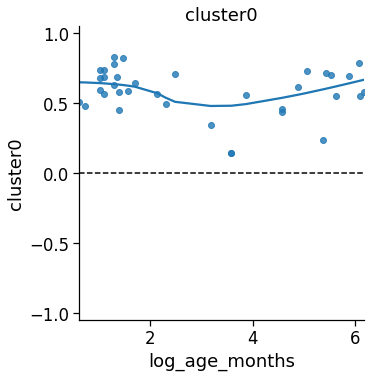

-0.52


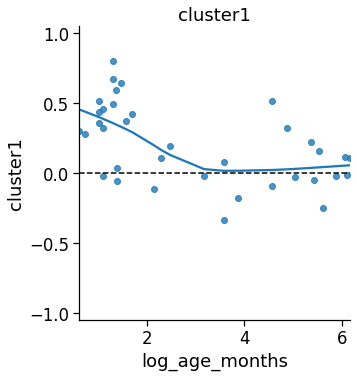

-0.7


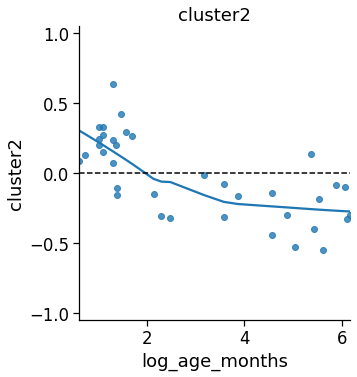

-0.742


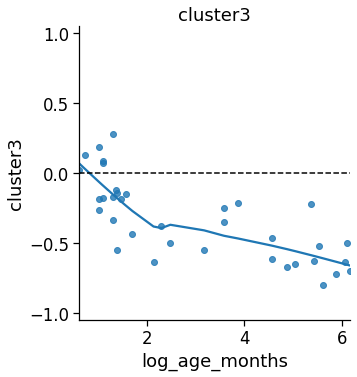

-0.074


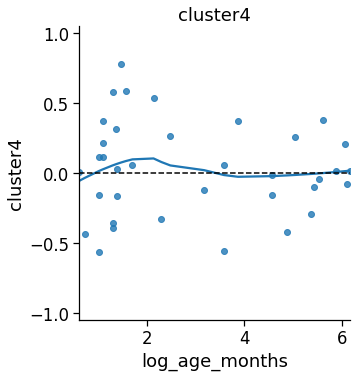

0.524


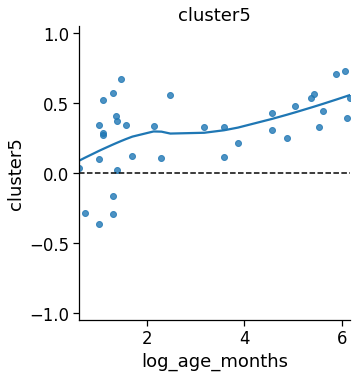

-0.224


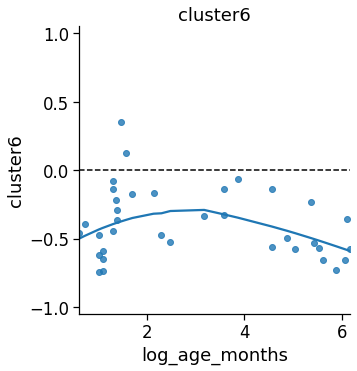

0.003


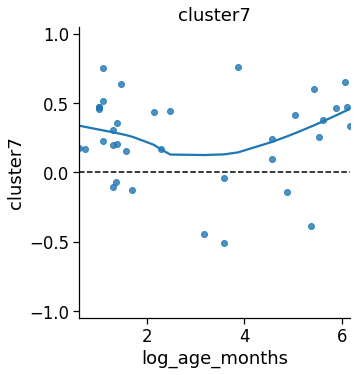

-0.711


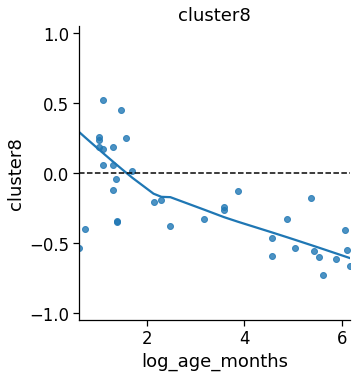

0.41


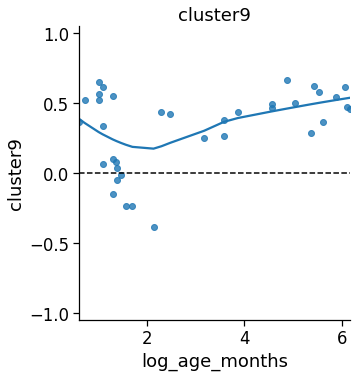

-0.227


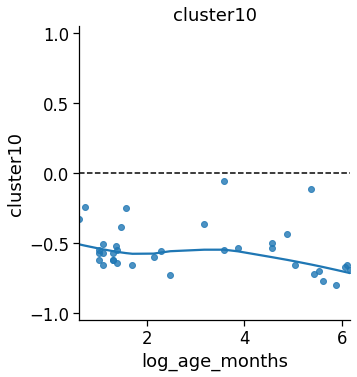

-0.311


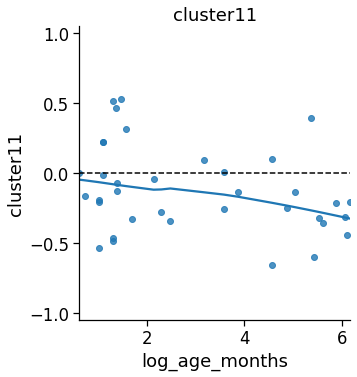

-0.736


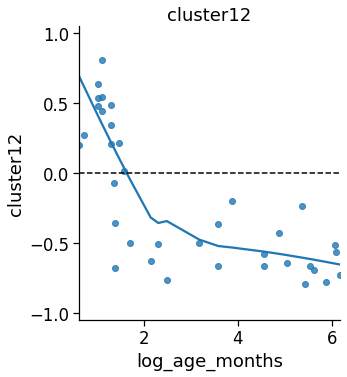

0.051


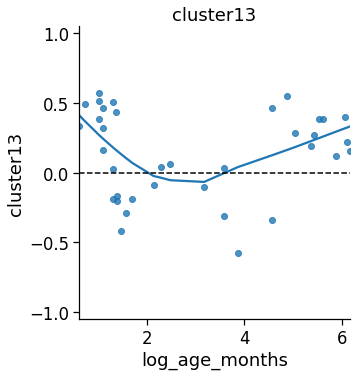

0.813


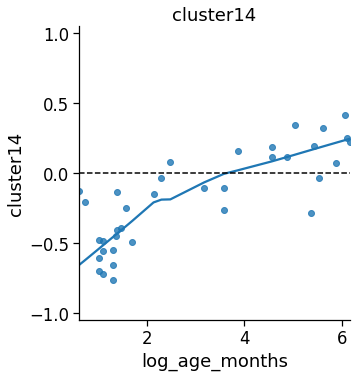

0.224


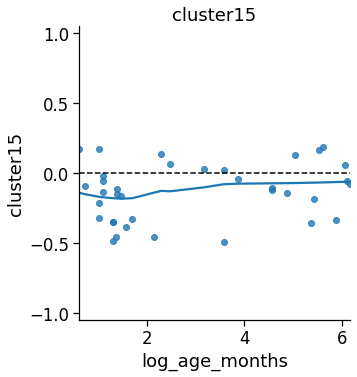

-0.863


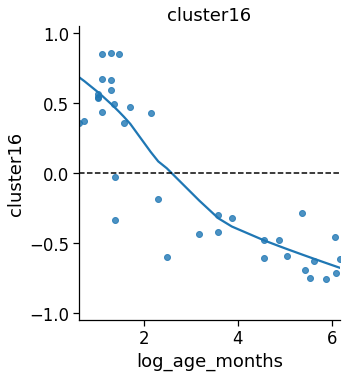

-0.708


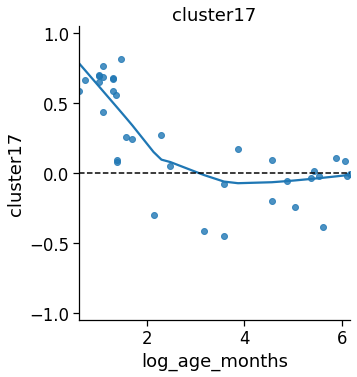

-0.295


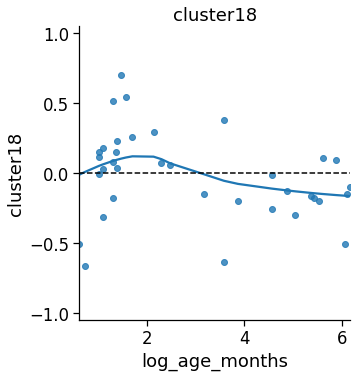

0.696


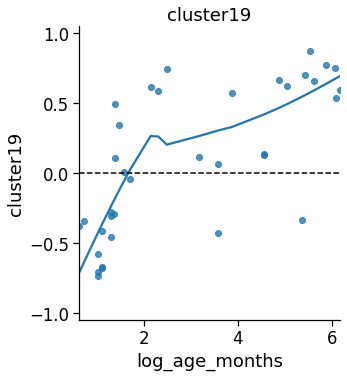

-0.293


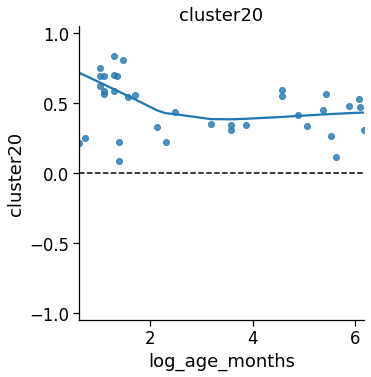

0.206


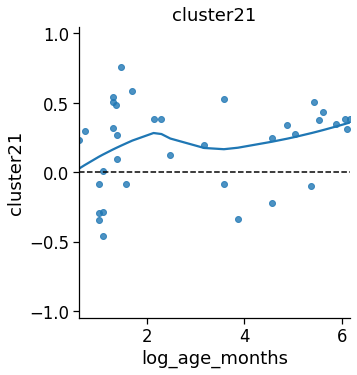

0.21


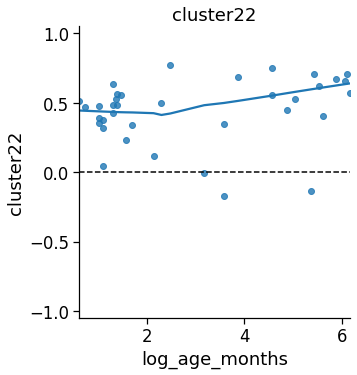

-0.312


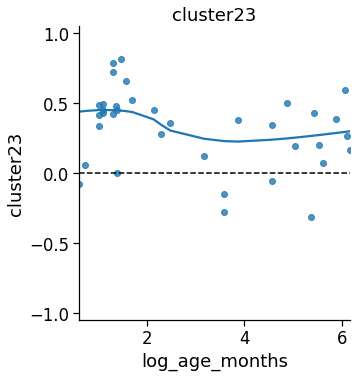

-0.344


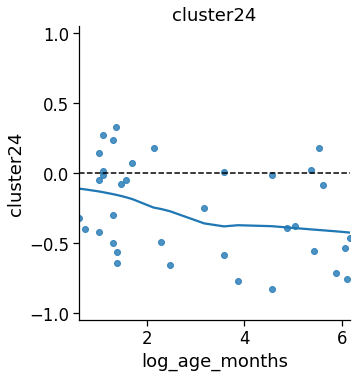

-0.116


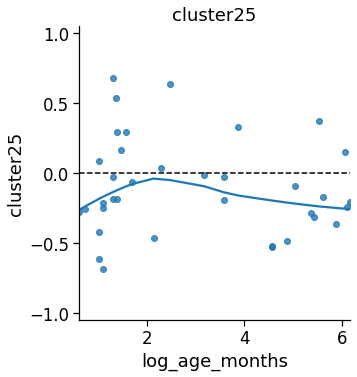

0.222


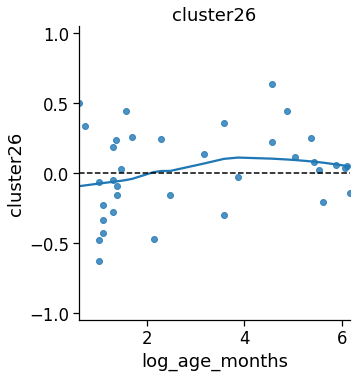

0.859


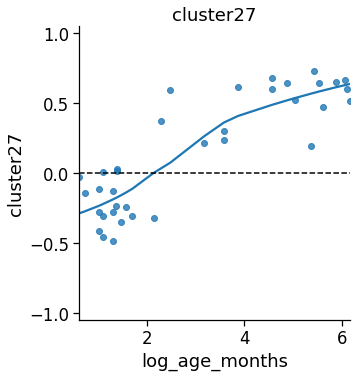

-0.297


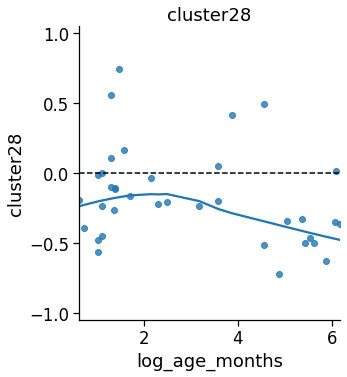

-0.656


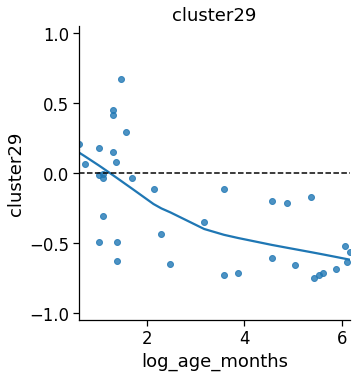

-0.536


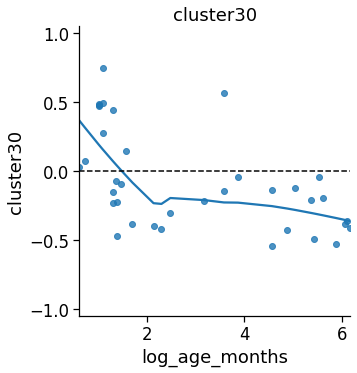

-0.892


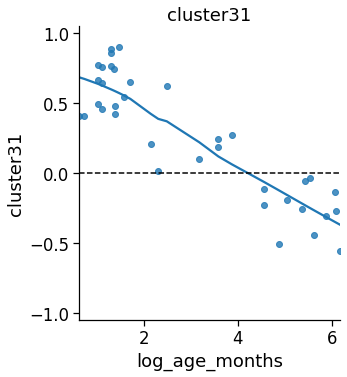

-0.598


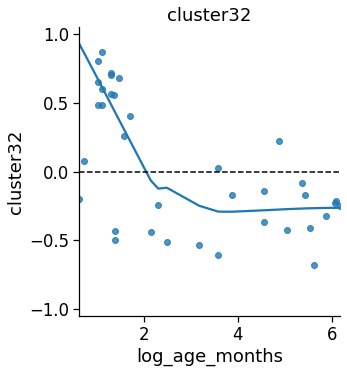

-0.593


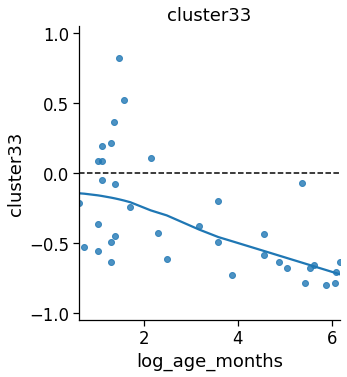

0.381


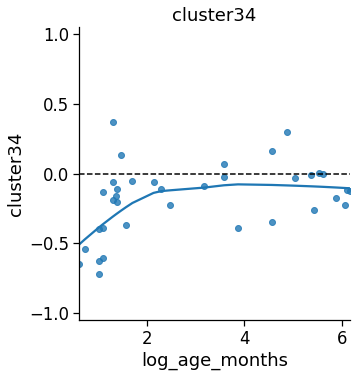

0.518


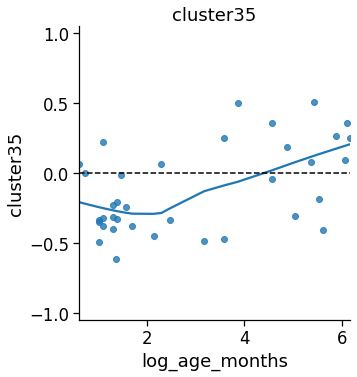

0.151


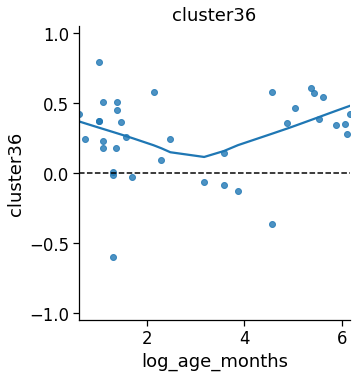

0.555


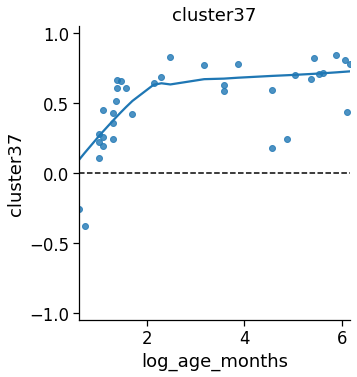

In [593]:
for cluster in [x for x in cplots.columns if 'cluster' in x]:
    r,p = stats.pearsonr(cplots[cluster].values,cplots.log_age_months.values)
    g=sns.lmplot(x='log_age_months',y=cluster,
            #hue='gender',
            lowess=True,
             #scatter_kws={'color':'k'},
           data=cplots)
    plt.ylim(-1.05,1.05)
    plt.axhline(0,ls='--',c='k')
    plt.title(cluster)
    print(round(r,3))
    plt.show()

In [ ]:
[0,5?,7?,9?,10,13?,20?,22,23?]

In [766]:
cplots.loc[:,'ind'] = cplots.index

In [767]:
tall = pandas.melt(cplots,id_vars='ind',
                   value_vars=[x for x in cplots.columns if 'cluster' in x])
tall.loc[:,'log_age_months'] = cplots.log_age_months.tolist() * len(tall.variable.unique())

In [769]:
colors = []
for clust in tall.variable.unique():
    r,p = stats.pearsonr(cplots[clust].values,cplots.log_age_months.values)
    if clust in ['cluster0','cluster10','cluster22']:
        colors.append('black')
    elif r < 0:
        colors.append('lightsteelblue')
    else:
        colors.append('lightcoral')

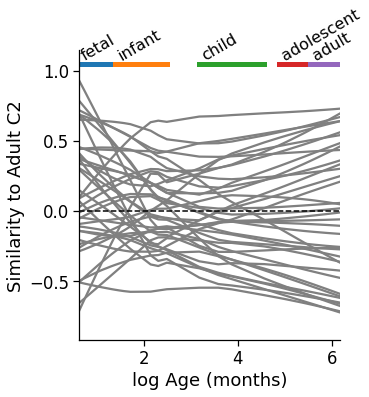

In [863]:
from matplotlib.collections import LineCollection

sns.set_context('notebook',font_scale=1.5)
g=sns.lmplot(x='log_age_months',y='value',
            hue='variable',lowess=True,
             markers='',palette=['gray']*len(tall.variable.unique()),#palette=colors,
             legend=None,data=tall)
plt.ylabel('Similarity to Adult C2')
plt.xlabel('log Age (months)')

for stage in gdf.Age_Stage.unique():
    levels = gdf[gdf.Age_Stage==stage]['log_age_months'].values
    xmin = np.min(levels)
    xmax = np.max(levels)
    plt.plot([xmin,xmax],[1.05,1.05],lw=5)
    #loc = xmin + (xmax-xmin)*.5
    plt.text(xmin,1.05,stage,fontsize=16,ha='left',
             va='bottom',rotation=30)
plt.axhline(0,c='k',ls='--')
plt.savefig(os.path.join(fig_dir,'cluster_timelinesC2_k38_gray.pdf'),bbox_inches='tight')

#### Criteria
* Mostly genes from one tail
* Goes in the expected direction
* Reaches r > 0.5 at some point

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='log_age_months', ylabel='value'>

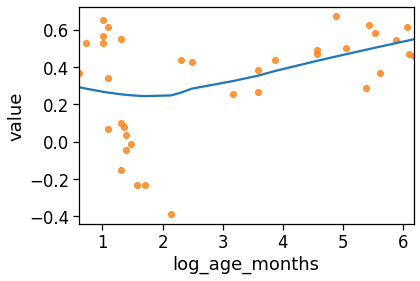

In [615]:
c = 9
jnk = g.ax.lines[c]
sns.regplot(jnk.get_data()[0],jnk.get_data()[1],lowess=True,scatter=False)
sns.regplot(x='log_age_months',y='value',data=tall[tall.variable=='cluster%s'%c],
           fit_reg=False)

In [772]:
crit = pandas.DataFrame(data['labels'].unique())

### CHANGE THIS DEPENDING ON COMPONENT
posg = c2[c2.expr>0].gene_symbol
negg = c2[c2.expr<0].gene_symbol

flats = [0,10,22]
for clust in data['labels'].unique():
    cluster = 'cluster'+str(clust)
    cgenes = [x.split('_')[0] for x in data[data.labels==clust].index]
    npos = len([x for x in cgenes if x in posg])
    nneg = len([x for x in cgenes if x in negg])
    
    # mostly genes from one tail
    if (npos+0.001) / (nneg+0.001) > 3:
        direction = 'pos'
    elif (npos+0.001) / (nneg+0.001) < 0.33:
        direction = 'neg'
    else:
        direction = 'ambiguous'
    crit.loc[clust,'direction'] = direction
    
    # goes in the expected direction
    r,p = stats.spearmanr(cplots[cluster].values,cplots.log_age_months.values)
    mn = cplots[cplots.log_age_months>4][cluster].values.mean() # mean signal post childhood
    if clust in flats:
        cor = 'flat'
    elif r < 0:
        cor = 'neg'
    else:
        cor = 'pos'
    crit.loc[clust,'correlation'] = cor
    crit.loc[clust,'rho'] = r
    if mn > 0:
        mean = 'pos'
    else:
        mean = 'neg'
    crit.loc[clust,'meandir'] = mean
    crit.loc[clust,'mean'] = mn
    if mean == direction:
        crit.loc[clust,'mean_match'] = 1
    else:
        crit.loc[clust,'mean_match'] = 0
    if cor == direction:
        crit.loc[clust,'cor_match'] = 1
    else:
        crit.loc[clust,'cor_match'] = 0
    
    # Reaches r > 0.5 at some point
    fitted = g.ax.lines[clust] # this comes from the multiline lmplot a few cells up
    max_r = np.max(abs(fitted.get_data()[1]))
    if max_r > 0.5:
        strength = True
        crit.loc[clust,'strenth_match'] = 1
    else:
        strength = False
        crit.loc[clust,'strenth_match'] = 0
    crit.loc[clust,'max_r'] = max_r
    
    # all criteria
    hit = False
    if cor == 'flat':
        hit = True
    else:
        if direction != 'ambiguous' and \
               crit.loc[clust,'mean_match'] == 1 and strength:
            hit = True
    if hit:
        crit.loc[clust,'hit'] = 1
    else:
        crit.loc[clust,'hit'] = 0
            
            

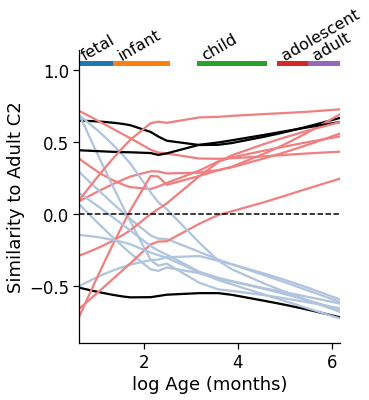

In [773]:
# derive colors and line styles
colors = []
for c,row in crit[crit.hit==1].iterrows():
    if row['correlation'] == 'flat':
        colors.append('black')
    elif row['direction'] == 'pos':
        colors.append('lightcoral')
    else:
        colors.append('lightsteelblue')

hits = ['cluster%s'%x for x in crit[crit.hit==1].index]
# plot
sns.set_context('notebook',font_scale=1.5)
g2=sns.lmplot(x='log_age_months',y='value',
            hue='variable',lowess=True,
             markers='',palette=colors,
             legend=None,data=tall[tall.variable.isin(hits)])
plt.ylabel('Similarity to Adult C2')
plt.xlabel('log Age (months)')

for stage in gdf.Age_Stage.unique():
    levels = gdf[gdf.Age_Stage==stage]['log_age_months'].values
    xmin = np.min(levels)
    xmax = np.max(levels)
    plt.plot([xmin,xmax],[1.05,1.05],lw=5)
    #loc = xmin + (xmax-xmin)*.5
    plt.text(xmin,1.05,stage,fontsize=16,ha='left',
             va='bottom',rotation=30)
plt.axhline(0,c='k',ls='--')
plt.savefig(os.path.join(fig_dir,'cluster_timelinesC2_k38_postcrit.pdf'),bbox_inches='tight')

#### next criteria
* define peak
* define SD of variation
* find the point in lifespan where trajectory ceases to be different from peak

#### scratch that
* Divide r into age epochs
* find binary sig diffs between epochs for r
* categorize based on that

In [375]:
cplots.Age_Stage.value_counts()

fetal         16
child          6
adult          6
infant         4
adolescent     4
Name: Age_Stage, dtype: int64

<AxesSubplot:xlabel='Age_Stage'>

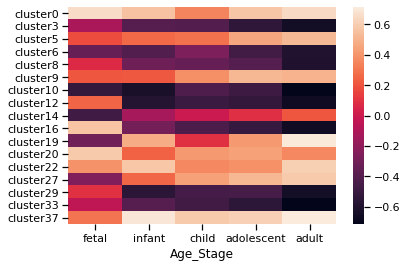

In [601]:
sns.set_context('notebook',font_scale=1)
order = ['fetal','infant','child','adolescent','adult']
sns.heatmap(cplots.groupby('Age_Stage')[hits].mean().T[order])

In [602]:
def balanced_subsample(y, size=None):

    subsample = []

    if size is None:
        n_smp = y.value_counts().min()
    else:
        n_smp = int(size / len(y.value_counts().index))

    for label in y.value_counts().index:
        samples = y[y == label].index.values
        index_range = range(samples.shape[0])
        indexes = np.random.choice(index_range, size=n_smp, replace=False)
        subsample += samples[indexes].tolist()

    return subsample

In [603]:
cplots.Age_Stage.value_counts()

fetal         16
child          6
adult          6
infant         4
adolescent     4
Name: Age_Stage, dtype: int64

In [604]:
groupdifs = []

for clust in hits :
    print('working on',clust)
    for i in range(1):#00):
        # subsample so all categories have 4 subjects
        ss = balanced_subsample(cplots.Age_Stage)
        ssdf = cplots.loc[ss]
        # get omnibus stats
        F,p = stats.f_oneway(ssdf[ssdf.Age_Stage=='fetal'][clust].values,
                  ssdf[ssdf.Age_Stage=='infant'][clust].values,
                  ssdf[ssdf.Age_Stage=='child'][clust].values,
                  ssdf[ssdf.Age_Stage=='adolescent'][clust].values,
                  ssdf[ssdf.Age_Stage=='adult'][clust].values)
        # store tukey hd output
        output = pairwise_tukeyhsd(cplots[clust],cplots.Age_Stage)
        gdiff = pandas.DataFrame(np.array(output.summary().data[1:]),
                        columns = output.summary().data[0])
        # annotate and index
        gdiff.loc[:,'F'] = F
        gdiff.loc[:,'p'] = p
        gdiff.loc[:,'cluster'] = clust
        gdiff.loc[:,'i'] = i
        groupdifs.append(gdiff)
# combine all results
results = pandas.concat(groupdifs)

working on cluster0
working on cluster3
working on cluster5
working on cluster6
working on cluster8
working on cluster9
working on cluster10
working on cluster12
working on cluster14
working on cluster16
working on cluster19
working on cluster20
working on cluster22
working on cluster27
working on cluster29
working on cluster33
working on cluster37


In [605]:
def func(x):
    if x == 'False':
        return 0
    else:
        return 1

results.loc[:,'reject'] = results.reject.apply(func).values

In [606]:
for i,row in results.iterrows():
    results.loc[i,'group'] = '%s_%s'%(row['group1'],row['group2'])

I checked and, despite having random samples, every iteration had the same results (not surprising given most of the variation was coming from large effect size group

In [607]:
jnk = pandas.DataFrame(results[results.i==0])

In [608]:
jnk.loc[:,'ind'] = range(len(jnk))
jnk.pivot(index='group',columns='cluster',values='reject')

cluster,cluster0,cluster10,cluster12,cluster14,cluster16,cluster19,cluster20,cluster22,cluster27,cluster29,cluster3,cluster33,cluster37,cluster5,cluster6,cluster8,cluster9
group,,,,,,,,,,,,,,,,,
adolescent_adult,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
adolescent_child,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
adolescent_fetal,0,0,1,1,1,1,0,0,1,1,1,0,0,0,0,1,0
adolescent_infant,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
adult_child,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
adult_fetal,0,0,1,1,1,1,1,0,1,1,1,1,1,0,0,1,0
adult_infant,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
child_fetal,1,0,1,1,1,0,0,0,1,1,1,0,0,0,0,1,0
child_infant,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


* C0: Child - Adult (flat)
* C2: Fetal - Child
* C5: - (Fetal - Infant)
* C6: - (non-mon)
* C8: Fetal - Infant
* C9: - (non-mon)
* C10: Child - Adult (flat)
* C12: Fetal - Infant
* C14: Fetal - Infant
* C16: Fetal - Infant - Adult
* C19: Fetal - Infant
* C20: Fetal - Infant
* C22: - (Flat)
* C27: Fetal - Infant - Adult
* C29: Fetal - Infant
* C33: Fetal - Adult
* C37: Fetal - Infant

In [785]:
cats = dict(zip(hits,['fetal_nl','child','infant','fetal_nl','infant','fetal_nl',
                      'fetal_nl','infant','infant','postchild','infant','infant','fetal_nl',
                      'postchild','infant','postchild','infant']))
colos = dict(zip(['fetal_nl','infant','child','postchild'],
                sns.color_palette('tab20',4)))
pal = [colos[x] for x in cats.values()]

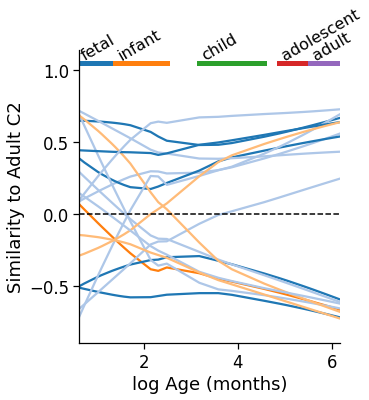

In [787]:
# plot
sns.set_context('notebook',font_scale=1.5)
g2=sns.lmplot(x='log_age_months',y='value',
            hue='variable',lowess=True,
             markers='',palette=pal,
             legend=None,data=tall[tall.variable.isin(hits)])
plt.ylabel('Similarity to Adult C2')
plt.xlabel('log Age (months)')

for stage in gdf.Age_Stage.unique():
    levels = gdf[gdf.Age_Stage==stage]['log_age_months'].values
    xmin = np.min(levels)
    xmax = np.max(levels)
    plt.plot([xmin,xmax],[1.05,1.05],lw=5)
    #loc = xmin + (xmax-xmin)*.5
    plt.text(xmin,1.05,stage,fontsize=16,ha='left',
             va='bottom',rotation=30)
plt.axhline(0,c='k',ls='--')
plt.savefig(os.path.join(fig_dir,'cluster_timelinesC2_k38_posttiming.pdf'),bbox_inches='tight')

In [834]:
for i,row in crit.iterrows():
    c = 'cluster%s'%i
    if c in cats.keys():
        crit.loc[i,'category'] = cats[c]

In [836]:
keepers = []
for clust in crit[crit.category=='child'][0].values:
    jnk = data[data.labels==clust]
    for x in jnk.index:
        j2 = x.split('_')[0]
        #print(j2)
        keepers.append(j2)
    #print('\n\n')
np.array(keepers)

array(['IDS', 'PDIA5', 'LXN', 'SMPX', 'PPM1H', 'CTNNAL1', 'C5orf24',
       'ARL9', 'RAD54B', 'LYRM4', 'MYBPHL'], dtype='<U7')

In [622]:
keepers = []
for clust in crit[crit.category=='postchild'][0].values:
    jnk = data[data.labels==clust]
    for x in jnk.index:
        j2 = x.split('_')[0]
        #print(j2)
        keepers.append(j2)
    #print('\n\n')
np.array(keepers)

array(['ARHGAP4', 'GRP', 'WTIP', 'ST20', 'PRR5', 'SCN1B', 'TFAM', 'DCPS',
       'NNMT', 'KCNAB3', 'RTKN2', 'PRC1', 'ENOX1', 'SOX11', 'CACNA1H',
       'DDAH2'], dtype='<U7')

In [572]:
jnk = subsum[subsum.Age_Stage.isin(['adult','adolescent'])]
jnk = jnk[[x for x in jnk.columns if 'rho' in x]].mean()
corgenes = [x.split('_')[0] for x in jnk[jnk>0.5].index]


In [576]:
gdf.loc[:,'C2_topcor_gxp'] = gxp.loc[corgenes].mean().values

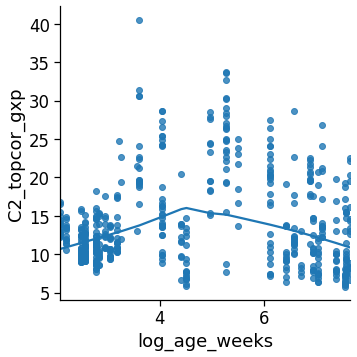

In [577]:
sns.lmplot(x='log_age_weeks',y='C2_topcor_gxp',data=gdf,lowess=True)

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/statsmodels/nonparametric/smoothers_lowess.py:215: RuntimeWarning: invalid value encountered in greater_equal
  frac=frac, it=it, delta=delta, given_xvals=False)


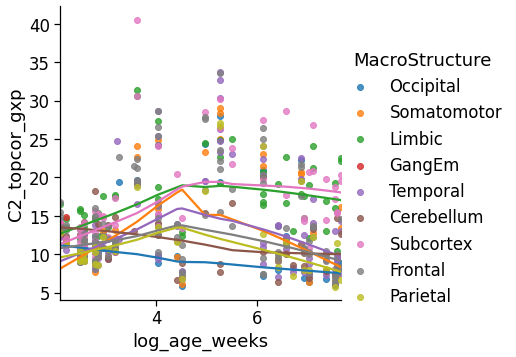

In [580]:
sns.lmplot(x='log_age_weeks',y='C2_topcor_gxp',data=gdf,lowess=True,hue='MacroStructure')

In [799]:
sorder = [x for x in subsum.sort_values('log_age_weeks').donor_id.values if x in c2ss.T.columns]

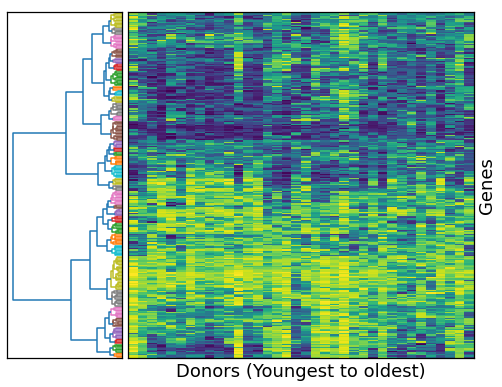

In [809]:
# Dendrogram that comes to the left

D = pandas.DataFrame(c2ss.T[sorder], copy=True)
D = D.values

fig = plt.figure(figsize=(8,8))
# Add an axes at position rect [left, bottom, width, height]
ax1 = fig.add_axes([0.09, 0.1, 0.2, 0.6])
Y = link
# orientation='left' is reponsible for making the 
# dendrogram appear to the left
Z1 = shc.dendrogram(Y, orientation='left',color_threshold=4)
ax1.set_xticks([])
ax1.set_yticks([])

# main heat-map
axmatrix = fig.add_axes([0.3, 0.1, 0.6, 0.6])
idx1 = Z1['leaves']
D = D[idx1, :]
# the actual heat-map
im = axmatrix.matshow(D, aspect='auto', origin='lower', cmap="viridis")
axmatrix.set_xticks([])
axmatrix.set_yticks([])
axmatrix.yaxis.set_label_position('right')
plt.xlabel('Donors (Youngest to oldest)',)
plt.ylabel('Genes')


plt.savefig(os.path.join(fig_dir,'DendoC2.pdf'),bbox_inches='tight')
plt.show()

In [624]:
# keepers = []
# for clust in [0,1,2]:
#     jnk = data[data.labels==clust]
#     for x in jnk.index:
#         j2 = x.split('_')[0]
#         print(j2)
#         keepers.append(j2)
#     print('\n\n')

In [826]:
allendir = '/Users/jacobv/abagen-data/microarray/'
probes = pandas.read_csv(os.path.join(allendir,'normalized_microarray_donor10021/Probes.csv'))
bigdf = pandas.read_csv('/Users/jacobv/Downloads/bigdf.csv',index_col=0)
probes = probes[probes.gene_symbol.isin(bigdf.columns)]

In [840]:
x

92949

In [849]:
jnkF = ['HS3ST1', 'ATP4A', 'PLEKHM2', 'KCNC1', 'KCNC3', 'SCRT1', 'THEMIS',
       'PELI3', 'EIF4E1B', 'CAMK1D', 'ASB13', 'KCNG1', 'ADAMTSL1',
       'FABP5P3', 'ATP2B3', 'NDRG3', 'NFIC', 'PPFIA4', 'BEND6', 'ZBTB8A',
       'GLIS1', 'RPS6KA3', 'SECISBP2', 'SDK2', 'SEMA3C', 'ANKRD50',
       'ROBO2', 'HRH3', 'SLC4A3', 'TSPAN2', 'AMIGO2', 'SKAP1', 'SLC26A11',
       'SGSH', 'GPRIN2']
jnkI = ['IDS', 'PDIA5', 'LXN', 'SMPX', 'PPM1H', 'CTNNAL1', 'C5orf24',
       'ARL9', 'RAD54B', 'LYRM4', 'MYBPHL', 'BID', 'ST3GAL6', 'TSPAN1',
       'MICAL2', 'TBR1', 'SEMA7A', 'FAM13A', 'CPLX2', 'CNKSR2', 'ATP2B2',
       'CABP1', 'COX7A1', 'KLF13', 'UBE2QL1', 'WISP2', 'FABP5', 'GPX3',
       'ADCYAP1R1', 'PITPNC1', 'CYB5R1', 'MT1F', 'RYR3', 'ITPKC', 'FRAT1',
       'FRAT2', 'CUX1', 'DSP', 'ARSG', 'LPP', 'SLC38A11', 'FES', 'RCSD1',
       'PCSK5', 'NTSR1', 'SLC35F2', 'PAX8', 'SYT6', 'IL17RD', 'ADAMTS9',
       'NAV2', 'TSKU', 'AEBP1', 'SLC27A6', 'PRRX1', 'TGFBI', 'COL21A1',
       'APLNR', 'GXYLT2', 'NUPR1', 'THBD', 'TCEA3', 'CENPJ', 'CCDC88B',
       'SYCP2', 'COL27A1']
jnkC = ['ARHGAP4', 'GRP', 'WTIP', 'ST20', 'PRR5', 'SCN1B', 'TFAM', 'DCPS',
       'NNMT', 'KCNAB3', 'RTKN2', 'PRC1', 'ENOX1', 'SOX11', 'CACNA1H',
       'DDAH2'] + ['IDS', 'PDIA5', 'LXN', 'SMPX', 'PPM1H', 'CTNNAL1', 'C5orf24',
       'ARL9', 'RAD54B', 'LYRM4', 'MYBPHL']
for x in jnkC: print(x)
# string = ''
# for x in jnk: 
#     string+=(x+' ')
# print(string)
# j2 = probes[probes.gene_symbol.isin(jnkI)].groupby('gene_symbol'
#                                             ).entrez_id.first().values.astype(int)
# string = ''
#for x in j2: print(x)
# for x in j2: 
#     string+=(str(x)+' ')
# print(string)

ARHGAP4
GRP
WTIP
ST20
PRR5
SCN1B
TFAM
DCPS
NNMT
KCNAB3
RTKN2
PRC1
ENOX1
SOX11
CACNA1H
DDAH2
IDS
PDIA5
LXN
SMPX
PPM1H
CTNNAL1
C5orf24
ARL9
RAD54B
LYRM4
MYBPHL


In [831]:
# j2 = probes.groupby('gene_symbol'
#                    ).entrez_id.first().values.astype(int)
# for x in j2: print(x)

1
2
144568
53947
8086
65985
126767
51166
195827
79719
22848
14
15
441376
16
57505
132949
60496
10157
26574
9625
18
19
10349
79963
20
21
23461
23460
10347
10351
10350
5243
23456
10058
22
11194
23457
4363
89845
94160
10057
368
6833
10060
225
5825
5826
6059
23
10061
55324
9619
9429
64137
64241
84696
55347
83451
26090
145447
84945
25864
84836
11057
171586
63874
51099
57406
79575
10006
10152
51225
25
27
3983
84448
22885
29
29777
80325
25841
30
10449
31
32
80724
84129
27034
28976
33
34
36
37
176
23527
116983
38
39
64746
79777
91452
84320
414149
84680
65057
1636
340485
55331
43
22985
47
48
50
26027
55856
10965
122970
11332
10005
23597
51
8309
8310
52
53
54
51205
55
49
84519
23205
80221
197322
2180
2181
2182
23305
116285
123876
54988
84532
55902
79611
58
59
60
345651
70
71
648740
72
86
51412
81569
87
88
81
55860
10121
10120
10097
10096
57180
440888
79913
64431
93973
90
91
130399
92
93
94
91703
97
98
100
161931
161823
102
4185
8751
6868
8728
8748
53616
8745
10863
11086
80332
8756
101
8754
9510


836
837
838
839
840
841
9994
842
844
831
54897
847
440278
857
858
9139
863
865
867
868
79872
869
147381
140689
873
874
84869
55871
220869
10951
84733
11335
8535
23468
23466
23492
25776
54862
200014
57545
55749
147372
92922
79839
388389
29903
203260
256309
153733
29070
93233
84317
150275
151903
90060
79635
160857
115098
202243
90693
133957
81576
79879
64753
339230
165055
64770
285025
84865
339184
57639
130940
91050
80071
115948
100129792
283152
645811
550631
339965
100130274
28952
149473
55246
25901
79140
83643
728621
91057
339829
55036
124808
57003
152137
79714
284001
131076
29080
8030
729440
85478
285331
80323
26112
221016
83446
64925
91409
84318
124093
83987
151887
79780
338657
114800
11007
317762
79080
55231
55704
283234
440193
26093
60492
55297
80212
54520
257236
90324
54535
881
885
887
6361
6363
6347
6366
6367
6369
6370
10850
56477
83605
8900
891
57820
85417
892
595
894
896
23582
898
9134
899
900
901
902
10983
645121
54619
8812
57018
81669
10309
904
905
219771
151195
1230
2826
123

84661
1806
1808
1809
10570
56896
1810
55332
128338
10589
1812
1813
1815
4733
1819
1821
1826
57453
79075
29940
92126
79980
1832
667
11034
25778
92675
1837
1838
84062
56986
285605
1840
113878
441263
196403
151636
23220
1841
64118
56931
11062
1843
11221
8446
11266
11072
128853
80824
150290
142679
1844
56940
54935
78986
285193
1845
1846
1848
1849
1850
1852
1854
1855
1856
1857
84332
54808
1778
1780
1781
51143
1783
79659
51626
8655
140735
83658
83657
6993
6990
1859
9149
8445
8444
8798
8291
391475
22873
9666
1869
1871
1874
1875
1876
1877
85403
55840
55837
124454
9166
1879
57593
10148
55096
10969
10682
84650
11319
1889
9427
1891
55862
55268
79746
1892
1893
1842
641700
51295
1894
1896
128178
80153
23644
9695
80267
8721
10085
1906
1908
1909
1910
8411
8726
1915
1917
1933
1936
1937
1938
29904
60678
80820
79645
90141
84288
64800
84455
2202
30008
151651
114327
80258
80303
79180
1942
1943
1944
1945
1946
1947
1948
1949
23167
22979
10278
9343
93556
51162
1956
54583
112399
1958
1959
1960
1961
23301
2541

2946
442245
2947
2948
2949
9446
119391
2950
2952
2954
219409
79712
2957
2958
2959
2960
2961
2962
2963
2965
653238
2967
2968
404672
2969
9569
2971
2975
2976
9330
9329
9328
112495
9567
85865
54676
84705
23560
8225
29083
2979
2980
2981
2977
60558
2987
51454
2990
642006
653188
387751
727936
2992
8908
2995
2997
64412
3002
2999
3004
3005
341567
8971
55766
94239
3014
9555
55506
3015
391769
3021
9563
23498
22927
57531
26061
3033
3030
3032
3029
84264
57817
9464
9001
1404
60484
404037
768096
283254
3035
23438
8520
115106
55142
79441
54930
54801
55559
93323
84868
10456
3039
3040
3043
1839
3047
3042
26959
3049
10767
3050
3052
3054
54985
29915
414777
54435
80868
3055
3059
348980
610
57657
10021
10866
3060
3061
10870
3065
83933
79885
3066
8841
9759
10014
10013
51564
55869
9734
3067
51020
374659
3068
154150
84064
81932
3069
139324
55127
55027
399671
25938
54497
63897
50865
23593
51696
25831
143279
79654
23072
57520
57493
92797
3070
113510
9931
51409
220296
9843
8925
8924
8916
26091
51191
55008
9709
6

503693
9361
83752
91694
164832
79836
4014
125336
4016
4017
84695
1902
9170
57121
10161
79888
54947
254531
9926
23175
9663
64900
4023
4026
9404
987
23143
57631
84859
100507055
57622
57497
79414
78999
145581
26018
9860
121227
4035
26020
84918
29967
53353
4036
55805
4037
4038
4041
4040
7804
4043
10128
55227
9684
131578
10234
79442
55222
10233
441381
389816
80313
123355
26231
81543
2615
151827
55282
374819
55073
114659
126755
127495
116135
64101
55631
10489
115353
201255
90506
57470
54839
94030
57689
219527
115399
255252
116064
55379
23639
65999
220416
339977
57554
100130733
56262
23507
84230
55144
85444
9208
9209
84125
79705
120892
57633
10446
54674
347730
26045
347731
80059
90678
654429
222229
4045
55341
27257
84967
134353
124801
26065
149986
57819
27258
25804
23658
11157
51690
4046
51599
4047
7940
4049
4048
4050
1241
56413
4052
4053
4054
8425
4055
4056
4058
84946
55692
286343
7798
338645
56925
8581
4061
58496
80741
4062
9450
285780
4063
23643
55646
129530
4066
4067
66004
116372
137797
2

348995
10762
53371
23636
79902
4927
9688
4928
11097
26471
116150
10204
4931
284434
10482
56000
64359
158046
91775
30010
11249
11248
11247
29107
55916
60506
220323
4938
4940
4942
4946
4947
51686
84033
23363
4948
79629
54940
132299
100506658
4952
4953
4957
57489
161753
284451
8481
4967
55753
55239
79676
11054
79627
4968
8473
729082
29789
10439
93145
118427
10562
169611
25903
56944
116448
10215
4973
115209
4974
3175
9480
4976
80207
93377
50863
4983
26873
23596
94233
4986
4987
4988
10133
341276
144124
442194
26534
26538
284433
219960
390201
26531
79290
347468
401994
8386
8387
26219
135941
442361
338755
391191
127623
26716
7932
284521
391192
391190
388762
391196
254879
343171
441932
284383
4994
4995
390197
124538
219983
390431
340980
119774
390077
120787
219965
26341
26338
81696
403282
390326
390261
89883
283491
26648
219445
79315
219858
84876
80228
93129
220064
4999
5000
5004
94101
29095
94103
10956
5007
23762
114884
114885
114876
9885
26031
114879
114880
114882
114883
126014
55644
64172
7

10268
5901
5902
57610
64901
5903
8498
202151
26953
10048
5905
29098
5906
5908
5909
5910
5911
5912
57826
2889
9693
10411
11069
9771
51735
51195
65059
5913
5914
5915
5916
5918
5919
5920
5917
57038
5921
5922
22821
401331
8437
9462
64926
51655
23551
221002
153020
255426
5923
5924
10125
10235
25780
115727
54922
10633
91608
387496
65997
51285
11186
9770
283349
83937
83593
8045
11228
125950
55225
84839
5925
9821
57786
5928
5929
5930
5931
5932
10741
10616
79863
64080
5933
5934
8241
54033
10137
389677
10432
64783
29890
84991
92400
9904
55696
55147
221662
58517
64062
54439
55131
5935
155435
23029
55544
9584
5936
55285
79171
375287
129831
83759
10181
10180
9939
5937
5939
27303
27316
51634
494115
5947
5948
5950
116362
11030
348093
9978
149041
54542
1827
10231
11123
55213
1102
1104
55920
91433
25898
10171
5954
5955
57333
23186
283248
55758
92241
157506
51109
145226
112724
57665
8608
5959
201299
5962
9985
8434
5965
9401
9400
65055
51308
221035
80346
7905
92840
5966
5970
5971
768211
285613
5649
84957

9306
30837
6647
6648
6649
402381
6651
10580
8470
10174
114815
57537
22986
6653
6272
6654
6655
25928
6656
6663
6664
6666
9580
6665
64321
54345
6657
347689
11166
6658
6659
6660
55553
83595
30812
6662
6667
6672
3431
11262
93349
6668
6670
6671
389058
80320
121340
100131390
53340
124912
79582
6676
10615
9552
26206
9043
619455
6678
8404
6683
100505741
221178
132671
9825
64847
124044
132851
79029
54558
55812
65244
26010
28972
9789
60559
25803
285955
441272
442590
25876
79925
10290
374768
23013
80208
51324
6687
8877
56848
80309
6688
6689
10927
474343
169981
139886
6691
84651
646424
56907
84501
6693
83985
124976
201305
90853
6695
9806
50859
10418
10417
8405
339745
6696
56928
6697
161742
200734
399473
503542
6698
6702
6704
10252
10253
10251
81848
84926
283377
80176
84727
90864
92369
6709
6710
6711
6712
57731
51332
10558
9517
165679
144108
6713
8878
10011
55133
6714
10847
6715
79644
6720
6721
285672
6722
153443
57522
23380
9901
5552
6717
6723
6727
6728
6729
6730
6731
6726
6732
6733
26576
58477
84

7324
7325
140739
7327
7328
7329
51465
118424
3093
7332
9246
9040
7334
389898
63893
55585
92912
388165
134111
54926
27338
29089
7336
55284
65264
7337
89910
9690
9354
10277
56061
29914
5412
8266
59286
84993
134510
29855
254048
22888
7342
29979
29978
56893
197131
23304
130507
23352
51366
55148
80019
92181
7343
51035
127733
91544
165324
137886
23190
80700
26043
7993
7345
7347
51377
83549
7371
54963
7349
90226
7351
7352
55293
51506
51569
402682
55325
643763
7357
7358
7360
7365
7368
127933
29128
23074
115426
51720
80329
80328
8408
9706
25989
54986
7369
7372
9094
84747
23025
10497
440279
201294
55898
25972
90249
219699
8633
137970
85451
5976
26019
65110
65109
7379
7380
80761
7378
151531
139596
10975
7381
442454
7384
7385
7386
7388
440567
27089
9875
9816
8725
81605
7389
7390
55850
7391
7392
10083
83878
8615
7398
9100
8237
219333
8975
9097
9958
10600
11274
10869
9099
10868
27005
23326
23358
29761
389856
57646
9960
84749
100131733
57478
84669
23032
9736
57558
57602
57695
84640
10713
7375
55230
8

# C3

In [674]:
subsum = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/BioInf_rvals_C3.csv',
                        index_col=0)

In [289]:
#subsum

In [675]:
stat = 'rho'
# stat = 'r'

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


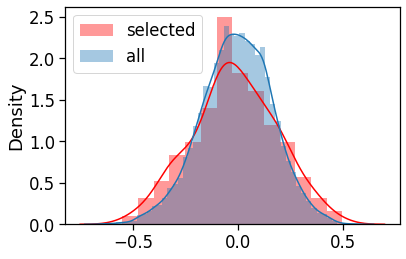

In [676]:
selected = subsum[['%s_%s'%(x,stat) for x in genes if x in gxp.index]].mean()
allrs = subsum[[x for x in subsum.columns if '_%s'%stat in x]].mean()
sns.distplot(selected,label='selected',color='red')
sns.distplot(allrs,label='all')
plt.legend()

In [272]:
# for x in [x.split('_r')[0] for x in sig]:
#     print(x)

In [677]:
sig = []
thr = round(len(allrs)*0.025)
cil = allrs.sort_values().values[thr]
ciu = allrs.sort_values().values[-thr]
print('CI:',cil,ciu)
for x in selected.index:
    if selected[x] >= ciu or selected[x] <= cil:
        sig.append(x)
print('# significant:',len(sig))
print(sig)

CI: -0.3578042328042328 0.3150095201031471
# significant: 26
['KCNG1_rho', 'NTSR1_rho', 'PTGER3_rho', 'ANKRD50_rho', 'SSTR1_rho', 'SCARA5_rho', 'IL17RD_rho', 'GRP_rho', 'SLC35F2_rho', 'HRH3_rho', 'ZIC1_rho', 'AMIGO2_rho', 'SCN1B_rho', 'SHD_rho', 'PLXDC1_rho', 'SLC22A9_rho', 'SEMA7A_rho', 'PPM1H_rho', 'KCNC1_rho', 'TUBA8_rho', 'GUCA2B_rho', 'SP9_rho', 'VAV3_rho', 'CCDC88B_rho', 'ITPKC_rho', 'SCRT1_rho']


In [ ]:
# vis_pass = ['MBP','LIMS2','WDR78','LDHD','TPP3','ID4','MAOB',
#            'HES5','TRPS1','CAPB1','DBX2','RASL12','FERMT1',
#            'SCN9A','KLHL13','VWA54']

In [41]:
# for gene in sig:
#     g=sns.lmplot(x='log_age_months',y=gene,
#             #hue='gender',
#             lowess=True,
#              #scatter_kws={'color':'k'},
#            data=subsum)
#     plt.title(gene.split('_')[0])
#     plt.show()

In [678]:
c2ss = pandas.DataFrame(subsum[[x for x in subsum.columns[20:] if x.split('_')[-1] == stat and \
                                                        x.split('_')[0] in genes]],
                       copy=True)
c2ss.drop([x for x in c2ss.index if all(~pandas.notnull(c2ss.loc[x]))],axis=0,inplace=True)
c2ss.drop([x for x in c2ss.columns if any(~pandas.notnull(c2ss.loc[:,x]))],axis=1,inplace=True)

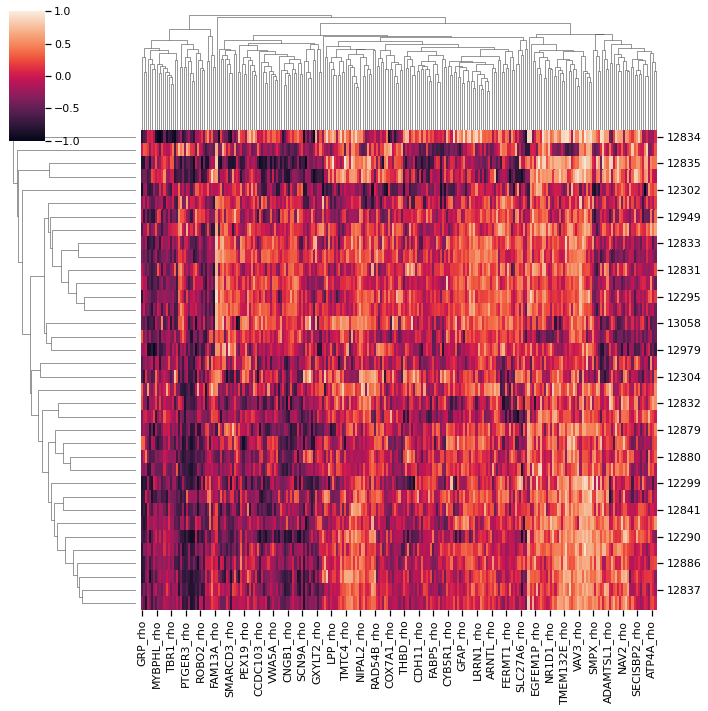

In [679]:
sns.set_context('notebook',font_scale=1)
g = sns.clustermap(c2ss)

In [680]:
subsum.loc[g.data2d.index]['age']

12834         4 yrs
12365        13 pcw
12835        11 yrs
13057         8 yrs
12302         8 pcw
263195015    12 pcw
12949         9 pcw
12980        13 pcw
12833        24 pcw
12830        17 pcw
12831        12 pcw
12889        16 pcw
12295        13 pcw
12303        12 pcw
13058        16 pcw
12977        16 pcw
12979        19 pcw
12836        21 pcw
12304        37 pcw
12984         2 yrs
12832         3 yrs
12300        18 yrs
12879        37 yrs
12287        23 yrs
12880        40 yrs
12288        13 yrs
12299        10 mos
12820         4 mos
12841         4 mos
12296         3 yrs
12290        21 yrs
12890         8 yrs
12886         1 yrs
12960        30 yrs
12837        36 yrs
12948        19 yrs
Name: age, dtype: object

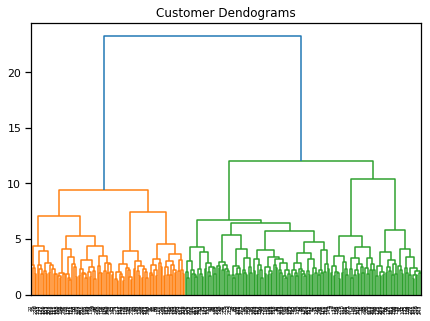

In [681]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(7, 5))
plt.title("Customer Dendograms")
link = shc.linkage(c2ss.T.values, method='ward')
dend = shc.dendrogram(link)

In [682]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.cluster import AgglomerativeClustering

csol = pandas.DataFrame()
for i,k in enumerate(range(2,100)):
    #print('working on k =',k)
    d = c2ss.T.values
    cluster = AgglomerativeClustering(n_clusters=k, affinity='euclidean', 
                                  linkage='ward')
    cluster.fit_predict(d)
    csol.loc[i,'k'] = k
    csol.loc[i,'sil_score'] = silhouette_score(d,cluster.labels_,random_state=123)
    csol.loc[i,'ch_score'] = calinski_harabasz_score(d,cluster.labels_)

<AxesSubplot:xlabel='k', ylabel='sil_score'>

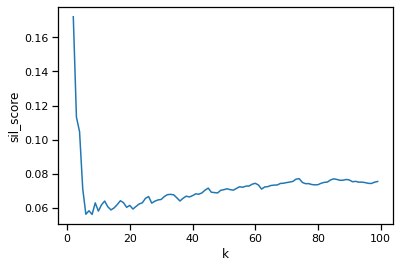

In [683]:
sns.lineplot(x='k',y='sil_score',data=csol)

In [ ]:
peaks = [12,17,26,33,45]

<AxesSubplot:>

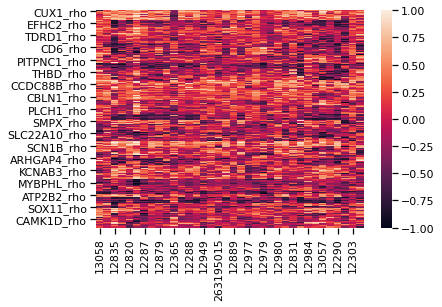

In [687]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=45, affinity='euclidean', 
                                  linkage='ward')
cluster.fit_predict(c2ss.T.values)
data = pandas.DataFrame(c2ss.T,copy=True)
data.loc[:,'labels'] = cluster.labels_
sns.heatmap(data.sort_values('labels')[data.columns[:-1]])

In [688]:
cplots = data.groupby('labels').mean().T
cplots.columns = ['cluster%s'%x for x in cplots.columns]
for col in subsum.columns[:20]:
    cplots.loc[:,col] = subsum.loc[c2ss.index,col].values
cplots.head()

,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8,cluster9,...,Age_Period,MacroStructure,MacroStructure2,NT_Segment,Sensorifugal,age_level,age_in_months,log_age_months,age_in_weeks,log_age_weeks
13058,-0.023810,0.257143,3.376017e-01,0.064286,0.268571,0.269841,0.390476,-0.428571,0.342857,0.271429,...,p4,Frontal,Frontal,Tele,Association,4,3.678161,1.302413,16.000,2.772589
12833,0.372222,0.141684,1.516667e-01,-0.016667,-0.360000,0.355556,-0.109259,-0.426190,0.022917,0.375000,...,p6,Limbic,Limbic,Tele,Association,8,5.517241,1.707878,24.000,3.178054
12835,0.580357,-0.776786,-1.110223e-17,-0.584821,-0.685714,-0.670635,0.194444,-0.500000,-0.401786,-0.187500,...,p11,Frontal,Frontal,Tele,Association,20,132.000000,4.882802,611.105,6.415269
12960,0.538889,-0.345833,1.266597e-01,0.035417,-0.550000,-0.374074,0.083333,-0.657143,-0.106250,-0.070833,...,p12,Temporal,Temporal,Tele,Association,27,360.000000,5.886104,1599.105,7.377199
12820,0.476190,-0.459821,3.321429e-01,0.142857,-0.435714,-0.103175,-0.075397,-0.280982,0.000000,0.116071,...,p8,Temporal,Temporal,Tele,Association,13,4.000000,1.386294,56.485,4.033975


0.594


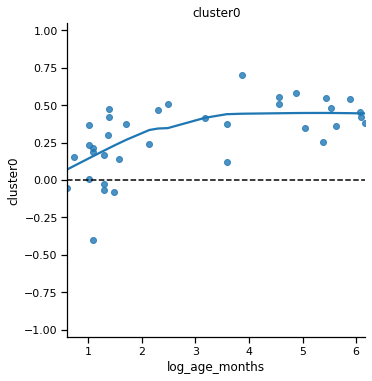

-0.403


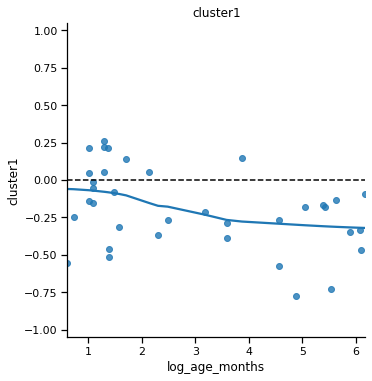

0.067


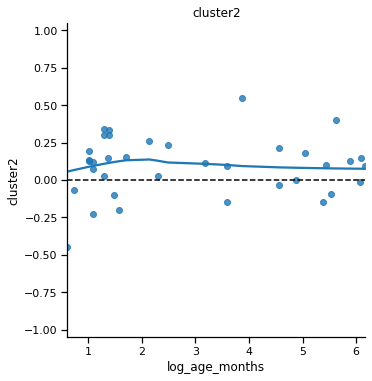

-0.0


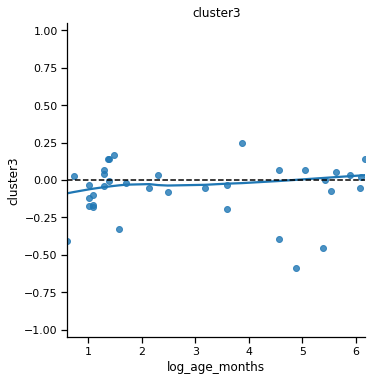

-0.627


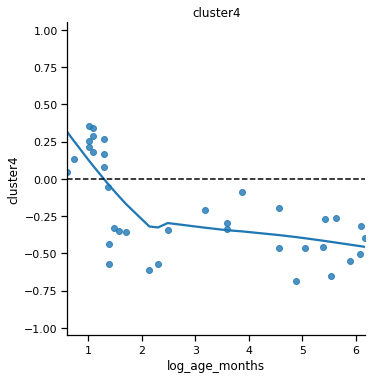

-0.558


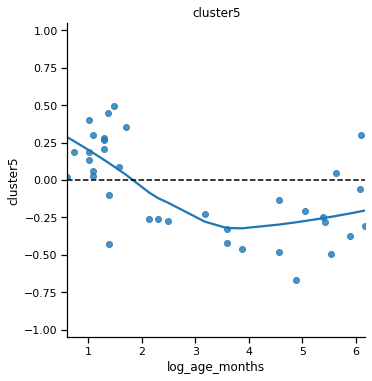

0.256


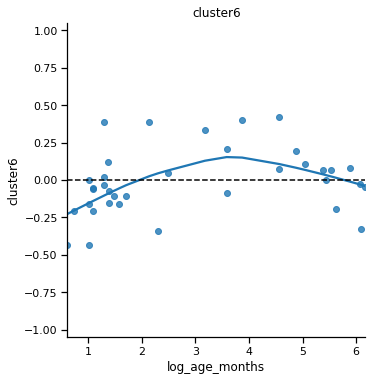

-0.493


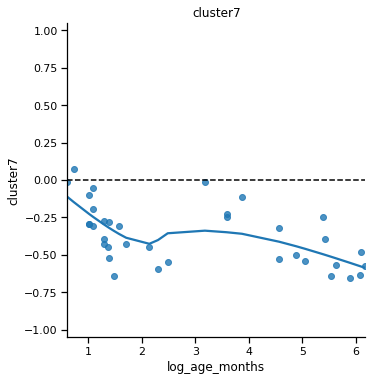

-0.186


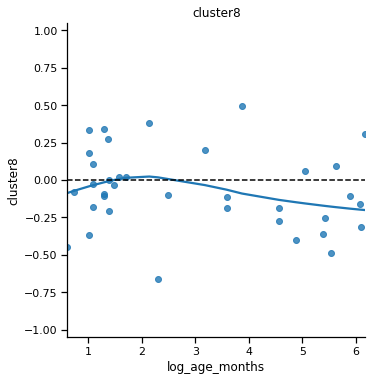

-0.673


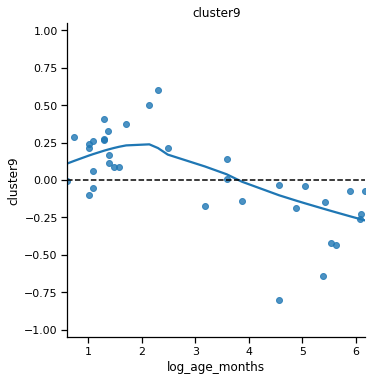

-0.378


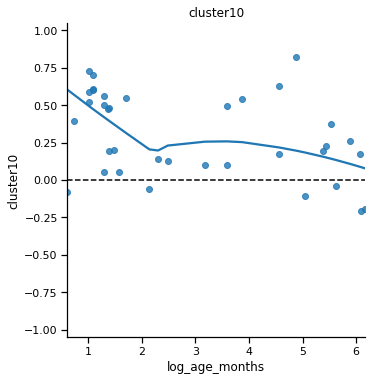

0.201


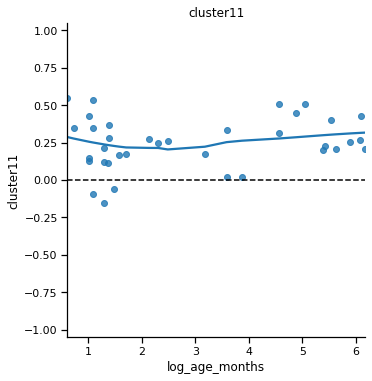

-0.406


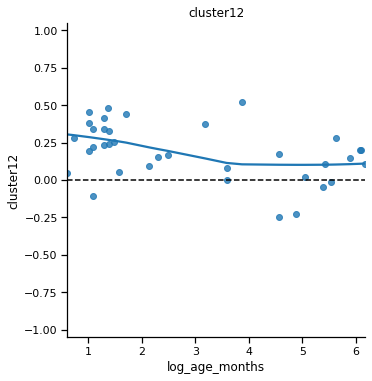

0.28


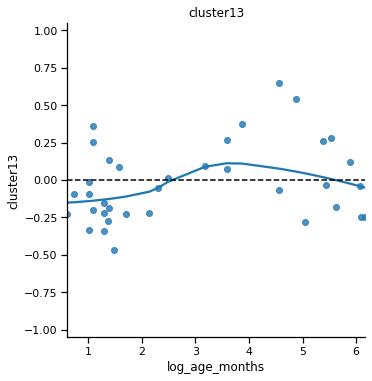

-0.239


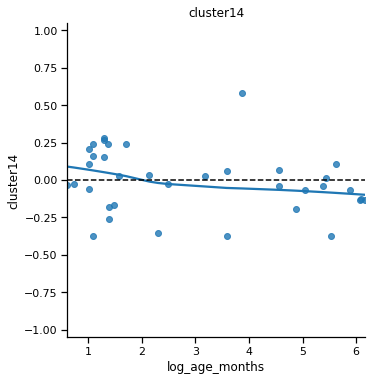

-0.833


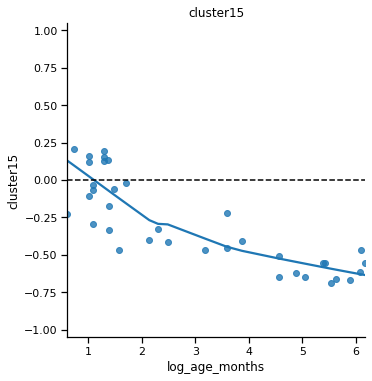

0.743


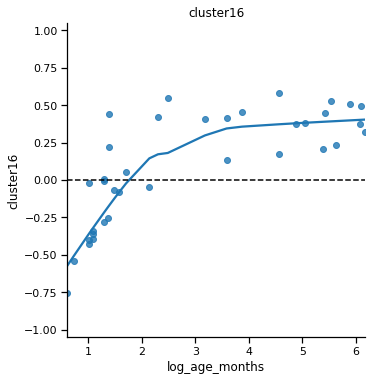

0.105


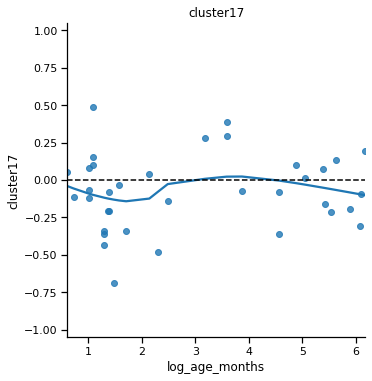

0.062


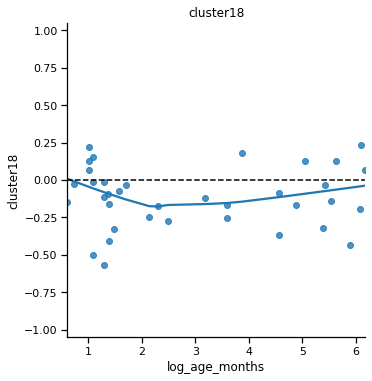

-0.241


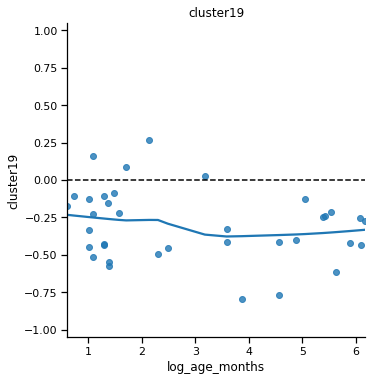

-0.263


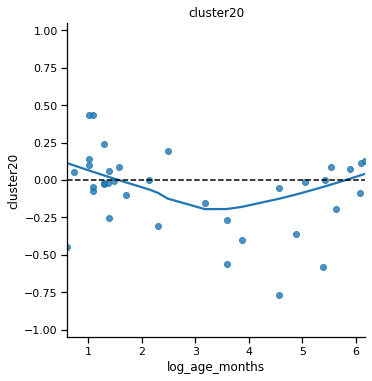

0.498


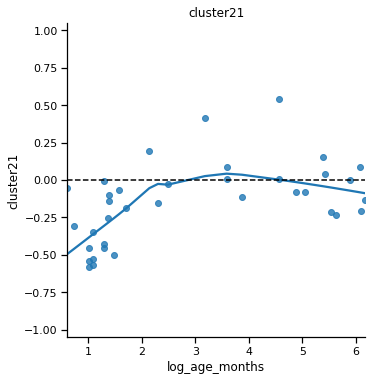

0.285


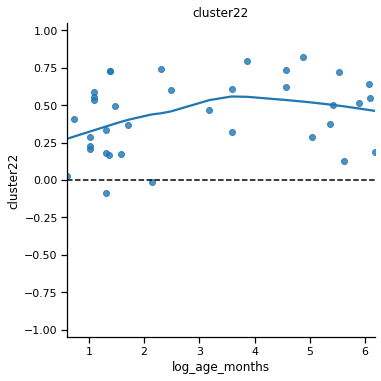

0.491


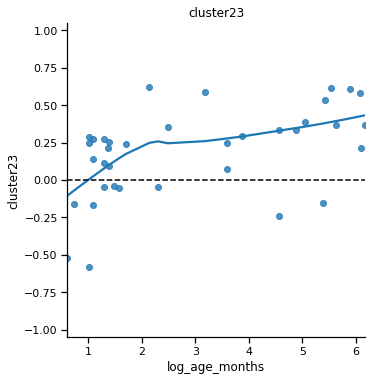

-0.566


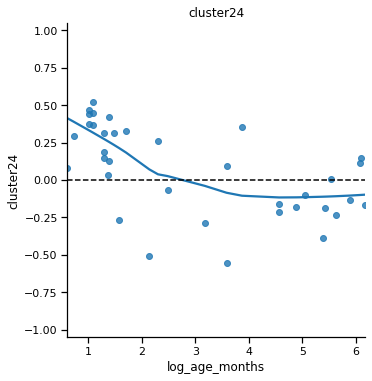

0.38


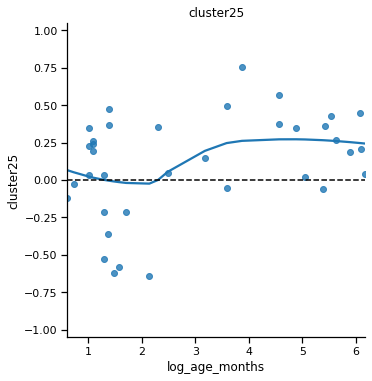

-0.125


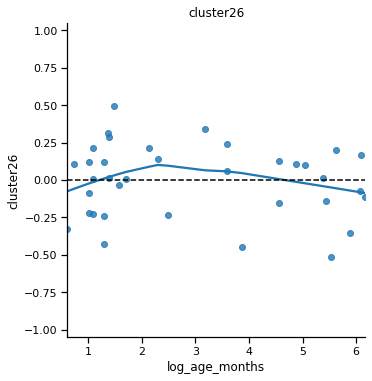

-0.384


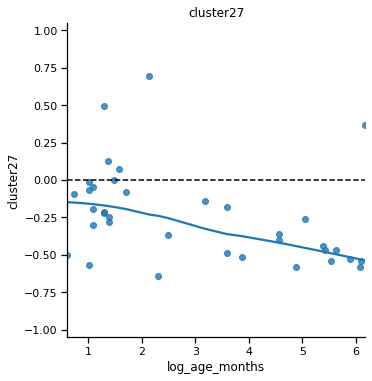

-0.73


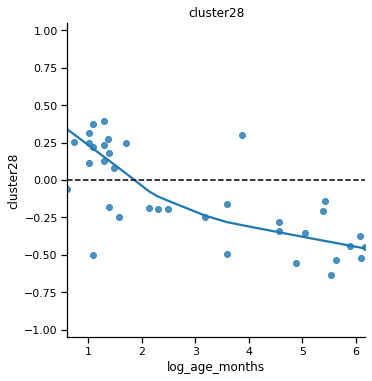

0.717


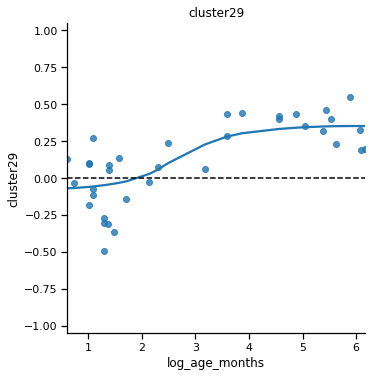

0.374


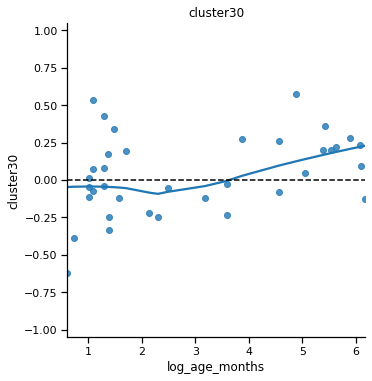

0.23


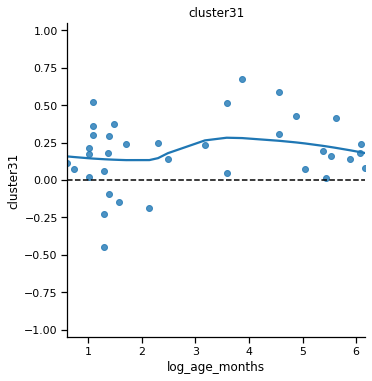

0.103


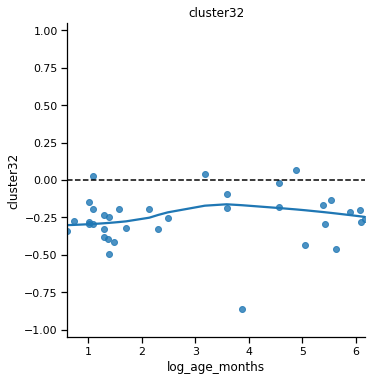

-0.252


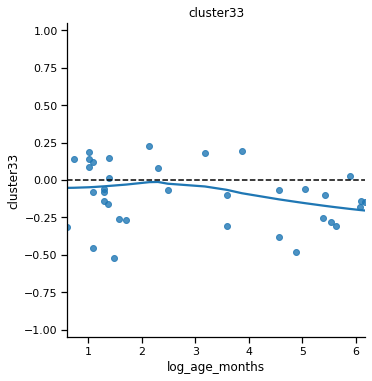

0.356


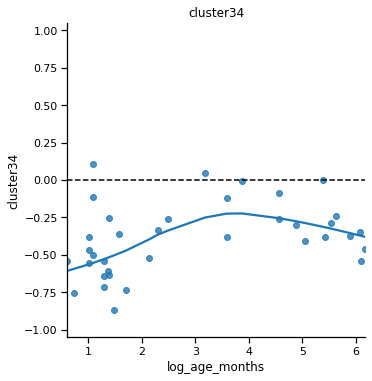

0.218


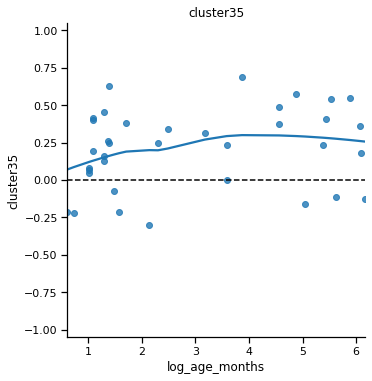

-0.052


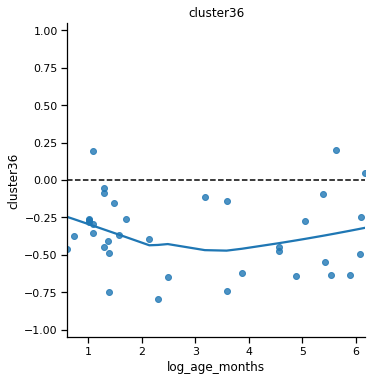

-0.738


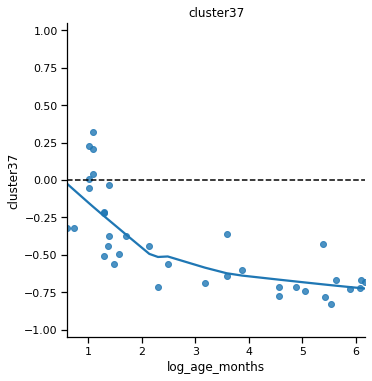

-0.129


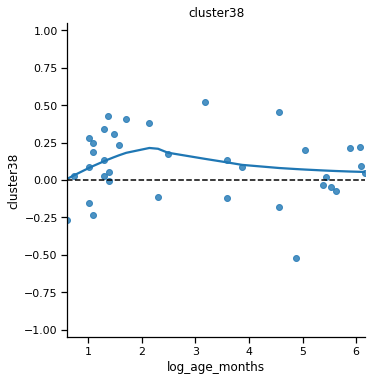

0.108


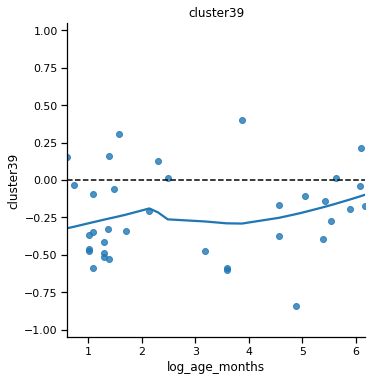

0.217


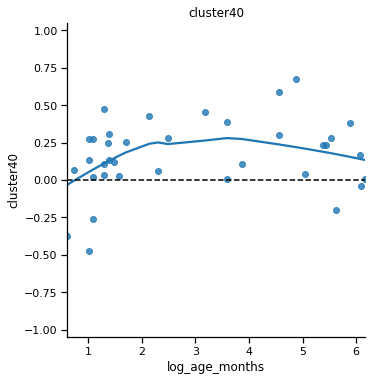

-0.418


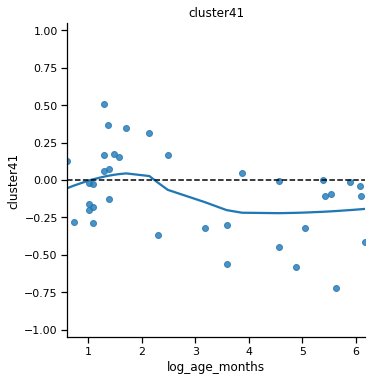

-0.369


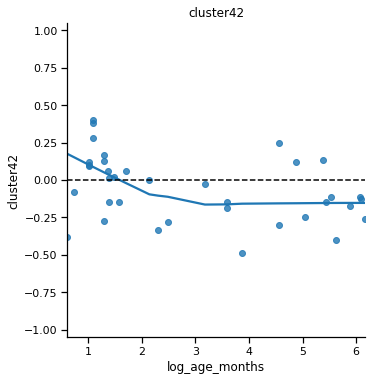

0.443


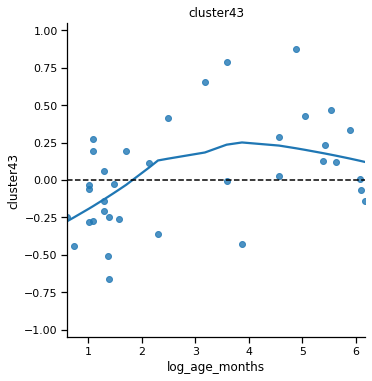

0.403


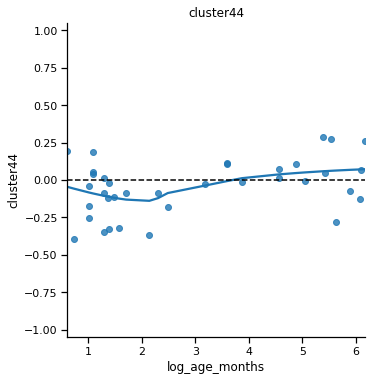

In [689]:
for cluster in [x for x in cplots.columns if 'cluster' in x]:
    r,p = stats.pearsonr(cplots[cluster].values,cplots.log_age_months.values)
    g=sns.lmplot(x='log_age_months',y=cluster,
            #hue='gender',
            lowess=True,
             #scatter_kws={'color':'k'},
           data=cplots)
    plt.ylim(-1.05,1.05)
    plt.axhline(0,ls='--',c='k')
    plt.title(cluster)
    print(round(r,3))
    plt.show()

In [ ]:
[2?,11?,19?,32?,36?]

In [690]:
cplots.loc[:,'ind'] = cplots.index

In [691]:
tall = pandas.melt(cplots,id_vars='ind',
                   value_vars=[x for x in cplots.columns if 'cluster' in x])
tall.loc[:,'log_age_months'] = cplots.log_age_months.tolist() * len(tall.variable.unique())

In [692]:
colors = []
for clust in tall.variable.unique():
    r,p = stats.pearsonr(cplots[clust].values,cplots.log_age_months.values)
    if clust in []:#['cluster1','cluster6','cluster27','cluster32']:
        colors.append('black')
    elif r < 0:
        colors.append('lightsteelblue')
    else:
        colors.append('lightcoral')

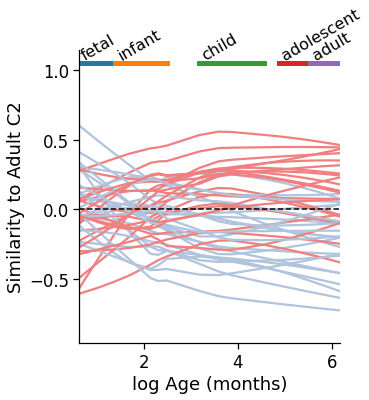

In [693]:
from matplotlib.collections import LineCollection

sns.set_context('notebook',font_scale=1.5)
g=sns.lmplot(x='log_age_months',y='value',
            hue='variable',lowess=True,
             markers='',palette=colors,
             legend=None,data=tall)
plt.ylabel('Similarity to Adult C2')
plt.xlabel('log Age (months)')

for stage in gdf.Age_Stage.unique():
    levels = gdf[gdf.Age_Stage==stage]['log_age_months'].values
    xmin = np.min(levels)
    xmax = np.max(levels)
    plt.plot([xmin,xmax],[1.05,1.05],lw=5)
    #loc = xmin + (xmax-xmin)*.5
    plt.text(xmin,1.05,stage,fontsize=16,ha='left',
             va='bottom',rotation=30)
plt.axhline(0,c='k',ls='--')
#plt.savefig(os.path.join(fig_dir,'cluster_timelinesC1.pdf'),bbox_inches='tight')

#### Criteria
* Mostly genes from one tail
* Goes in the expected direction
* Reaches r > 0.5 at some point

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='log_age_months', ylabel='value'>

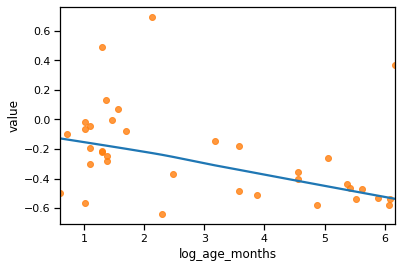

In [706]:
c = 27
jnk = g.ax.lines[c]
sns.regplot(jnk.get_data()[0],jnk.get_data()[1],lowess=True,scatter=False)
sns.regplot(x='log_age_months',y='value',data=tall[tall.variable=='cluster%s'%c],
           fit_reg=False)

In [696]:
crit = pandas.DataFrame(data['labels'].unique())

### CHANGE THIS DEPENDING ON COMPONENT
posg = c3[c3.expr>0].gene_symbol
negg = c3[c3.expr<0].gene_symbol

flats = []#[1,6,27,32]
for clust in data['labels'].unique():
    cluster = 'cluster'+str(clust)
    cgenes = [x.split('_')[0] for x in data[data.labels==clust].index]
    npos = len([x for x in cgenes if x in posg])
    nneg = len([x for x in cgenes if x in negg])
    
    # mostly genes from one tail
    if (npos+0.001) / (nneg+0.001) > 3:
        direction = 'pos'
    elif (npos+0.001) / (nneg+0.001) < 0.33:
        direction = 'neg'
    else:
        direction = 'ambiguous'
    crit.loc[clust,'direction'] = direction
    
    # goes in the expected direction
    r,p = stats.spearmanr(cplots[cluster].values,cplots.log_age_months.values)
    mn = cplots[cplots.log_age_months>4][cluster].values.mean() # mean signal post childhood
    if clust in flats:
        cor = 'flat'
    elif r < 0:
        cor = 'neg'
    else:
        cor = 'pos'
    crit.loc[clust,'correlation'] = cor
    crit.loc[clust,'rho'] = r
    if mn > 0:
        mean = 'pos'
    else:
        mean = 'neg'
    crit.loc[clust,'meandir'] = mean
    crit.loc[clust,'mean'] = mn
    if mean == direction:
        crit.loc[clust,'mean_match'] = 1
    else:
        crit.loc[clust,'mean_match'] = 0
    if cor == direction:
        crit.loc[clust,'cor_match'] = 1
    else:
        crit.loc[clust,'cor_match'] = 0
    
    # Reaches r > 0.5 at some point
    fitted = g.ax.lines[clust] # this comes from the multiline lmplot a few cells up
    max_r = np.max(abs(fitted.get_data()[1]))
    if max_r > 0.5:
        strength = True
        crit.loc[clust,'strenth_match'] = 1
    else:
        strength = False
        crit.loc[clust,'strenth_match'] = 0
    crit.loc[clust,'max_r'] = max_r
    
    # all criteria
    hit = False
    if cor == 'flat':
        hit = True
    else:
        if direction != 'ambiguous' and \
               crit.loc[clust,'mean_match'] == 1 and strength:
            hit = True
    if hit:
        crit.loc[clust,'hit'] = 1
    else:
        crit.loc[clust,'hit'] = 0
            
            

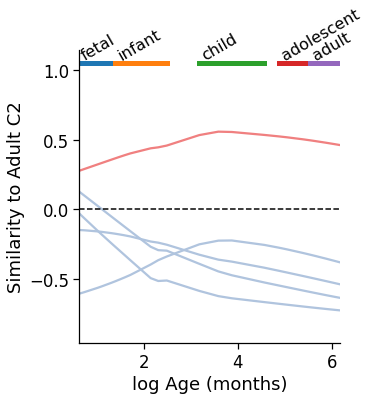

In [697]:
# derive colors and line styles
colors = []
for c,row in crit[crit.hit==1].iterrows():
    if row['correlation'] == 'flat':
        colors.append('black')
    elif row['direction'] == 'pos':
        colors.append('lightcoral')
    else:
        colors.append('lightsteelblue')

hits = ['cluster%s'%x for x in crit[crit.hit==1].index]
# plot
sns.set_context('notebook',font_scale=1.5)
g2=sns.lmplot(x='log_age_months',y='value',
            hue='variable',lowess=True,
             markers='',palette=colors,
             legend=None,data=tall[tall.variable.isin(hits)])
plt.ylabel('Similarity to Adult C2')
plt.xlabel('log Age (months)')

for stage in gdf.Age_Stage.unique():
    levels = gdf[gdf.Age_Stage==stage]['log_age_months'].values
    xmin = np.min(levels)
    xmax = np.max(levels)
    plt.plot([xmin,xmax],[1.05,1.05],lw=5)
    #loc = xmin + (xmax-xmin)*.5
    plt.text(xmin,1.05,stage,fontsize=16,ha='left',
             va='bottom',rotation=30)
plt.axhline(0,c='k',ls='--')
#plt.savefig(os.path.join(fig_dir,'cluster_timelinesC1.pdf'),bbox_inches='tight')

#### next criteria
* define peak
* define SD of variation
* find the point in lifespan where trajectory ceases to be different from peak

#### scratch that
* Divide r into age epochs
* find binary sig diffs between epochs for r
* categorize based on that

In [698]:
cplots.Age_Stage.value_counts()

fetal         16
child          6
adult          6
infant         4
adolescent     4
Name: Age_Stage, dtype: int64

<AxesSubplot:xlabel='Age_Stage'>

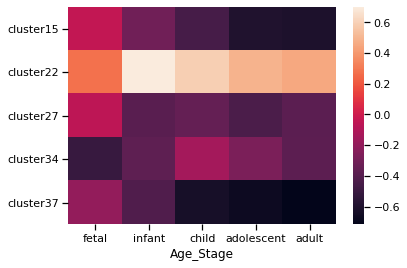

In [699]:
sns.set_context('notebook',font_scale=1)
order = ['fetal','infant','child','adolescent','adult']
sns.heatmap(cplots.groupby('Age_Stage')[hits].mean().T[order])

In [700]:
def balanced_subsample(y, size=None):

    subsample = []

    if size is None:
        n_smp = y.value_counts().min()
    else:
        n_smp = int(size / len(y.value_counts().index))

    for label in y.value_counts().index:
        samples = y[y == label].index.values
        index_range = range(samples.shape[0])
        indexes = np.random.choice(index_range, size=n_smp, replace=False)
        subsample += samples[indexes].tolist()

    return subsample

In [701]:
groupdifs = []

for clust in hits :
    print('working on',clust)
    for i in range(1):#00):
        # subsample so all categories have 4 subjects
        ss = balanced_subsample(cplots.Age_Stage)
        ssdf = cplots.loc[ss]
        # get omnibus stats
        F,p = stats.f_oneway(ssdf[ssdf.Age_Stage=='fetal'][clust].values,
                  ssdf[ssdf.Age_Stage=='infant'][clust].values,
                  ssdf[ssdf.Age_Stage=='child'][clust].values,
                  ssdf[ssdf.Age_Stage=='adolescent'][clust].values,
                  ssdf[ssdf.Age_Stage=='adult'][clust].values)
        # store tukey hd output
        output = pairwise_tukeyhsd(cplots[clust],cplots.Age_Stage)
        gdiff = pandas.DataFrame(np.array(output.summary().data[1:]),
                        columns = output.summary().data[0])
        # annotate and index
        gdiff.loc[:,'F'] = F
        gdiff.loc[:,'p'] = p
        gdiff.loc[:,'cluster'] = clust
        gdiff.loc[:,'i'] = i
        groupdifs.append(gdiff)
# combine all results
results = pandas.concat(groupdifs)

working on cluster15
working on cluster22
working on cluster27
working on cluster34
working on cluster37


In [702]:
def func(x):
    if x == 'False':
        return 0
    else:
        return 1

results.loc[:,'reject'] = results.reject.apply(func).values

In [703]:
for i,row in results.iterrows():
    results.loc[i,'group'] = '%s_%s'%(row['group1'],row['group2'])

I checked and, despite having random samples, every iteration had the same results (not surprising given most of the variation was coming from large effect size group

In [704]:
jnk = pandas.DataFrame(results[results.i==0])

In [705]:
jnk.loc[:,'ind'] = range(len(jnk))
jnk.pivot(index='group',columns='cluster',values='reject')

cluster,cluster15,cluster22,cluster27,cluster34,cluster37
group,,,,,
adolescent_adult,0,0,0,0,0
adolescent_child,0,0,0,0,0
adolescent_fetal,1,0,0,0,1
adolescent_infant,0,0,0,0,0
adult_child,0,0,0,0,0
adult_fetal,1,0,0,0,1
adult_infant,0,0,0,0,0
child_fetal,1,1,0,1,1
child_infant,0,0,0,0,0


* C15: Fetal - Infant
* C22: Fetal - Infant
* C27: - (Fetal - Child)
* C34: Fetal - Child
* C37: Fetal - Child

In [707]:
cats = dict(zip(hits,['infant','infant','child','child','child']))
colos = dict(zip(['fetal_nl','infant','child','postchild'],
                sns.color_palette('tab20',4)))
pal = [colos[x] for x in cats.values()]

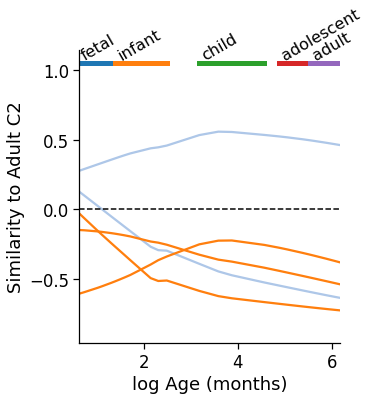

In [708]:
# plot
sns.set_context('notebook',font_scale=1.5)
g2=sns.lmplot(x='log_age_months',y='value',
            hue='variable',lowess=True,
             markers='',palette=pal,
             legend=None,data=tall[tall.variable.isin(hits)])
plt.ylabel('Similarity to Adult C2')
plt.xlabel('log Age (months)')

for stage in gdf.Age_Stage.unique():
    levels = gdf[gdf.Age_Stage==stage]['log_age_months'].values
    xmin = np.min(levels)
    xmax = np.max(levels)
    plt.plot([xmin,xmax],[1.05,1.05],lw=5)
    #loc = xmin + (xmax-xmin)*.5
    plt.text(xmin,1.05,stage,fontsize=16,ha='left',
             va='bottom',rotation=30)
plt.axhline(0,c='k',ls='--')
#plt.savefig(os.path.join(fig_dir,'cluster_timelinesC1.pdf'),bbox_inches='tight')

In [709]:
for i,row in crit.iterrows():
    c = 'cluster%s'%i
    if c in cats.keys():
        crit.loc[i,'category'] = cats[c]

In [711]:
keepers = []
for clust in crit[crit.category=='child'][0].values:
    jnk = data[data.labels==clust]
    for x in jnk.index:
        j2 = x.split('_')[0]
        #print(j2)
        keepers.append(j2)
    #print('\n\n')
np.array(keepers)

array(['SLC35F2', 'GRP', 'TSKU', 'COL21A1', 'KCNA5', 'TSPAN2', 'SCN7A',
       'FABP6', 'NUPR1', 'NR2F2', 'CTXN3', 'MICAL2', 'CPLX2', 'ZBTB8A',
       'KLF13', 'SYN3', 'SECISBP2'], dtype='<U8')

In [712]:
jnk = subsum[subsum.Age_Stage.isin(['adult','adolescent'])]
jnk = jnk[[x for x in jnk.columns if 'rho' in x]].mean()
corgenes = [x.split('_')[0] for x in jnk[jnk>0.5].index]


In [713]:
gdf.loc[:,'C3_topcor_gxp'] = gxp.loc[corgenes].mean().values

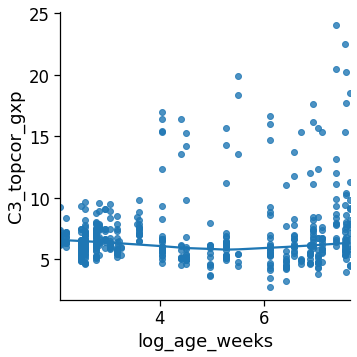

In [714]:
sns.lmplot(x='log_age_weeks',y='C3_topcor_gxp',data=gdf,lowess=True)

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/statsmodels/nonparametric/smoothers_lowess.py:215: RuntimeWarning: invalid value encountered in greater_equal
  frac=frac, it=it, delta=delta, given_xvals=False)


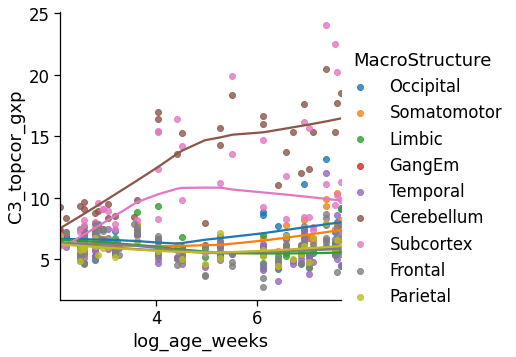

In [715]:
sns.lmplot(x='log_age_weeks',y='C3_topcor_gxp',data=gdf,lowess=True,hue='MacroStructure')

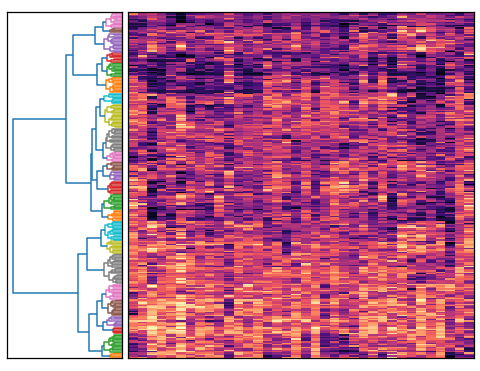

In [716]:
# Dendrogram that comes to the left

D = pandas.DataFrame(c2ss.T, copy=True)
D = D.values

fig = plt.figure(figsize=(8,8))
# Add an axes at position rect [left, bottom, width, height]
ax1 = fig.add_axes([0.09, 0.1, 0.2, 0.6])
Y = link
# orientation='left' is reponsible for making the 
# dendrogram appear to the left
Z1 = shc.dendrogram(Y, orientation='left',color_threshold=4)
ax1.set_xticks([])
ax1.set_yticks([])


# main heat-map
axmatrix = fig.add_axes([0.3, 0.1, 0.6, 0.6])
idx1 = Z1['leaves']
D = D[idx1, :]
# the actual heat-map
im = axmatrix.matshow(D, aspect='auto', origin='lower', cmap="magma")
axmatrix.set_xticks([])
axmatrix.set_yticks([])

#plt.savefig(os.path.join(fig_dir,'DendoC2.pdf'),bbox_inches='tight')
plt.show()

### C1

In [625]:
subsum = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/BioInf_rvals_C1.csv',
                        index_col=0)

In [289]:
#subsum

In [626]:
stat = 'rho'
# stat = 'r'

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/jacobv/pls_gxp/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


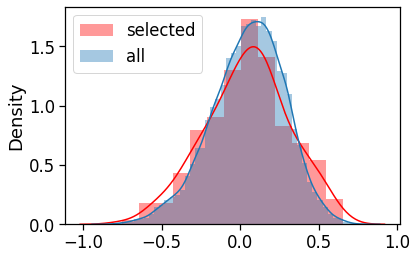

In [627]:
selected = subsum[['%s_%s'%(x,stat) for x in genes if x in gxp.index]].mean()
allrs = subsum[[x for x in subsum.columns if '_%s'%stat in x]].mean()
sns.distplot(selected,label='selected',color='red')
sns.distplot(allrs,label='all')
plt.legend()

In [272]:
# for x in [x.split('_r')[0] for x in sig]:
#     print(x)

In [628]:
sig = []
thr = round(len(allrs)*0.025)
cil = allrs.sort_values().values[thr]
ciu = allrs.sort_values().values[-thr]
print('CI:',cil,ciu)
for x in selected.index:
    if selected[x] >= ciu or selected[x] <= cil:
        sig.append(x)
print('# significant:',len(sig))
print(sig)

CI: -0.4529610876430927 0.4716931216931217
# significant: 26
['KCNG1_rho', 'ENOX1_rho', 'NTSR1_rho', 'CLEC18B_rho', 'ANKRD50_rho', 'GOLT1A_rho', 'PCBD1_rho', 'GRID2_rho', 'LRRC36_rho', 'KLHL13_rho', 'PIRT_rho', 'HRH3_rho', 'SIX3_rho', 'VAT1L_rho', 'ZIC1_rho', 'TMEM132E_rho', 'LY6D_rho', 'COL27A1_rho', 'TBR1_rho', 'BID_rho', 'THEMIS_rho', 'TUBA8_rho', 'CABP1_rho', 'UBE2QL1_rho', 'VAV3_rho', 'CCDC88B_rho']


In [ ]:
# vis_pass = ['MBP','LIMS2','WDR78','LDHD','TPP3','ID4','MAOB',
#            'HES5','TRPS1','CAPB1','DBX2','RASL12','FERMT1',
#            'SCN9A','KLHL13','VWA54']

In [41]:
# for gene in sig:
#     g=sns.lmplot(x='log_age_months',y=gene,
#             #hue='gender',
#             lowess=True,
#              #scatter_kws={'color':'k'},
#            data=subsum)
#     plt.title(gene.split('_')[0])
#     plt.show()

In [629]:
c2ss = pandas.DataFrame(subsum[[x for x in subsum.columns[20:] if x.split('_')[-1] == stat and \
                                                        x.split('_')[0] in genes]],
                       copy=True)
c2ss.drop([x for x in c2ss.index if all(~pandas.notnull(c2ss.loc[x]))],axis=0,inplace=True)
c2ss.drop([x for x in c2ss.columns if any(~pandas.notnull(c2ss.loc[:,x]))],axis=1,inplace=True)

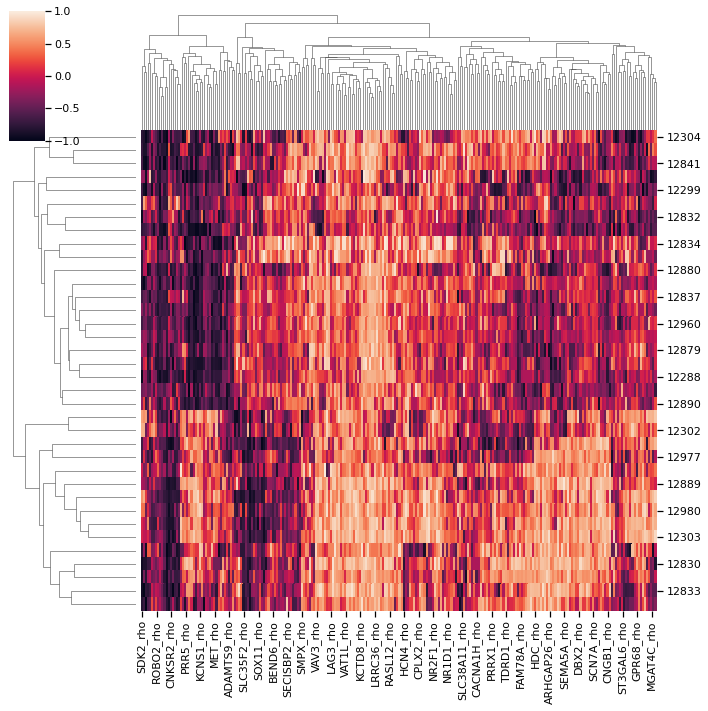

In [630]:
sns.set_context('notebook',font_scale=1)
g = sns.clustermap(c2ss)

In [631]:
subsum.loc[g.data2d.index]['age']

12304        37 pcw
12820         4 mos
12841         4 mos
12296         3 yrs
12299        10 mos
12984         2 yrs
12832         3 yrs
12300        18 yrs
12834         4 yrs
13057         8 yrs
12880        40 yrs
12886         1 yrs
12837        36 yrs
12290        21 yrs
12960        30 yrs
12948        19 yrs
12879        37 yrs
12287        23 yrs
12288        13 yrs
12835        11 yrs
12890         8 yrs
12949         9 pcw
12302         8 pcw
263195015    12 pcw
12977        16 pcw
12365        13 pcw
12889        16 pcw
12831        12 pcw
12980        13 pcw
12295        13 pcw
12303        12 pcw
13058        16 pcw
12830        17 pcw
12979        19 pcw
12833        24 pcw
12836        21 pcw
Name: age, dtype: object

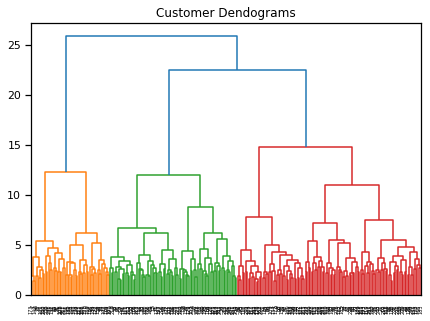

In [632]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(7, 5))
plt.title("Customer Dendograms")
link = shc.linkage(c2ss.T.values, method='ward')
dend = shc.dendrogram(link)

In [633]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.cluster import AgglomerativeClustering

csol = pandas.DataFrame()
for i,k in enumerate(range(2,100)):
    #print('working on k =',k)
    d = c2ss.T.values
    cluster = AgglomerativeClustering(n_clusters=k, affinity='euclidean', 
                                  linkage='ward')
    cluster.fit_predict(d)
    csol.loc[i,'k'] = k
    csol.loc[i,'sil_score'] = silhouette_score(d,cluster.labels_,random_state=123)
    csol.loc[i,'ch_score'] = calinski_harabasz_score(d,cluster.labels_)

<AxesSubplot:xlabel='k', ylabel='sil_score'>

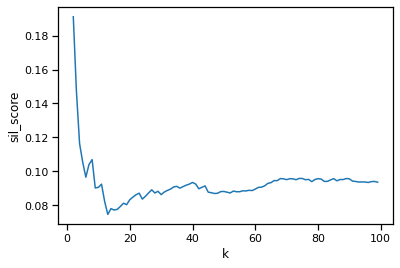

In [634]:
sns.lineplot(x='k',y='sil_score',data=csol)

In [641]:
peaks = [8,11,40]

<AxesSubplot:>

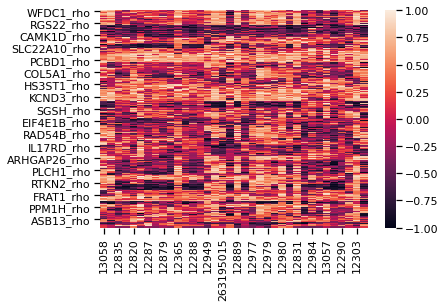

In [642]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=40, affinity='euclidean', 
                                  linkage='ward')
cluster.fit_predict(c2ss.T.values)
data = pandas.DataFrame(c2ss.T,copy=True)
data.loc[:,'labels'] = cluster.labels_
sns.heatmap(data.sort_values('labels')[data.columns[:-1]])

In [643]:
cplots = data.groupby('labels').mean().T
cplots.columns = ['cluster%s'%x for x in cplots.columns]
for col in subsum.columns[:20]:
    cplots.loc[:,col] = subsum.loc[c2ss.index,col].values
cplots.head()

,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8,cluster9,...,Age_Period,MacroStructure,MacroStructure2,NT_Segment,Sensorifugal,age_level,age_in_months,log_age_months,age_in_weeks,log_age_weeks
13058,0.475630,-0.530159,-0.017143,-0.032443,-0.142359,-0.120000,0.454545,0.142857,0.418902,-0.159184,...,p4,Frontal,Frontal,Tele,Association,4,3.678161,1.302413,16.000,2.772589
12833,0.606863,-0.631481,-0.353333,0.451037,-0.199442,0.216667,0.624242,-0.528571,0.334848,-0.214286,...,p6,Limbic,Limbic,Tele,Association,8,5.517241,1.707878,24.000,3.178054
12835,-0.218487,-0.436508,-0.371429,0.205357,-0.621429,0.328571,0.521736,-0.255102,-0.350649,0.275510,...,p11,Frontal,Frontal,Tele,Association,20,132.000000,4.882802,611.105,6.415269
12960,0.090196,-0.590741,-0.496667,0.293750,-0.709109,0.180000,0.646438,0.204762,-0.259091,0.204762,...,p12,Temporal,Temporal,Tele,Association,27,360.000000,5.886104,1599.105,7.377199
12820,0.058824,-0.769841,-0.478571,0.156250,-0.714286,0.364286,0.723034,-0.086735,0.457792,0.551020,...,p8,Temporal,Temporal,Tele,Association,13,4.000000,1.386294,56.485,4.033975


-0.623


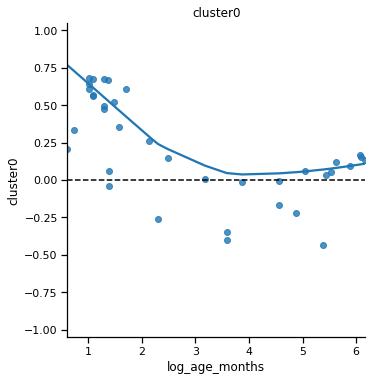

0.008


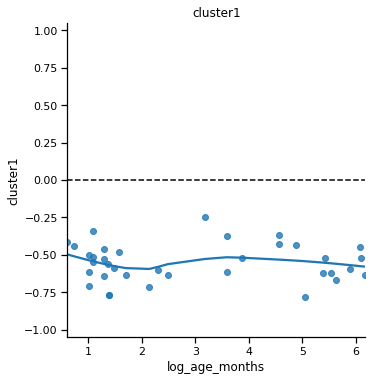

-0.354


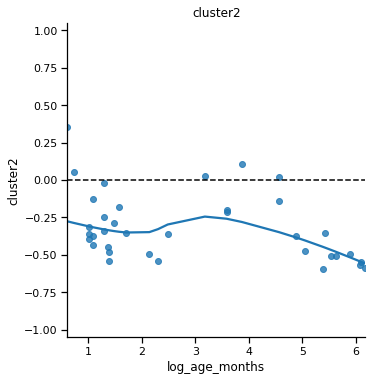

-0.116


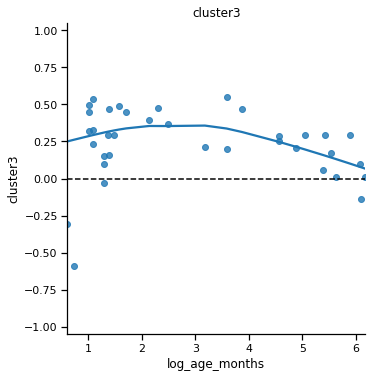

-0.781


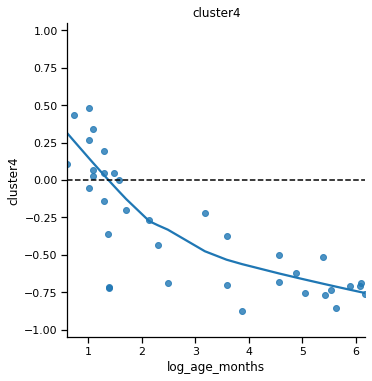

0.074


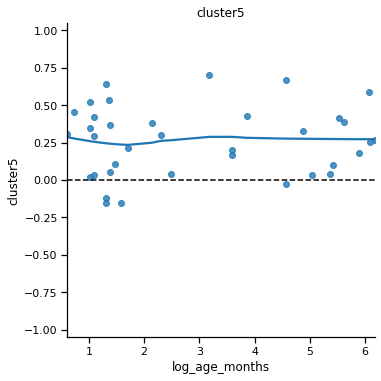

0.188


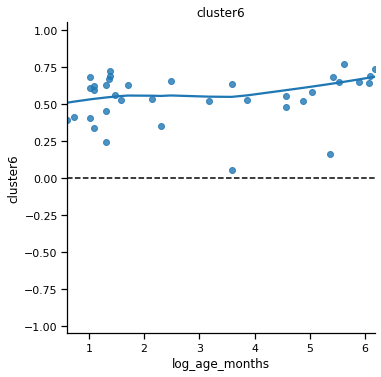

-0.389


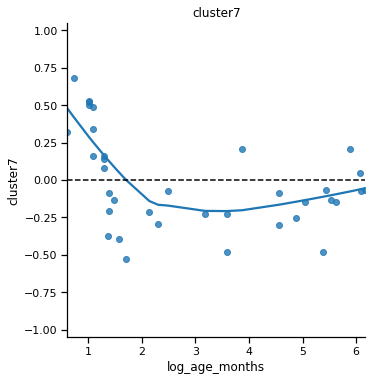

-0.613


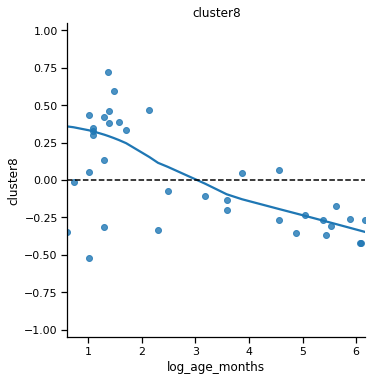

0.535


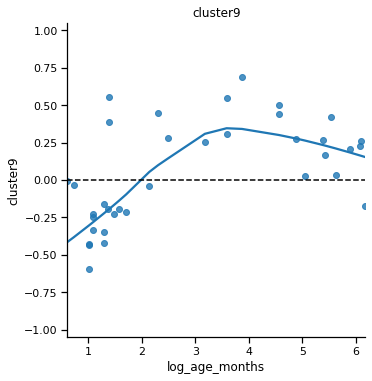

0.621


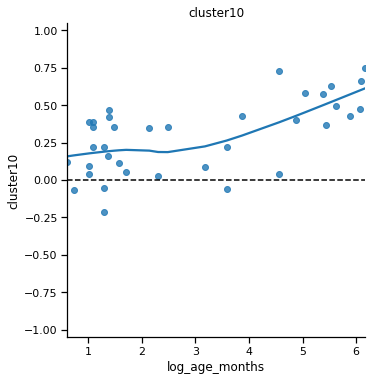

-0.769


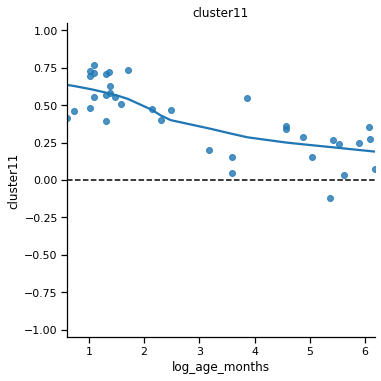

0.68


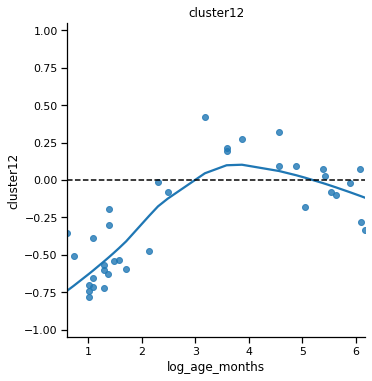

-0.031


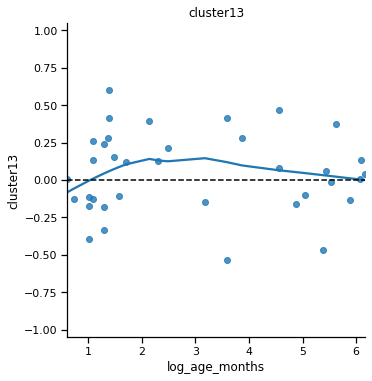

-0.087


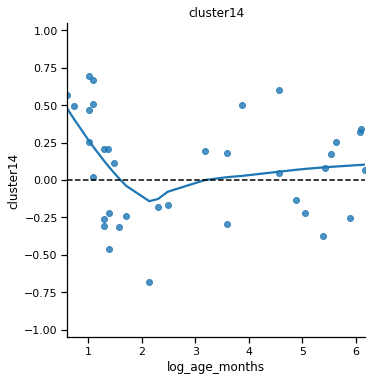

-0.549


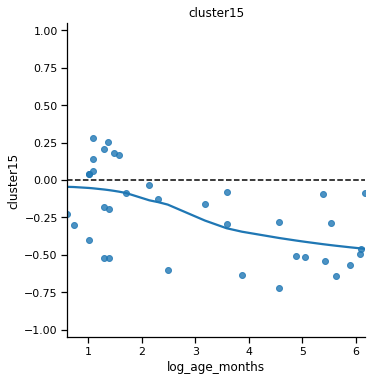

0.198


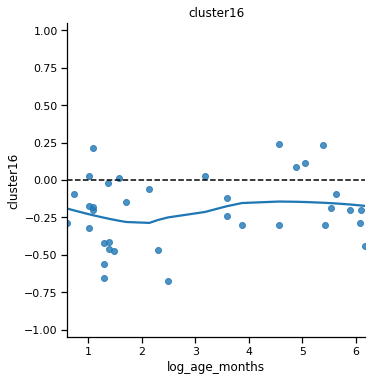

-0.613


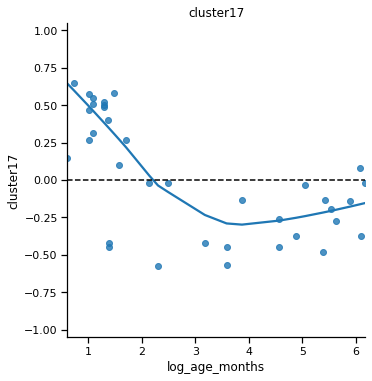

-0.548


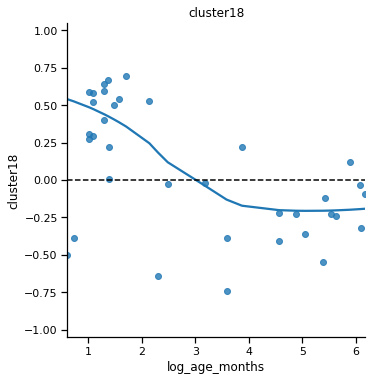

0.31


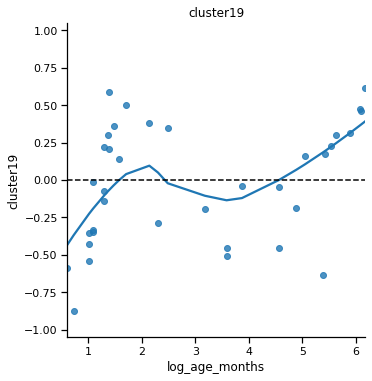

-0.009


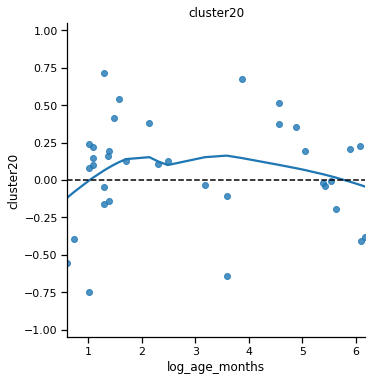

0.66


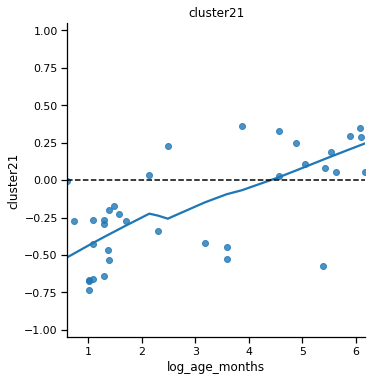

0.307


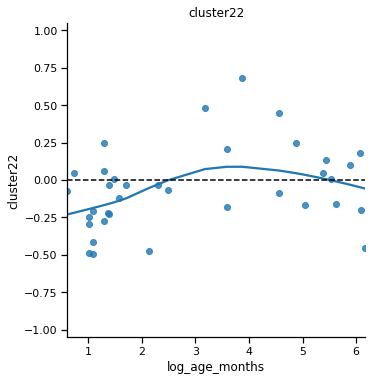

-0.844


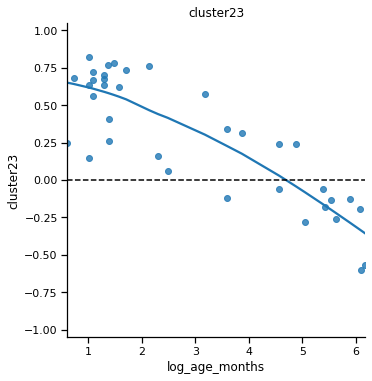

-0.72


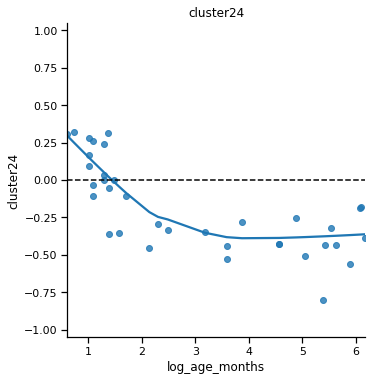

-0.751


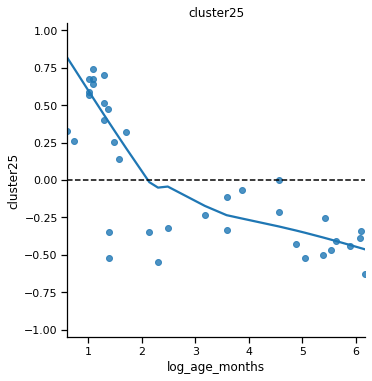

-0.261


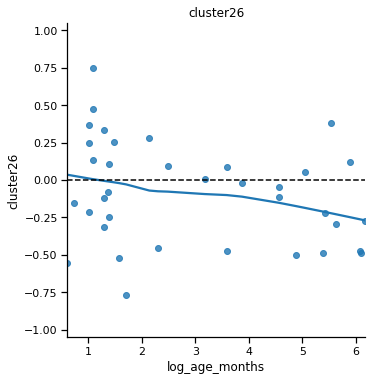

0.11


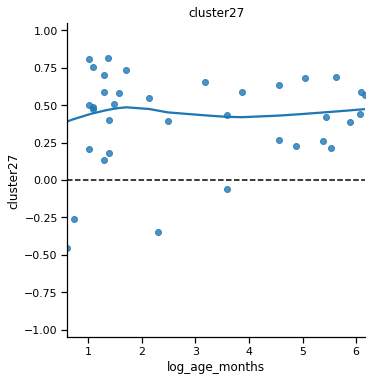

-0.843


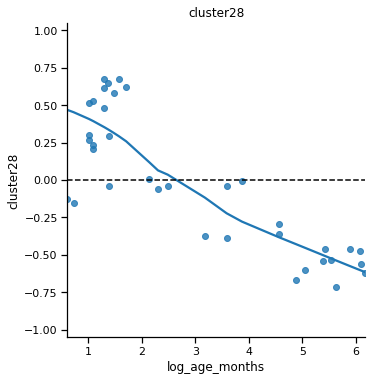

-0.815


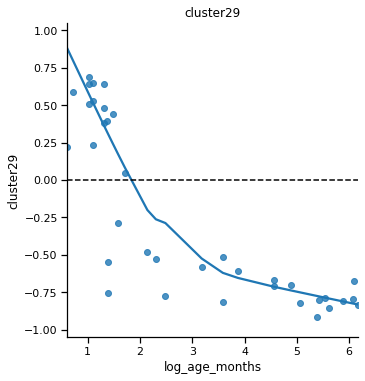

0.224


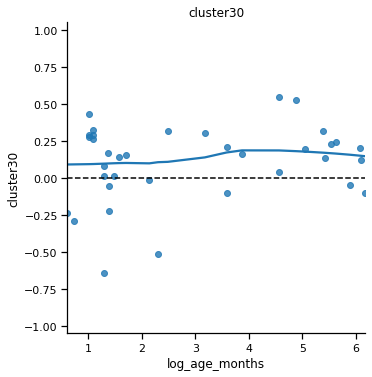

0.209


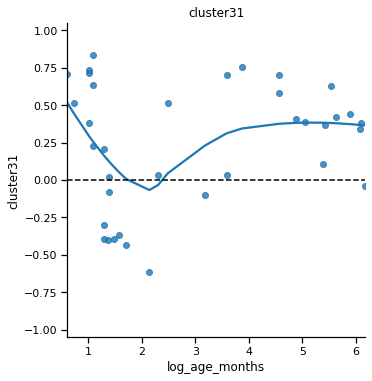

-0.162


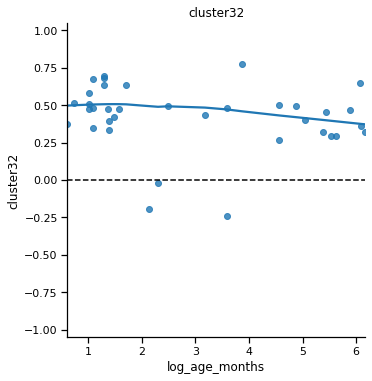

-0.119


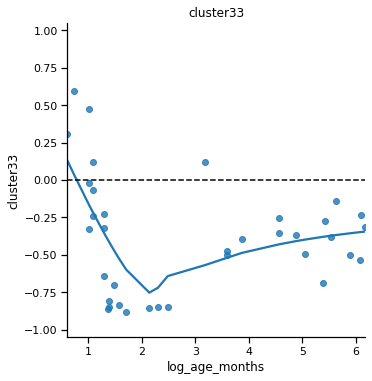

-0.553


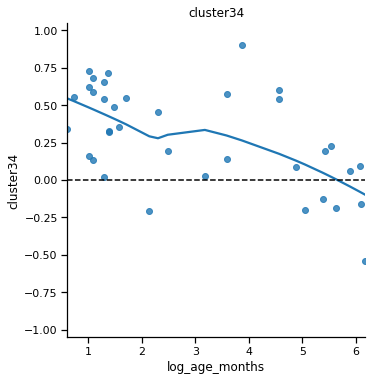

-0.104


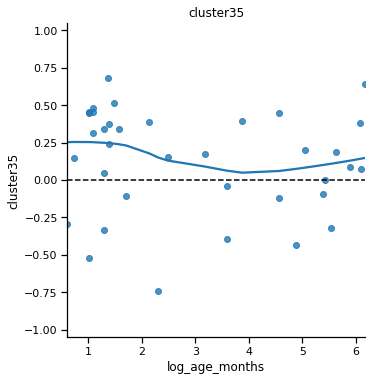

-0.321


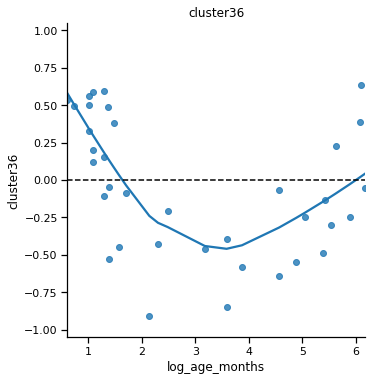

-0.228


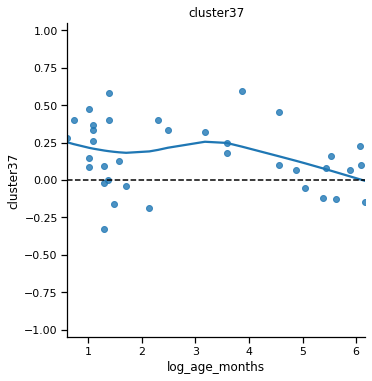

0.634


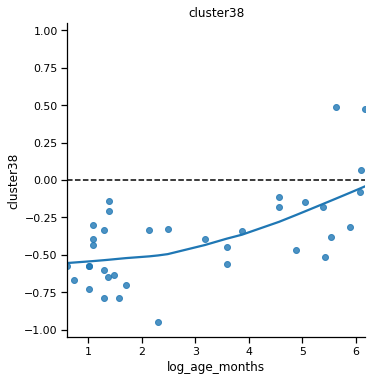

0.145


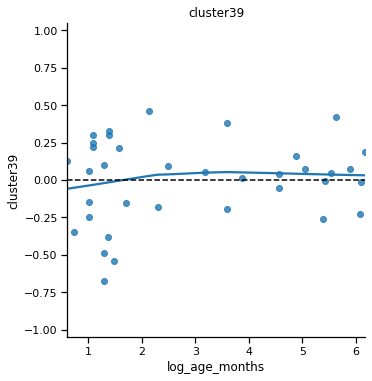

In [644]:
for cluster in [x for x in cplots.columns if 'cluster' in x]:
    r,p = stats.pearsonr(cplots[cluster].values,cplots.log_age_months.values)
    g=sns.lmplot(x='log_age_months',y=cluster,
            #hue='gender',
            lowess=True,
             #scatter_kws={'color':'k'},
           data=cplots)
    plt.ylim(-1.05,1.05)
    plt.axhline(0,ls='--',c='k')
    plt.title(cluster)
    print(round(r,3))
    plt.show()

In [ ]:
[1,5?,6,27?,32]

In [717]:
genes

['ME1',
 'KCNG1',
 'MGAT4C',
 'NUPR1',
 'GPRIN2',
 'BCL2A1',
 'RSPO4',
 'ENOX1',
 'PRMT2',
 'NSFL1C',
 'CNGB1',
 'EFHC2',
 'CCDC103',
 'PITPNC1',
 'GFAP',
 'LPP',
 'NTSR1',
 'PEX19',
 'CLEC18B',
 'PTGER3',
 'SLC27A6',
 'NKAIN4',
 'NAV2',
 'GPR68',
 'SCN7A',
 'RYR3',
 'ANKRD50',
 'SSTR1',
 'HDC',
 'GPX3',
 'SLC4A3',
 'APLNR',
 'CLIC5',
 'SGSH',
 'SLC26A11',
 'ST20',
 'SYT6',
 'GOLT1A',
 'CHODL',
 'CACNA1H',
 'NWD1',
 'SOX3',
 'ROBO2',
 'TSKU',
 'PCBD1',
 'CBLN1',
 'PTPRF',
 'RTP1',
 'SCARA5',
 'LOC441052',
 'DNAH14',
 'GAL',
 'WISP2',
 'RRP7A',
 'DBX2',
 'IL17RD',
 'GRIN3A',
 'RASL12',
 'DDAH2',
 'WDR66',
 'SPARC',
 'CXorf57',
 'CYB5R1',
 'FABP5',
 'COL21A1',
 'GPR143',
 'KRT31',
 'AQP1',
 'FERMT1',
 'SEMA5A',
 'FLJ30901',
 'GRID2',
 'GRP',
 'SOX11',
 'PCDH17',
 'SKAP1',
 'RGS22',
 'FABP5P3',
 'SLC30A10',
 'PLCH1',
 'ADCYAP1R1',
 'LRRC36',
 'CDH11',
 'SCN9A',
 'SEMA3C',
 'KLHL13',
 'ADAMTS9',
 'SLC35F2',
 'TCEA3',
 'WFDC1',
 'HTR7',
 'NRP1',
 'THBD',
 'PIRT',
 'FSTL5',
 'LRRN1',
 'AEBP1

In [718]:
for gene in genes: print(gene)

ME1
KCNG1
MGAT4C
NUPR1
GPRIN2
BCL2A1
RSPO4
ENOX1
PRMT2
NSFL1C
CNGB1
EFHC2
CCDC103
PITPNC1
GFAP
LPP
NTSR1
PEX19
CLEC18B
PTGER3
SLC27A6
NKAIN4
NAV2
GPR68
SCN7A
RYR3
ANKRD50
SSTR1
HDC
GPX3
SLC4A3
APLNR
CLIC5
SGSH
SLC26A11
ST20
SYT6
GOLT1A
CHODL
CACNA1H
NWD1
SOX3
ROBO2
TSKU
PCBD1
CBLN1
PTPRF
RTP1
SCARA5
LOC441052
DNAH14
GAL
WISP2
RRP7A
DBX2
IL17RD
GRIN3A
RASL12
DDAH2
WDR66
SPARC
CXorf57
CYB5R1
FABP5
COL21A1
GPR143
KRT31
AQP1
FERMT1
SEMA5A
FLJ30901
GRID2
GRP
SOX11
PCDH17
SKAP1
RGS22
FABP5P3
SLC30A10
PLCH1
ADCYAP1R1
LRRC36
CDH11
SCN9A
SEMA3C
KLHL13
ADAMTS9
SLC35F2
TCEA3
WFDC1
HTR7
NRP1
THBD
PIRT
FSTL5
LRRN1
AEBP1
TSPAN33
SDK2
VWA5A
SMARCD3
HRH3
EGFEM1P
DPYSL3
ARHGAP4
SIX3
GXYLT2
VAT1L
HSPB8
RPH3AL
PRR5
TEX26
KCNA5
CTXN3
TSPAN2
MT1F
FABP6
ZIC1
WTIP
FOXF2
ACTC1
PCSK5
ZMYND10
AMIGO2
CD6
HCN4
SYT10
AMDHD1
TGFBI
PRRX1
MET
TDRD1
MGP
LXN
CPLX2
COL5A1
LAG3
CADPS2
COX7A1
SCN1B
MST1R
SYN3
MYBPHL
SMPX
COL13A1
NELL1
RAD54B
ADAMTSL1
SYCP2
TMEM132E
SHD
FAM20A
HS3ST1
ST3GAL6
FRAT2
RASIP1
PLXDC1
RTKN2
PLOD2

In [645]:
cplots.loc[:,'ind'] = cplots.index

In [646]:
tall = pandas.melt(cplots,id_vars='ind',
                   value_vars=[x for x in cplots.columns if 'cluster' in x])
tall.loc[:,'log_age_months'] = cplots.log_age_months.tolist() * len(tall.variable.unique())

In [649]:
colors = []
for clust in tall.variable.unique():
    r,p = stats.pearsonr(cplots[clust].values,cplots.log_age_months.values)
    if clust in ['cluster1','cluster6','cluster27','cluster32']:
        colors.append('black')
    elif r < 0:
        colors.append('lightsteelblue')
    else:
        colors.append('lightcoral')

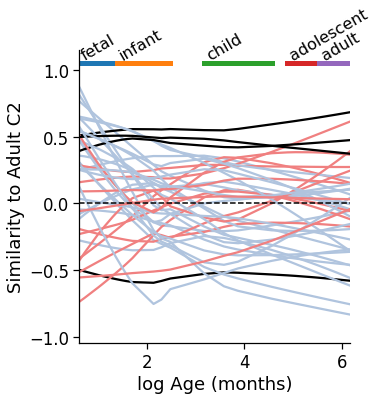

In [650]:
from matplotlib.collections import LineCollection

sns.set_context('notebook',font_scale=1.5)
g=sns.lmplot(x='log_age_months',y='value',
            hue='variable',lowess=True,
             markers='',palette=colors,
             legend=None,data=tall)
plt.ylabel('Similarity to Adult C2')
plt.xlabel('log Age (months)')

for stage in gdf.Age_Stage.unique():
    levels = gdf[gdf.Age_Stage==stage]['log_age_months'].values
    xmin = np.min(levels)
    xmax = np.max(levels)
    plt.plot([xmin,xmax],[1.05,1.05],lw=5)
    #loc = xmin + (xmax-xmin)*.5
    plt.text(xmin,1.05,stage,fontsize=16,ha='left',
             va='bottom',rotation=30)
plt.axhline(0,c='k',ls='--')
#plt.savefig(os.path.join(fig_dir,'cluster_timelinesC1.pdf'),bbox_inches='tight')

#### Criteria
* Mostly genes from one tail
* Goes in the expected direction
* Reaches r > 0.5 at some point

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='log_age_months', ylabel='value'>

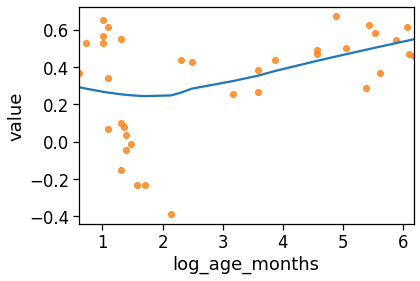

In [615]:
c = 9
jnk = g.ax.lines[c]
sns.regplot(jnk.get_data()[0],jnk.get_data()[1],lowess=True,scatter=False)
sns.regplot(x='log_age_months',y='value',data=tall[tall.variable=='cluster%s'%c],
           fit_reg=False)

In [651]:
crit = pandas.DataFrame(data['labels'].unique())

### CHANGE THIS DEPENDING ON COMPONENT
posg = c1[c1.expr>0].gene_symbol
negg = c1[c1.expr<0].gene_symbol

flats = [1,6,27,32]
for clust in data['labels'].unique():
    cluster = 'cluster'+str(clust)
    cgenes = [x.split('_')[0] for x in data[data.labels==clust].index]
    npos = len([x for x in cgenes if x in posg])
    nneg = len([x for x in cgenes if x in negg])
    
    # mostly genes from one tail
    if (npos+0.001) / (nneg+0.001) > 3:
        direction = 'pos'
    elif (npos+0.001) / (nneg+0.001) < 0.33:
        direction = 'neg'
    else:
        direction = 'ambiguous'
    crit.loc[clust,'direction'] = direction
    
    # goes in the expected direction
    r,p = stats.spearmanr(cplots[cluster].values,cplots.log_age_months.values)
    mn = cplots[cplots.log_age_months>4][cluster].values.mean() # mean signal post childhood
    if clust in flats:
        cor = 'flat'
    elif r < 0:
        cor = 'neg'
    else:
        cor = 'pos'
    crit.loc[clust,'correlation'] = cor
    crit.loc[clust,'rho'] = r
    if mn > 0:
        mean = 'pos'
    else:
        mean = 'neg'
    crit.loc[clust,'meandir'] = mean
    crit.loc[clust,'mean'] = mn
    if mean == direction:
        crit.loc[clust,'mean_match'] = 1
    else:
        crit.loc[clust,'mean_match'] = 0
    if cor == direction:
        crit.loc[clust,'cor_match'] = 1
    else:
        crit.loc[clust,'cor_match'] = 0
    
    # Reaches r > 0.5 at some point
    fitted = g.ax.lines[clust] # this comes from the multiline lmplot a few cells up
    max_r = np.max(abs(fitted.get_data()[1]))
    if max_r > 0.5:
        strength = True
        crit.loc[clust,'strenth_match'] = 1
    else:
        strength = False
        crit.loc[clust,'strenth_match'] = 0
    crit.loc[clust,'max_r'] = max_r
    
    # all criteria
    hit = False
    if cor == 'flat':
        hit = True
    else:
        if direction != 'ambiguous' and \
               crit.loc[clust,'mean_match'] == 1 and strength:
            hit = True
    if hit:
        crit.loc[clust,'hit'] = 1
    else:
        crit.loc[clust,'hit'] = 0
            
            

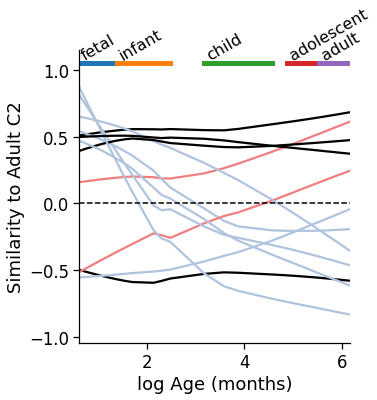

In [652]:
# derive colors and line styles
colors = []
for c,row in crit[crit.hit==1].iterrows():
    if row['correlation'] == 'flat':
        colors.append('black')
    elif row['direction'] == 'pos':
        colors.append('lightcoral')
    else:
        colors.append('lightsteelblue')

hits = ['cluster%s'%x for x in crit[crit.hit==1].index]
# plot
sns.set_context('notebook',font_scale=1.5)
g2=sns.lmplot(x='log_age_months',y='value',
            hue='variable',lowess=True,
             markers='',palette=colors,
             legend=None,data=tall[tall.variable.isin(hits)])
plt.ylabel('Similarity to Adult C2')
plt.xlabel('log Age (months)')

for stage in gdf.Age_Stage.unique():
    levels = gdf[gdf.Age_Stage==stage]['log_age_months'].values
    xmin = np.min(levels)
    xmax = np.max(levels)
    plt.plot([xmin,xmax],[1.05,1.05],lw=5)
    #loc = xmin + (xmax-xmin)*.5
    plt.text(xmin,1.05,stage,fontsize=16,ha='left',
             va='bottom',rotation=30)
plt.axhline(0,c='k',ls='--')
#plt.savefig(os.path.join(fig_dir,'cluster_timelinesC1.pdf'),bbox_inches='tight')

#### next criteria
* define peak
* define SD of variation
* find the point in lifespan where trajectory ceases to be different from peak

#### scratch that
* Divide r into age epochs
* find binary sig diffs between epochs for r
* categorize based on that

In [653]:
cplots.Age_Stage.value_counts()

fetal         16
child          6
adult          6
infant         4
adolescent     4
Name: Age_Stage, dtype: int64

<AxesSubplot:xlabel='Age_Stage'>

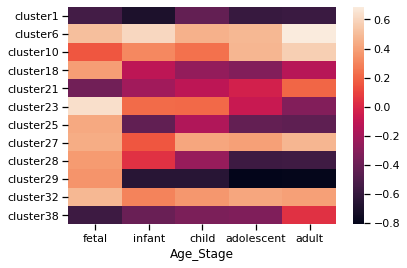

In [654]:
sns.set_context('notebook',font_scale=1)
order = ['fetal','infant','child','adolescent','adult']
sns.heatmap(cplots.groupby('Age_Stage')[hits].mean().T[order])

In [655]:
def balanced_subsample(y, size=None):

    subsample = []

    if size is None:
        n_smp = y.value_counts().min()
    else:
        n_smp = int(size / len(y.value_counts().index))

    for label in y.value_counts().index:
        samples = y[y == label].index.values
        index_range = range(samples.shape[0])
        indexes = np.random.choice(index_range, size=n_smp, replace=False)
        subsample += samples[indexes].tolist()

    return subsample

In [657]:
groupdifs = []

for clust in hits :
    print('working on',clust)
    for i in range(1):#00):
        # subsample so all categories have 4 subjects
        ss = balanced_subsample(cplots.Age_Stage)
        ssdf = cplots.loc[ss]
        # get omnibus stats
        F,p = stats.f_oneway(ssdf[ssdf.Age_Stage=='fetal'][clust].values,
                  ssdf[ssdf.Age_Stage=='infant'][clust].values,
                  ssdf[ssdf.Age_Stage=='child'][clust].values,
                  ssdf[ssdf.Age_Stage=='adolescent'][clust].values,
                  ssdf[ssdf.Age_Stage=='adult'][clust].values)
        # store tukey hd output
        output = pairwise_tukeyhsd(cplots[clust],cplots.Age_Stage)
        gdiff = pandas.DataFrame(np.array(output.summary().data[1:]),
                        columns = output.summary().data[0])
        # annotate and index
        gdiff.loc[:,'F'] = F
        gdiff.loc[:,'p'] = p
        gdiff.loc[:,'cluster'] = clust
        gdiff.loc[:,'i'] = i
        groupdifs.append(gdiff)
# combine all results
results = pandas.concat(groupdifs)

working on cluster1
working on cluster6
working on cluster10
working on cluster18
working on cluster21
working on cluster23
working on cluster25
working on cluster27
working on cluster28
working on cluster29
working on cluster32
working on cluster38


In [658]:
def func(x):
    if x == 'False':
        return 0
    else:
        return 1

results.loc[:,'reject'] = results.reject.apply(func).values

In [659]:
for i,row in results.iterrows():
    results.loc[i,'group'] = '%s_%s'%(row['group1'],row['group2'])

I checked and, despite having random samples, every iteration had the same results (not surprising given most of the variation was coming from large effect size group

In [660]:
jnk = pandas.DataFrame(results[results.i==0])

In [661]:
jnk.loc[:,'ind'] = range(len(jnk))
jnk.pivot(index='group',columns='cluster',values='reject')

cluster,cluster1,cluster10,cluster18,cluster21,cluster23,cluster25,cluster27,cluster28,cluster29,cluster32,cluster38,cluster6
group,,,,,,,,,,,,
adolescent_adult,0,0,0,0,0,0,0,0,0,0,0,0
adolescent_child,0,0,0,0,0,0,0,0,0,0,0,0
adolescent_fetal,0,1,1,0,1,1,0,1,1,0,0,0
adolescent_infant,0,0,0,0,0,0,0,1,0,0,0,0
adult_child,0,1,0,0,1,0,0,0,0,0,0,0
adult_fetal,0,1,1,1,1,1,0,1,1,0,1,0
adult_infant,0,0,0,0,1,0,0,1,0,0,1,0
child_fetal,0,0,1,0,1,1,0,1,1,0,0,0
child_infant,1,0,0,0,0,0,0,0,0,0,0,0


* C1: Infant - Child (flat)
* C6: - (flat)
* C10: fetal - adolescent
* C18: fetal - child
* C21: fetal - adult
* C23: Fetal - Infant - Adult
* C25: Fetal - Infant
* C27: - (flat)
* C28: Fetal - Child
* C29: Fetal - Infant
* C32: - (flat)
* C38: Fetal - Adult

In [662]:
cats = dict(zip(hits,['fetal_nl','fetal_nl','postchild','child','postchild','postchild',
                      'infant','fetal_nl','child','infant','fetal_nl','postchild']))
colos = dict(zip(['fetal_nl','infant','child','postchild'],
                sns.color_palette('tab20',4)))
pal = [colos[x] for x in cats.values()]

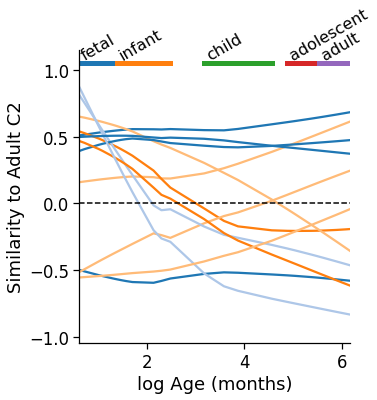

In [663]:
# plot
sns.set_context('notebook',font_scale=1.5)
g2=sns.lmplot(x='log_age_months',y='value',
            hue='variable',lowess=True,
             markers='',palette=pal,
             legend=None,data=tall[tall.variable.isin(hits)])
plt.ylabel('Similarity to Adult C2')
plt.xlabel('log Age (months)')

for stage in gdf.Age_Stage.unique():
    levels = gdf[gdf.Age_Stage==stage]['log_age_months'].values
    xmin = np.min(levels)
    xmax = np.max(levels)
    plt.plot([xmin,xmax],[1.05,1.05],lw=5)
    #loc = xmin + (xmax-xmin)*.5
    plt.text(xmin,1.05,stage,fontsize=16,ha='left',
             va='bottom',rotation=30)
plt.axhline(0,c='k',ls='--')
#plt.savefig(os.path.join(fig_dir,'cluster_timelinesC1.pdf'),bbox_inches='tight')

In [664]:
for i,row in crit.iterrows():
    c = 'cluster%s'%i
    if c in cats.keys():
        crit.loc[i,'category'] = cats[c]

In [668]:
keepers = []
for clust in crit[crit.category=='postchild'][0].values:
    jnk = data[data.labels==clust]
    for x in jnk.index:
        j2 = x.split('_')[0]
        #print(j2)
        keepers.append(j2)
    #print('\n\n')
np.array(keepers)

array(['ST3GAL6', 'ADAMTS9', 'FABP5P3', 'LAG3', 'RSPO4', 'SHD', 'SCN1B',
       'VAV3', 'CHODL', 'TSPAN33', 'PLXDC1', 'MEI1', 'KCND3', 'LRRN1',
       'TMEM132E', 'KCTD8', 'TUBA8', 'DSP', 'AEBP1', 'PRRX1', 'TGFBI',
       'APLNR', 'FOXF2', 'THBD', 'MYO19', 'MST1R', 'CACNA1H', 'RYR3'],
      dtype='<U8')

In [669]:
jnk = subsum[subsum.Age_Stage.isin(['adult','adolescent'])]
jnk = jnk[[x for x in jnk.columns if 'rho' in x]].mean()
corgenes = [x.split('_')[0] for x in jnk[jnk>0.5].index]


In [670]:
gdf.loc[:,'C1_topcor_gxp'] = gxp.loc[corgenes].mean().values

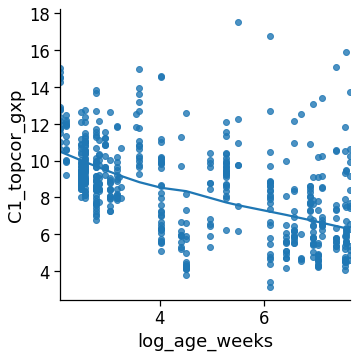

In [671]:
sns.lmplot(x='log_age_weeks',y='C1_topcor_gxp',data=gdf,lowess=True)

/Users/jacobv/pls_gxp/lib/python3.7/site-packages/statsmodels/nonparametric/smoothers_lowess.py:215: RuntimeWarning: invalid value encountered in greater_equal
  frac=frac, it=it, delta=delta, given_xvals=False)


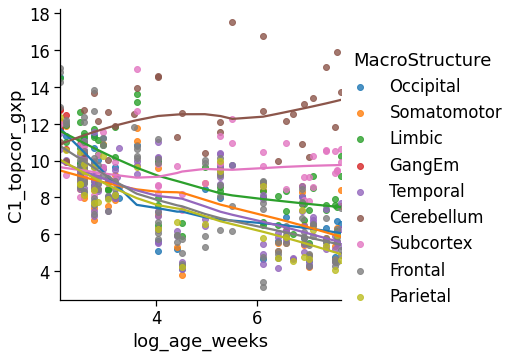

In [672]:
sns.lmplot(x='log_age_weeks',y='C1_topcor_gxp',data=gdf,lowess=True,hue='MacroStructure')

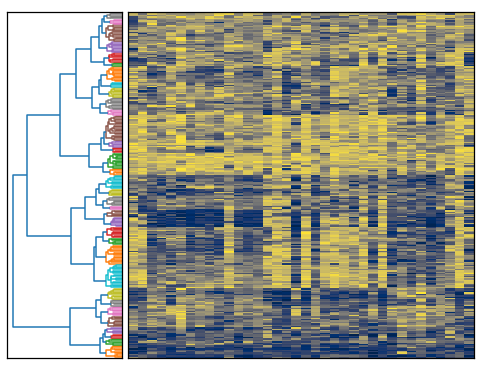

In [673]:
# Dendrogram that comes to the left

D = pandas.DataFrame(c2ss.T, copy=True)
D = D.values

fig = plt.figure(figsize=(8,8))
# Add an axes at position rect [left, bottom, width, height]
ax1 = fig.add_axes([0.09, 0.1, 0.2, 0.6])
Y = link
# orientation='left' is reponsible for making the 
# dendrogram appear to the left
Z1 = shc.dendrogram(Y, orientation='left',color_threshold=4)
ax1.set_xticks([])
ax1.set_yticks([])


# main heat-map
axmatrix = fig.add_axes([0.3, 0.1, 0.6, 0.6])
idx1 = Z1['leaves']
D = D[idx1, :]
# the actual heat-map
im = axmatrix.matshow(D, aspect='auto', origin='lower', cmap="cividis")
axmatrix.set_xticks([])
axmatrix.set_yticks([])

#plt.savefig(os.path.join(fig_dir,'DendoC2.pdf'),bbox_inches='tight')
plt.show()

In [731]:
topgenes.head()

,C2,C1,C3,tail
0,ME1,MET,MOGAT2,negative
1,KCNG1,DSP,KCNJ14,negative
2,MGAT4C,GRP,EFR3A,negative
3,NUPR1,FRAT1,PLCH1,negative
4,GPRIN2,IP6K2,PCDH12,negative


In [734]:
olapc12 = set(topgenes.C2.values) & set(topgenes.C1.values)
olapc23 = set(topgenes.C2.values) & set(topgenes.C3.values)
olapc13 = set(topgenes.C3.values) & set(topgenes.C1.values)
olapc123 = set(topgenes.C3.values) & set(topgenes.C1.values) & set(topgenes.C2.values)

In [735]:
len(olapc123)

6

In [736]:
olapc123

{'CTXN3', 'MET', 'MGP', 'PLCH1', 'PRRX1', 'RASIP1'}

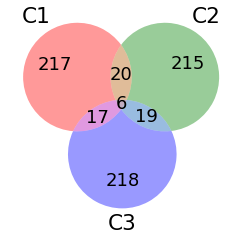

In [739]:
import matplotlib_venn as venn

venn.venn3([set(topgenes.C1.values), 
            set(topgenes.C2.values), 
            set(topgenes.C3.values)], ('C1', 'C2', 'C3'))

plt.show()

In [750]:
topgenes.to_csv('/Users/jacobv/Science/PLS_GXP/PLSGXP_topgenes_list.csv')

In [5]:
set(top_genes.C1.values) & set(top_genes.C2.values) & set(top_genes.C3.values)

{'CTXN3', 'MET', 'MGP', 'PLCH1', 'PRRX1', 'RASIP1'}

In [6]:
allendir = '/Users/jacobv/abagen-data/microarray/'
probes = pandas.read_csv(os.path.join(allendir,'normalized_microarray_donor10021/Probes.csv'))

In [3]:
top_genes = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/PLSGXP_topgenes_list.csv',index_col=0)
top_genes

,C2,C1,C3,tail
0,ME1,MET,MOGAT2,negative
1,KCNG1,DSP,KCNJ14,negative
2,MGAT4C,GRP,EFR3A,negative
3,NUPR1,FRAT1,PLCH1,negative
4,GPRIN2,IP6K2,PCDH12,negative
...,...,...,...,...
255,NDRG3,ISLR2,KCNG1,positive
256,SCRT1,KCNJ4,CAPN12,positive
257,KCNAB3,ITGB1BP1,GHR,positive
258,CUX1,ADCY2,HIST1H4K,positive


In [15]:
len(np.unique(jnk))

130

In [19]:
for x in np.unique(probes.entrez_id.values.astype(int)): print(x)

-9223372036854775808
1
2
9
10
12
13
14
15
16
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
43
47
48
49
50
51
52
53
54
55
56
58
59
60
70
71
72
81
86
87
88
89
90
91
92
93
94
95
97
98
100
101
102
103
104
105
107
108
109
111
112
113
114
115
116
117
118
119
120
123
124
125
126
127
128
130
131
132
133
134
135
136
140
141
142
143
146
147
148
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
172
173
174
175
176
177
178
181
182
183
185
186
187
189
190
191
196
197
199
202
203
204
205
207
208
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
229
230
231
238
239
240
241
242
245
246
247
248
249
250
251
257
258
259
262
265
266
267
268
269
270
271
272
273
274
275
277
279
283
284
285
286
287
288
290
291
292
293
301
302
303
305
306
307
308
309
310
311
312
313
314
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
341
343
344
345
346
347
348
350
351
353
354
355
356
357
358
359
360
361
362
363
3

4958
4967
4968
4969
4973
4974
4975
4976
4978
4982
4983
4985
4986
4987
4988
4990
4991
4992
4993
4994
4995
4998
4999
5000
5001
5002
5003
5004
5005
5007
5008
5009
5010
5013
5015
5016
5017
5018
5019
5020
5021
5023
5024
5025
5026
5027
5028
5029
5030
5031
5032
5033
5034
5036
5037
5042
5045
5046
5047
5048
5049
5050
5051
5052
5053
5054
5055
5058
5062
5064
5066
5067
5068
5069
5071
5073
5074
5075
5076
5077
5078
5079
5080
5081
5082
5083
5087
5089
5090
5091
5092
5093
5094
5095
5096
5097
5098
5099
5100
5101
5104
5105
5106
5108
5110
5111
5116
5118
5119
5121
5122
5125
5126
5127
5128
5129
5130
5132
5133
5134
5136
5137
5138
5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5172
5173
5174
5175
5176
5178
5179
5184
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5201
5202
5203
5204
5205
5207
5208
5209
5210
5211
5212
5213
5214
5216
5217
5218
5223
5224
5225
5226
5228
5229
5230
5232


9473
9474
9475
9476
9477
9478
9479
9480
9481
9482
9486
9487
9488
9489
9491
9493
9495
9496
9497
9498
9499
9500
9501
9502
9503
9506
9507
9508
9509
9510
9512
9513
9514
9515
9516
9517
9518
9519
9520
9521
9522
9525
9526
9527
9528
9529
9530
9531
9532
9533
9534
9535
9536
9537
9538
9540
9541
9542
9543
9545
9546
9547
9550
9551
9552
9553
9554
9555
9556
9557
9559
9562
9563
9564
9567
9568
9569
9570
9572
9573
9575
9576
9577
9578
9580
9581
9582
9583
9584
9585
9586
9587
9588
9589
9590
9592
9595
9597
9600
9601
9603
9604
9605
9607
9609
9610
9611
9612
9615
9616
9617
9618
9619
9620
9622
9623
9625
9626
9627
9628
9629
9630
9631
9632
9633
9635
9636
9637
9638
9639
9640
9641
9643
9644
9645
9646
9647
9648
9649
9650
9651
9652
9653
9654
9655
9656
9657
9658
9659
9662
9663
9665
9666
9667
9668
9669
9670
9671
9672
9673
9674
9675
9677
9678
9679
9681
9682
9683
9684
9685
9686
9687
9688
9689
9690
9692
9693
9694
9695
9696
9697
9698
9699
9700
9701
9702
9703
9704
9705
9706
9708
9709
9710
9711
9712
9715
9716
9717
9718
9719


22795
22796
22797
22798
22800
22801
22802
22803
22806
22807
22808
22809
22818
22820
22821
22822
22823
22824
22826
22827
22828
22829
22832
22834
22835
22836
22837
22838
22839
22841
22843
22844
22845
22846
22847
22848
22849
22850
22852
22853
22854
22856
22858
22859
22861
22862
22863
22864
22865
22866
22868
22869
22870
22871
22872
22873
22874
22875
22876
22877
22878
22879
22880
22881
22882
22883
22884
22885
22887
22888
22889
22890
22891
22893
22894
22895
22897
22898
22899
22900
22901
22902
22903
22904
22905
22906
22907
22908
22909
22911
22913
22914
22915
22916
22917
22918
22919
22920
22921
22924
22925
22926
22927
22928
22929
22930
22931
22932
22933
22934
22936
22937
22938
22941
22943
22944
22948
22949
22950
22953
22954
22955
22973
22974
22976
22977
22978
22979
22980
22981
22982
22983
22984
22985
22986
22987
22989
22990
22992
22993
22994
22995
22996
22997
22998
22999
23001
23002
23005
23007
23008
23011
23012
23013
23014
23015
23016
23017
23019
23020
23022
23023
23024
23025
23026
23028
2302

29850
29851
29855
29880
29881
29882
29883
29886
29887
29888
29889
29890
29893
29894
29895
29896
29899
29901
29902
29903
29904
29906
29907
29909
29911
29914
29915
29916
29919
29920
29922
29923
29924
29925
29926
29927
29928
29929
29930
29931
29933
29934
29935
29937
29940
29941
29942
29943
29944
29945
29946
29947
29948
29949
29950
29951
29952
29953
29954
29956
29957
29958
29959
29960
29964
29965
29966
29967
29968
29969
29970
29974
29978
29979
29980
29982
29984
29985
29986
29988
29989
29990
29991
29992
29993
29994
29995
29997
29998
29999
30000
30001
30008
30009
30010
30011
30012
30014
30061
30062
30811
30812
30813
30814
30815
30816
30817
30818
30819
30820
30827
30832
30833
30834
30835
30836
30837
30844
30845
30846
30848
30849
30850
30851
30968
43847
43849
49854
49855
49856
49860
49861
50484
50485
50486
50487
50488
50489
50506
50507
50508
50509
50511
50512
50514
50515
50604
50613
50614
50615
50616
50617
50618
50619
50624
50626
50628
50632
50636
50640
50649
50650
50651
50674
50700
50717
5080

55466
55471
55472
55478
55486
55500
55501
55502
55503
55504
55505
55506
55507
55508
55509
55510
55511
55512
55515
55520
55521
55526
55527
55529
55530
55531
55532
55534
55539
55540
55544
55545
55552
55553
55554
55556
55558
55559
55561
55565
55567
55568
55571
55572
55573
55576
55577
55578
55582
55584
55585
55586
55588
55589
55591
55592
55593
55596
55599
55600
55601
55602
55603
55604
55605
55607
55608
55609
55610
55611
55612
55613
55614
55615
55616
55617
55619
55620
55621
55622
55623
55624
55625
55626
55627
55628
55629
55630
55631
55632
55633
55634
55635
55636
55638
55640
55643
55644
55646
55647
55650
55651
55652
55653
55654
55655
55656
55657
55658
55659
55660
55661
55662
55663
55664
55665
55666
55667
55668
55669
55670
55671
55672
55676
55677
55679
55680
55681
55683
55684
55686
55687
55689
55690
55691
55692
55693
55695
55696
55697
55698
55699
55700
55701
55702
55703
55704
55705
55706
55707
55709
55711
55713
55714
55715
55716
55717
55718
55719
55720
55721
55722
55723
55726
55727
55728
5572

65244
65249
65250
65251
65258
65260
65263
65264
65265
65266
65267
65268
65975
65977
65979
65980
65981
65982
65983
65985
65986
65987
65988
65989
65990
65991
65992
65993
65996
65997
65998
65999
66000
66002
66004
66005
66008
66035
66036
66037
78986
78987
78988
78989
78990
78991
78992
78994
78995
78996
78997
78998
78999
79000
79001
79002
79003
79004
79005
79006
79007
79009
79012
79015
79016
79017
79018
79019
79020
79022
79023
79024
79025
79026
79027
79029
79031
79033
79034
79035
79036
79037
79038
79039
79041
79042
79047
79048
79050
79053
79054
79056
79057
79058
79064
79065
79066
79068
79070
79071
79072
79073
79074
79075
79077
79078
79080
79081
79083
79084
79085
79086
79087
79088
79089
79090
79091
79092
79094
79095
79096
79097
79098
79100
79101
79102
79109
79132
79133
79134
79135
79136
79137
79139
79140
79142
79143
79144
79145
79147
79148
79149
79152
79153
79154
79155
79156
79157
79158
79159
79160
79161
79165
79166
79168
79169
79170
79171
79172
79173
79174
79175
79176
79177
79178
79180
7918

84815
84816
84817
84818
84820
84823
84824
84826
84830
84832
84833
84836
84837
84838
84839
84842
84843
84844
84849
84850
84851
84852
84856
84858
84859
84861
84864
84865
84866
84867
84868
84869
84870
84871
84872
84873
84874
84875
84876
84878
84879
84881
84883
84885
84886
84888
84889
84890
84891
84892
84893
84894
84895
84896
84897
84898
84899
84900
84901
84902
84904
84905
84908
84909
84910
84911
84912
84913
84914
84915
84916
84918
84919
84920
84922
84923
84924
84925
84926
84928
84929
84930
84931
84932
84933
84934
84935
84936
84937
84938
84939
84940
84941
84942
84944
84945
84946
84947
84948
84950
84951
84952
84953
84954
84955
84957
84958
84959
84960
84961
84962
84964
84966
84967
84968
84969
84970
84971
84973
84975
84976
84978
84981
84983
84984
84985
84986
84987
84988
84989
84991
84992
84993
84996
85001
85002
85003
85004
85007
85009
85012
85013
85014
85015
85016
85019
85021
85025
85026
85027
85028
85235
85236
85280
85285
85289
85290
85291
85293
85294
85300
85301
85302
85313
85315
85317
8531

130827
130872
130888
130916
130940
130951
131034
131055
131076
131096
131118
131149
131177
131368
131375
131377
131405
131408
131450
131474
131540
131544
131566
131578
131583
131601
131616
131669
131831
131870
131873
131890
131920
131965
132001
132014
132112
132141
132158
132160
132200
132203
132204
132228
132241
132243
132299
132320
132321
132332
132430
132612
132625
132660
132671
132720
132724
132789
132851
132864
132884
132946
132949
132954
132989
133015
133022
133060
133121
133308
133383
133396
133418
133482
133491
133522
133558
133584
133619
133686
133688
133690
133746
133874
133923
133957
134083
134111
134121
134145
134147
134187
134218
134265
134266
134285
134288
134353
134359
134391
134429
134430
134466
134492
134510
134526
134548
134549
134553
134637
134701
134728
134829
134860
134864
134957
135112
135114
135138
135152
135154
135228
135250
135293
135295
135398
135458
135644
135656
135886
135892
135924
135927
135932
135935
135941
135946
135948
136051
136157
136227
136242
136259

219541
219557
219578
219595
219621
219623
219654
219670
219681
219699
219736
219738
219743
219749
219770
219771
219790
219793
219833
219844
219854
219855
219858
219865
219869
219870
219873
219874
219875
219899
219902
219927
219931
219938
219952
219954
219956
219957
219958
219959
219960
219965
219968
219970
219972
219981
219982
219983
219986
219988
219990
219995
220001
220002
220004
220032
220042
220047
220064
220070
220074
220077
220081
220082
220107
220108
220115
220134
220136
220164
220202
220213
220296
220323
220359
220382
220388
220416
220429
220441
220594
220729
220832
220869
220885
220906
220929
220963
220965
220972
220979
220988
220992
221002
221016
221035
221037
221044
221060
221061
221074
221078
221079
221091
221092
221120
221143
221150
221154
221178
221184
221188
221191
221223
221241
221264
221294
221301
221302
221303
221322
221336
221357
221391
221393
221395
221400
221409
221416
221421
221424
221442
221443
221458
221468
221472
221476
221477
221481
221491
221496
221504
221527

374654
374655
374659
374666
374739
374768
374786
374819
374860
374864
374868
374875
374877
374879
374882
374887
374897
374899
374900
374907
374918
374920
374928
374946
374955
374969
374973
374977
374986
374987
375033
375035
375056
375057
375061
375133
375189
375190
375196
375248
375260
375287
375295
375298
375307
375316
375318
375323
375337
375341
375346
375387
375444
375449
375484
375519
375567
375607
375611
375612
375616
375686
375704
375719
375743
375748
375757
375759
375775
375790
375791
376132
376267
376497
376693
376940
377007
377047
377677
377711
377841
378108
378465
378708
378805
378807
378820
378825
378828
378884
378925
378938
379025
386617
386618
386653
386672
386674
386675
386676
386677
386678
386679
386680
386681
386682
386683
386684
386685
386724
386746
386757
386759
387032
387036
387066
387071
387082
387103
387104
387119
387129
387254
387263
387264
387266
387267
387273
387316
387328
387332
387338
387357
387486
387496
387509
387521
387522
387535
387590
387597
387601
387628

652764
652826
652859
652904
652968
652995
653051
653056
653073
653097
653110
653111
653114
653121
653140
653145
653162
653166
653188
653192
653203
653219
653238
653240
653247
653269
653319
653340
653361
653365
653375
653390
653436
653450
653464
653479
653483
653486
653499
653505
653506
653509
653513
653548
653562
653567
653583
653602
653604
653635
653639
653641
653653
653657
653781
653808
653857
653881
653888
654254
654346
654348
654429
654433
654434
654463
654466
654502
654780
654790
654817
664701
677769
678655
692094
692099
692312
723790
723809
723961
723972
727701
727726
727764
727796
727799
727800
727803
727820
727830
727837
727851
727858
727869
727910
727916
727930
727936
727938
727940
727941
727957
727961
727967
727982
727983
728012
728024
728039
728042
728045
728047
728056
728071
728080
728082
728100
728116
728130
728142
728148
728153
728175
728215
728224
728229
728255
728262
728264
728278
728279
728288
728294
728297
728299
728327
728361
728373
728378
728392
728401
728407
728409

In [24]:
jnk = probes[probes.gene_symbol.isin(top_genes[top_genes['tail']=='negative'].C3.values)].entrez_id.astype(int).values
for x in np.unique(jnk): print(x)

176
326
831
1004
1522
1843
2048
2070
2101
2104
3084
3624
3679
3770
3827
4043
4258
4277
4703
4744
4824
5091
5121
5122
5325
5396
5453
5455
5791
5937
5947
5979
6320
6323
6451
6546
6676
6843
6890
7007
7222
7276
8099
8631
8829
9037
9127
9353
9454
9480
9569
10140
10231
10268
10451
10478
11255
22824
23007
23167
23221
23432
25834
26031
26297
27163
27254
29952
50486
51059
51083
51201
51294
54551
55040
55061
55502
55920
56255
56848
57827
64080
64150
64377
79675
79740
79767
79884
79990
80119
80168
80307
80326
80820
81539
81606
83547
83690
83707
85015
85446
91252
92106
94081
112703
116255
122046
122953
127833
130399
132321
146177
147463
148281
150378
160760
161823
162494
165679
202333
284207
284348
284415
326624
339829
375567
388610
613212
729171
100507436


# Toppgene

In [866]:
c1 = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/ToppGene/C1_top.txt',
                    sep='\t')
c1.head()

,Category,ID,Name,Source,p-value,q-value Bonferroni,q-value FDR B&H,q-value FDR B&Y,Hit Count in Query List,Hit Count in Genome,Hit in Query List
0,Pathway,1270249,Crosslinking of collagen fibrils,BioSystems: REACTOME,1.262000e-05,0.009337,0.009337,0.06708,3,9,"LOXL2,TLL1,PCOLCE"
1,Pubmed,32541007,Stromal ?-catenin activation impacts nephron p...,Pubmed,7.318000e-07,0.011860,0.007499,0.07702,4,24,"PENK,LHX1,PAX8,NTN1"
2,Pubmed,19334288,Three-dimensional visualization of testis cord...,Pubmed,1.288000e-06,0.020870,0.007499,0.07702,7,183,"COL8A2,LMCD1,IGDCC3,GRIA4,PRC1,LHX1,TMEM255A"
3,Pubmed,16139370,Ectopic HOXA5 expression results in abnormal d...,Pubmed,1.388000e-06,0.022500,0.007499,0.07702,3,8,"HOXA5,LHX1,PRPH"
4,Pubmed,12100571,HLA and cytokine gene polymorphisms in biliary...,Pubmed,2.078000e-06,0.033670,0.007799,0.08009,3,9,"HLA-B,HLA-DPB1,IL1B"


C1_bottom


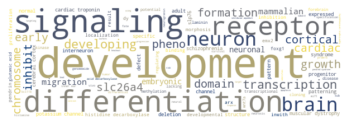

C1_top


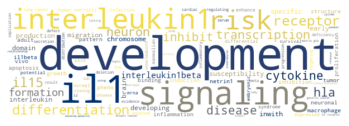

C2_bottom


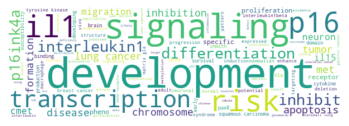

C2_top


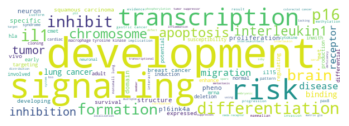

C3_bottom


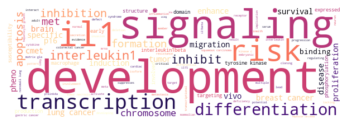

C3_top


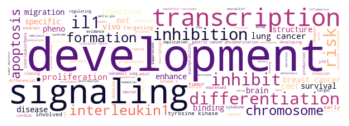

In [927]:
from glob import glob
import wordcloud

palettes = ['cividis','cividis_r','viridis','viridis_r','magma','magma_r']
badwords = ['human','expression','associated','gene','role','mouse',
            'novel','protein','association','cell','allele','effect',
            'required','pathway','polymorphism','patient',
           'via','factor','level','study','activation','regulation',
           'induce','response','interaction','analysis','regulate',
           'promote','type','contribute','activity','mediate',
           'control','reveal','mice','murine','variant','increase',
           'model','marker','class','modulate','inwith','new',
           'region','family','function','mutation','functional',
           'essential','tissue','molecular','characterization',
           'mechanism','mutant','two','distinct','cause',
           'influence','population','identification','primary',
           'loss','expressed''vivo','complex','vitro']
puncs = ['.','*','(',')','?','[',']','/','-',':',';','+',"\"","'s",',']
string = ''
sheets = sorted(glob('/Users/jacobv/Science/PLS_GXP/ToppGene/*.txt'))
for n,sheet in enumerate(sheets):
    cdf = pandas.read_csv(sheet,sep='\t')
    flnm = os.path.split(sheet)[1].split('.')[0]
    print(flnm)
    for i,row in cdf[cdf.Category=='Pubmed'].iterrows():
        pstr = row['Name'].lower()
        for punc in puncs:
            pstr=pstr.replace(punc,'')
        for word in badwords:
            pstr=pstr.replace(word,'')
        string += pstr+' '
    
    string = string.replace(' s ','').replace(' d ','').replace(' t ','')
    string = string.replace(' al ','').replace(' tic ','')
    wc = wordcloud.WordCloud(max_words=100, background_color="white",
                             colormap=palettes[n],width = 600,
                                # color_func=lambda *args, **kwargs: cmap
                                ).generate(string)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.savefig('/Users/jacobv/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/SubFigs/PMed_WC_%s'%flnm,
               bbox_inches = 'tight')
    plt.show()

In [917]:
from stylecloud import gen_stylecloud

========== C1_bottom ==========


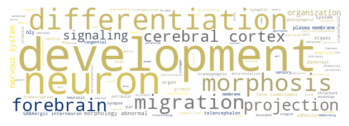

========== C1_top ==========


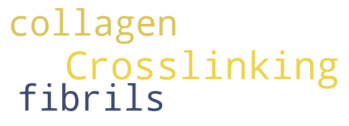

========== C2_bottom ==========


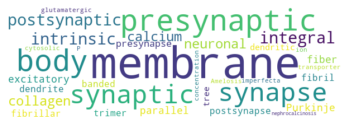

========== C2_top ==========


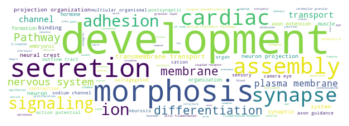

========== C3_bottom ==========


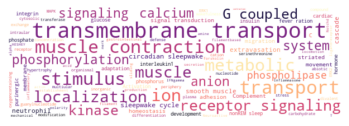

========== C3_top ==========


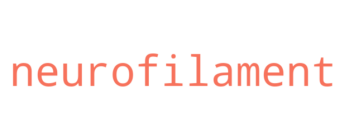

In [926]:
goodcats = ['GO: Biological Process','Mouse Phenotype',
           'GO: Cellular Component','Pathway',
           'GO: Molecular Function','Disease']
addwords = ['positive','negative','component','involved',
            'pathway','process']
for n,sheet in enumerate(sheets):
    cdf = pandas.read_csv(sheet,sep='\t')
    flnm = os.path.split(sheet)[1].split('.')[0]
    print('='*10,flnm,'='*10)
    string = ''
    for cat in goodcats:
        if cat in cdf.Category.unique():
            for i,row in cdf[cdf.Category==cat].iterrows():
                estr = row['Name']
                for punc in puncs:
                    estr=estr.replace(punc,'')
                for word in badwords + addwords:
                    estr=estr.replace(word,'')
                string += estr+' '
    string = string.replace(' s ','').replace(' d ','').replace(' t ','')
    string = string.replace(' al ','').replace(' tic ',''
                                              ).replace(' ular ',' ')
    wc = wordcloud.WordCloud(max_words=100, background_color="white",
                             colormap=palettes[n],width=600,
                                # color_func=lambda *args, **kwargs: cmap
                                ).generate(string)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.savefig('/Users/jacobv/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/SubFigs/Enr_WC_%s'%flnm,
           bbox_inches = 'tight')
    plt.show() 

# Toppgene Take 2

In [86]:
from glob import glob

sheets = sorted(glob('/Users/jacobv/Science/PLS_GXP/ToppGene/Oct*.txt'))
catch = []
for n,sheet in enumerate(sheets):
    cdf = pandas.read_csv(sheet,sep='\t')
    flnm = os.path.split(sheet)[1].split('.')[0]
    cdf.loc[:,'component'] = flnm.split('_')[1]
    cdf.loc[:,'tail'] = flnm.split('_')[2]
    catch.append(cdf)

cdf = pandas.concat(catch)

In [137]:
from copy import copy
to_remove = ['activity','negative','regulation','process',' of ','positive',
            ' to ','pathway',' from ','  '] # ' the ',' in '
terms = []
term_map = {}
cells = []
cell_map = {}
for name in cdf.Name.values:
    old_name = copy(name)
    for string in to_remove:
        name = name.replace(string,'')
    if '|' in name:
        name = name.split('|')[0]
        name = name.strip().lower()
        cells.append(name)
        cell_map.update({name:old_name})
    else:
        name = name.strip().lower()
        terms.append(name)
        term_map.update({name:old_name})

In [95]:
from difflib import SequenceMatcher
length = len(terms)
cmat = np.zeros((length,length))
for i in range(length):
    for j in range(length):
        cmat[i,j] = SequenceMatcher(a=terms[i],b=terms[j]).ratio()

In [ ]:
SequenceMatcher()

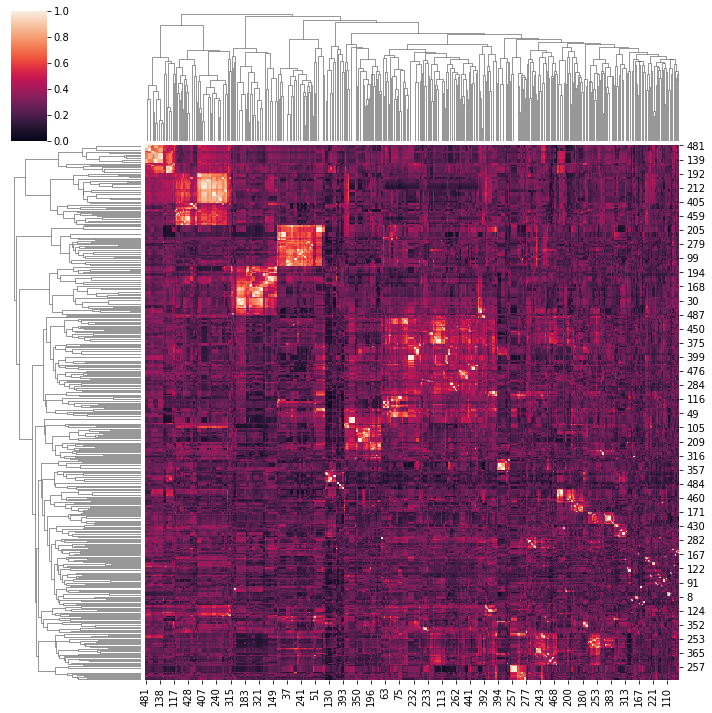

In [96]:
sns.clustermap(cmat)

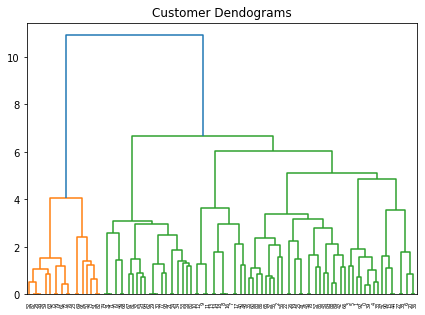

In [72]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(7, 5))
plt.title("Customer Dendograms")
link = shc.linkage(cmat, method='ward')
dend = shc.dendrogram(link)

In [110]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.cluster import AgglomerativeClustering

#csol = pandas.DataFrame()
for i,k in enumerate(range(200,250)):
    #print('working on k =',k)
    d = cmat
    cluster = AgglomerativeClustering(n_clusters=k, affinity='euclidean', 
                                  linkage='ward')
    cluster.fit_predict(d)
    csol.loc[i,'k'] = k
    csol.loc[i,'sil_score'] = silhouette_score(d,cluster.labels_,random_state=123)
    csol.loc[i,'ch_score'] = calinski_harabasz_score(d,cluster.labels_)

In [109]:
len(terms)

493

(170.0, 200.0)

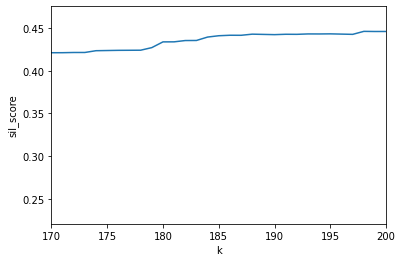

In [115]:
sns.lineplot(x='k',y='sil_score',data=csol)
plt.xlim(170,200)
# 30 and 45

In [120]:
# 181
cluster = AgglomerativeClustering(n_clusters=181, affinity='euclidean', 
                                  linkage='ward')
cluster.fit_predict(d)
term_clus = pandas.concat([pandas.Series(terms),
                          pandas.Series(cluster.labels_)],axis=1)
term_clus.columns = ['term','cluster']

In [121]:
for clab in term_clus.cluster.unique():
    print('cluster',clab,'\n')
    print(term_clus[term_clus.cluster==clab].term.values,'\n\n')

cluster 47 

['crosslinkingcollagen fibrils' 'fibrillar collagen trimer'
 'banded collagen fibril'] 


cluster 69 

['assemblycollagen fibrils and other multimeric structures'
 'hydrolase , acting on carbon-nitrogen (but not peptide) bonds, in cyclic amides'
 'dichotomous subdivisionterminal units involved in salivary gland branching'] 


cluster 91 

['graft-versus-host disease' 'graft-versus-host disease'] 


cluster 125 

['type i diabetes mellitus' 'type i diabetes mellitus'] 


cluster 84 

['myasthenia gravis' 'myasthenia gravis, ocular'
 'myasthenia gravis, generalized'] 


cluster 119 

['dna-binding transcription activator , rna polymerase ii-specific'
 'transcription by rna polymerase ii'
 'transmission across chemical synapses'] 


cluster 41 

['dna-binding transcription activator'
 'ligand-activated transcription factor'] 


cluster 135 

['gated channel' 'gated channel'] 


cluster 90 

['neurotransmitter receptor' 'neurotransmitter receptor transport'] 


cluster 167 

[

cluster 76 

['ifn-gamma' 'ifn-gamma'] 


cluster 105 

['notch-mediated hes/hey network' 'notch-mediated hes/hey network'] 




In [193]:
clus_names = {'collagen fibrils': [47],
              'neuronal development':[110,93,48],
              'brain/head development':[138,95,155,65],
              'neurofilament':[43],
              'exocytosis': [166],
              'circadian': [123],
              'catabolism/metabolism':[78,72,149],
              'cell assembly': [101],
              'homeostasis': [20,46],
              'cell signaling': [21,73,27,116,140,175,157,141,162,70],
              'cellular activation': [5,139,92],
              'cell adhesion': [124,80],
              'cell motility': [145],
              'cellular response':[136,4,24,54,173,64],
              'synapse': [168,51,98,31,148,83,85,163,112],
              'behavioral response': [53],
              'regionalization': [63],
             'misc':[69,119,33,8,29,152,59,13,165,82,2,3,32,35,26,12],
              'protein kinase': [126,11,103,114,87],
              'organism': [128,180],
              'cell motility':[99],
              'ion channel': [135,42,75,40,50,23,31,6,55,9,52,144],
              'neuropeptide signaling': [74,22,28],
              'neuronal morphogenesis':[104,146,111,171,18],
              'neurostransmitter binding': [167,30,60,66,177,143,],
              'g protein-couple receptor': [161,44,133,25],
              'transportation': [117,150,88,108,122,71,10,142,130,156,19,89,86,38,100,90],
              'molecular binding': [37],
              'axon guidance': [15,106,160,129],
              'neuronal differentiation': [121,77,172,56,0,58,45,16,34,105],
              'forebrain development': [178,36,14,68,134,113,79],
              'synaptic signaling': [120,118,153],
              'neurogenesis':[115],
              'sensory organ development':[94,17],
              'neuronal migration':[137,174,169,158,154,67,81],
              'phospholipase c': [109], # phospholipase
              'graft v host disease': [91], # immune disease
              'diabetes':[125],
              'plasma membrane': [61,49,96,179,7],
              'somatodentritic compartment': [176,170,62],
              'protein modification': [57],
              'protein phosphorylation': [103,147,97,127],
              'transcription': [159],
              'cytokines': [1,76],
              'muscle activity': [39,107,164,84,151,132],
             } 

In [194]:
#cdf.loc[:,'category'] = np.nan
for i,row in term_clus.iterrows():
    if row['term'] not in term_map.keys(): continue
    match = cdf[cdf.Name==term_map[row['term']]].index
    for ind in match:
        if pandas.notnull(cdf.loc[ind,'category']): continue
    cdf.loc[match,'cluster'] = row['cluster']
    for cat,clusters in clus_names.items():
        if row['cluster'] in clusters:
            cdf.loc[match,'category'] = cat
#             print(row['term'],cat)
#             print(cdf.loc[match,'category'])
#             print('\n')
            break

In [222]:
fixes = {1: 'collagen fibrils',60:'transcription',79:'neurostransmitter binding',
        136: 'transcription',161:'cell adhesion',199:'extracellular matrix',
        205: 'misc',212:'cell signaling',553:'Schizophrenia', 584:'misc',
        603: 'plasma membrane',619:'axon guidance',622: 'action potential',
        628: 'axonal guidance',631:'pain',644:'ciruclatory system',
        645: 'chemotaxis',648: 'ciruclatory system',661:'hair',
        693: 'somatodentritic compartment',694:'somatodentritic compartment',
        702: 'ion channel', 980: 'synapse',1040: 'Amelogenesis imperfecta nephrocalcinosis',
        1183: 'cell motility',1199: 'transcription', 1200: 'muscle activity',
        1213: 'biosynthesis',1215:'misc',1237: 'misc',1260:'cell adhesion',
        1266: 'immune', 1279: 'biosynthesis', 1280: 'immune',
        1299: 'Pertussis', 1301: 'misc', 1303: 'misc'}
for ind,fix in fixes.items():
    cdf.loc[ind,'category'] = fix

In [202]:
cdf.columns

Index(['Category', 'ID', 'Name', 'Source', 'p-value', 'q-value Bonferroni',
       'q-value FDR B&H', 'q-value FDR B&Y', 'Hit Count in Query List',
       'Hit Count in Genome', 'Hit in Query List', 'component', 'tail',
       'cluster', 'category'],
      dtype='object')

In [248]:
go_maps = {}
for comp in cdf.component.unique():
    for tail in cdf['tail'].unique():
        nm = comp+'_'+tail
        sdf = cdf[(cdf.component==comp) & (cdf['tail']==tail)]
        gmap = pandas.DataFrame(sdf.groupby('category')['q-value FDR B&H'].max().sort_values(),)
        gmap.loc[:,'counts'] = sdf.category.value_counts().loc[gmap.index]
        gmap.columns = ['FDR Q','counts']
        gmap.loc[:,'FDR Q'] = -np.log10(gmap['FDR Q']).values
        go_maps.update({nm:gmap})

C1


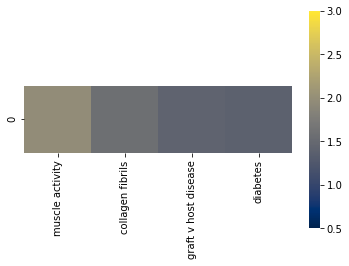

C1


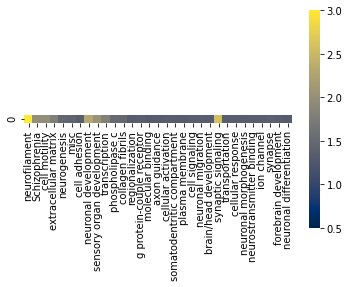

C2


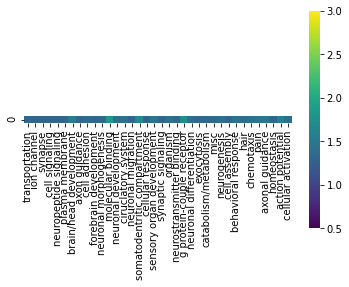

C2


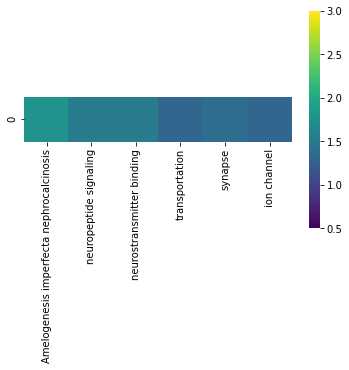

C3


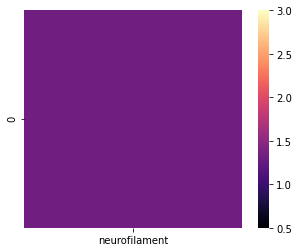

C3


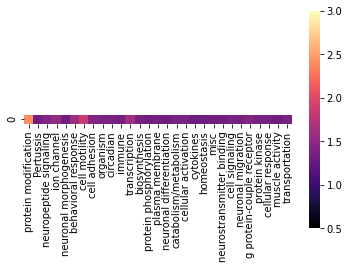

In [274]:
colors = {'C1':'cividis','C2':'viridis','C3':'magma'}
sortby = 'counts' # counts
valueby = 'FDR Q' # counts
for nm,gmap in go_maps.items():
    comp,tail = nm.split('_')
    if tail == 'top':
        ind = gmap.sort_values(sortby,ascending=True).index
    else:
        ind = gmap.sort_values(sortby,ascending=False).index
    sns.heatmap(gmap.loc[ind,valueby].T.values.reshape(1,-1),square = True,
                xticklabels=gmap.loc[ind,valueby].T.index,
               vmin=0.5,vmax=3,cmap=colors[comp])
    print(comp)
    plt.savefig('/Users/jacobv/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/SubFigs/GO_Matrix_%s_FDR.pdf'%nm,
               bbox_inches='tight')
    plt.show()

In [ ]:
go_maps['C2_bottom']

In [309]:
for x in go_maps['C3_top'].sort_values('counts',ascending=False).index.tolist():
    #print(x+' -')
    print('-'+x)

-transportation
-muscle activity
-cellular response
-protein kinase
-g protein-couple receptor
-neuronal migration
-cell signaling
-misc
-cytokines
-catabolism/metabolism
-neurostransmitter binding
-cellular activation
-homeostasis
-protein phosphorylation
-plasma membrane
-neuronal differentiation
-organism
-cell motility
-biosynthesis
-cell adhesion
-immune
-transcription
-circadian
-protein modification
-Pertussis
-neuropeptide signaling
-ion channel
-behavioral response
-neuronal morphogenesis


In [298]:
cdf[(cdf.component=='C2') & (cdf['tail']=='top') & (cdf.category=='synapse')]

,Category,ID,Name,Source,p-value,q-value Bonferroni,q-value FDR B&H,q-value FDR B&Y,Hit Count in Query List,Hit Count in Genome,Hit in Query List,component,tail,cluster,category
975,GO: Cellular Component,GO:0098688,parallel fiber to Purkinje cell synapse,,0.000082,0.02577,0.009216,0.05832,4,33,"GRIN2A,CADPS2,ATP2B2,ATP2B3",C2,top,31.0,synapse
976,GO: Cellular Component,GO:0042734,presynaptic membrane,,0.000122,0.03822,0.009216,0.05832,8,210,"KCTD8,GRIN2A,STX19,KCNC1,KCNC3,CADPS2,ATP2B2,A...",C2,top,51.0,synapse
977,GO: Cellular Component,GO:0045211,postsynaptic membrane,,0.000129,0.04038,0.009216,0.05832,10,334,"COL13A1,KCTD8,CNKSR2,GRIN2A,MET,KCNC1,KCNC3,KC...",C2,top,51.0,synapse
978,GO: Cellular Component,GO:0098794,postsynapse,,0.000139,0.04352,0.009216,0.05832,16,790,"CABP1,COL13A1,SYN3,INSYN1,KCTD8,CPLX2,CNKSR2,G...",C2,top,98.0,synapse
979,GO: Cellular Component,GO:0097060,synaptic membrane,,0.000147,0.04608,0.009216,0.05832,12,479,"COL13A1,KCTD8,CNKSR2,GRIN2A,MET,STX19,KCNC1,KC...",C2,top,51.0,synapse
980,GO: Cellular Component,GO:0060076,excitatory synapse,,0.000268,0.08412,0.014020,0.08872,5,81,"GRIN2A,MET,CADPS2,ATP2B2,ATP2B3",C2,top,165.0,synapse
983,GO: Cellular Component,GO:0098978,glutamatergic synapse,,0.001002,0.31450,0.034950,0.22120,11,512,"CABP1,SYN3,CPLX2,CNKSR2,GRIN2A,NR3C1,PPM1H,KCN...",C2,top,163.0,synapse
984,GO: Cellular Component,GO:0099056,integral component of presynaptic membrane,,0.001379,0.43290,0.041720,0.26400,5,116,"GRIN2A,KCNC1,KCNC3,ATP2B2,ATP2B3",C2,top,148.0,synapse


C1


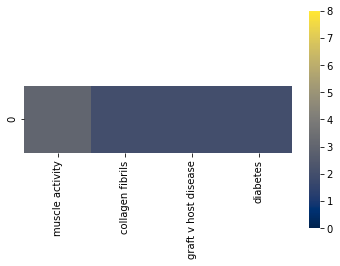

C1


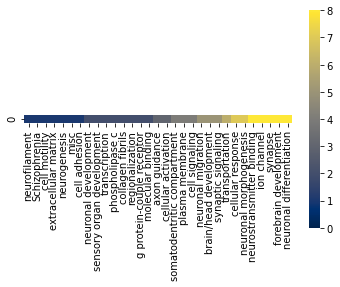

C2


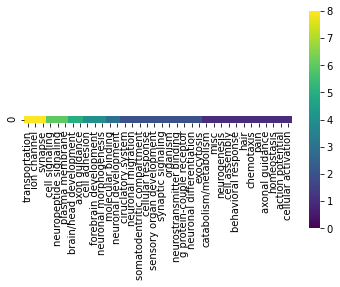

C2


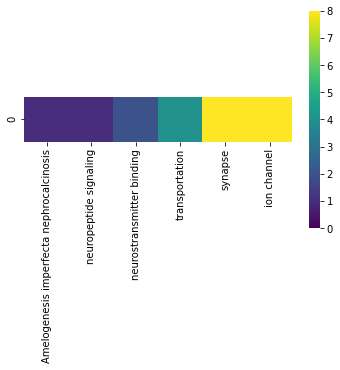

C3


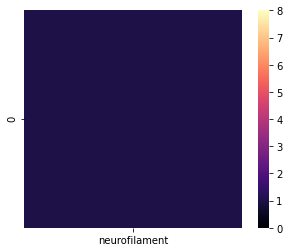

C3


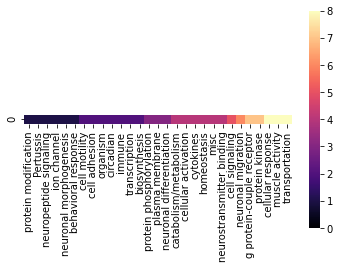

In [275]:
colors = {'C1':'cividis','C2':'viridis','C3':'magma'}
sortby = 'counts' # counts
value_by = 'counts'
for nm,gmap in go_maps.items():
    comp,tail = nm.split('_')
    if tail == 'top':
        ind = gmap.sort_values(sortby,ascending=True).index
    else:
        ind = gmap.sort_values(sortby,ascending=False).index
    sns.heatmap(gmap.loc[ind,value_by].T.values.reshape(1,-1),square = True,
                xticklabels=gmap.loc[ind,value_by].T.index,
               vmin=0,vmax=8,
                cmap=colors[comp])
    print(comp)
    plt.savefig('/Users/jacobv/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/SubFigs/GO_Matrix_%s_counts.pdf'%nm,
               bbox_inches='tight')
    plt.show()

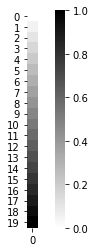

In [316]:
sns.heatmap(np.linspace(0,1,20).reshape(-1,1),square=True,cmap='binary')
plt.savefig('/Users/jacobv/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/SubFigs/GO_Matrix_binary_cscale.pdf',
           bbox_inches='tight')

In [318]:
from difflib import SequenceMatcher
length = len(cells)
cmat = np.zeros((length,length))
for i in range(length):
    for j in range(length):
        cmat[i,j] = SequenceMatcher(a=cells[i],b=cells[j]).ratio()

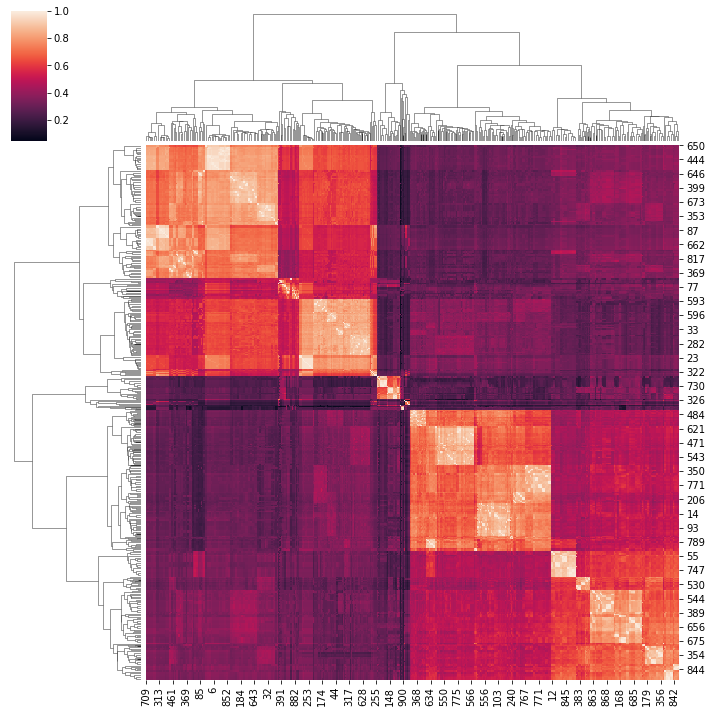

In [319]:
sns.clustermap(cmat)

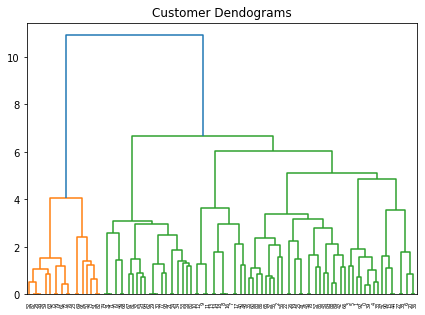

In [72]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(7, 5))
plt.title("Customer Dendograms")
link = shc.linkage(cmat, method='ward')
dend = shc.dendrogram(link)

In [321]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.cluster import AgglomerativeClustering

csol = pandas.DataFrame()
for i,k in enumerate(range(2,50)):
    #print('working on k =',k)
    d = cmat
    cluster = AgglomerativeClustering(n_clusters=k, affinity='euclidean', 
                                  linkage='ward')
    cluster.fit_predict(d)
    csol.loc[i,'k'] = k
    csol.loc[i,'sil_score'] = silhouette_score(d,cluster.labels_,random_state=123)
    csol.loc[i,'ch_score'] = calinski_harabasz_score(d,cluster.labels_)

In [322]:
len(cells)

906

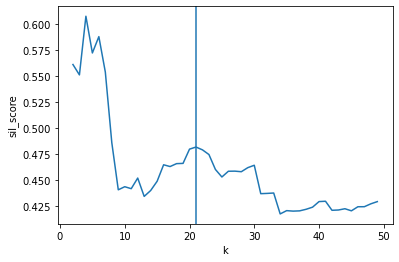

In [326]:
sns.lineplot(x='k',y='sil_score',data=csol)
#plt.xlim(170,200)
plt.axvline(21)
# 30 and 45

In [327]:
# 181
cluster = AgglomerativeClustering(n_clusters=21, affinity='euclidean', 
                                  linkage='ward')
cluster.fit_predict(d)
term_clus = pandas.concat([pandas.Series(cells),
                          pandas.Series(cluster.labels_)],axis=1)
term_clus.columns = ['cell','cluster']

In [329]:
for clab in term_clus.cluster.unique():
    print('cluster',clab,'\n')
    print(term_clus[term_clus.cluster==clab].cell.values,'\n\n')

cluster 1 

['visual_cortex-neuronal-glutamatergic_excit-glut_2-exc_l4_rorb_cacng5'
 'visual_cortex-neuronal-glutamatergic_excit-glut_3-exc_l3-5_fezf2_onecut1'
 'visual_cortex-neuronal-glutamatergic_excit-glut_2-exc_l4-5_rorb_ascl1'
 'visual_cortex-neuronal-glutamatergic_excit-glut_11.5-exc_l5-6_fezf2_cabp7'
 'visual_cortex-neuronal-glutamatergic_excit-glut_2-exc_l4-5_rorb_aim2'
 'visual_cortex-neuronal-glutamatergic_excit-glut_13-exc_l6_fezf2_tbc1d26'
 'visual_cortex-neuronal-glutamatergic_excit-glut_13-exc_l6_fezf2_slitrk6'
 'visual_cortex-neuronal-glutamatergic_excit-glut_12-exc_l6_fezf2_cpz'
 'visual_cortex-neuronal-glutamatergic_excit-glut_12-exc_l6_fezf2_vwa2'
 'visual_cortex-neuronal-glutamatergic_excit-glut_10.5-exc_l5-6_themis_or1j1'
 'visual_cortex-neuronal-glutamatergic_excit-glut_4-exc_l2-4_rorb_grik1'
 'visual_cortex-neuronal-glutamatergic_excit-glut_10-exc_l4-5_rorb_rpl31p31'
 'visual_cortex-neuronal-glutamatergic_excit-glut_5-exc_l3-4_rorb_sema6d'
 'visual_cortex-neurona

In [330]:
clus_names = {'visual cortex glutamatergic': [1,11],
              'excitatory (fezf2_slc17a7)':[14],
              'visual cortex gabaergic':[5,17],
              'excitatory (lamp5_linc00507)':[13],
              'inhibitory (sst)': [16],
              'sensory cortex glutamatergic': [10,15],
              'excitatory (rorb)': [4],
              'inhibitory (vip)': [6],
              'visual cortex non-neuronal': [2],
              'misc': [8],
              'excitatory (fezf2)': [0],
              'inhibitory (pvalb)': [7],
              'inhibitory (lamp 5)': [3],
              'astrocytes':[9],
              'inhibitory (sst_pax6)': [19],
              'sensory cortex gabaergic': [12],
             } 

In [333]:
#cdf.loc[:,'category'] = np.nan
for i,row in term_clus.iterrows():
    if row['cell'] not in cell_map.keys(): continue
    match = cdf[cdf.Name==cell_map[row['cell']]].index
    for ind in match:
        if pandas.notnull(cdf.loc[ind,'category']): continue
    cdf.loc[match,'cluster'] = row['cluster']
    for cat,clusters in clus_names.items():
        if row['cluster'] in clusters:
            cdf.loc[match,'category'] = cat
#             print(row['term'],cat)
#             print(cdf.loc[match,'category'])
#             print('\n')
            break

In [336]:
cdf[(cdf.Category=='ToppCell Atlas') & (cdf.category=='misc')].Name

228     Somatosensory_Cortex|World / Region, Lineage, ...
238     Auditory_Cortex|World / Region, Lineage, Class...
286     Motor_Cortex|World / Region, Lineage, Class, S...
447     Neuronal|World / cells hierarchy compared to a...
493     Visual_Cortex|World / Region, Lineage, Class, ...
719     Auditory_Cortex|World / Region, Lineage, Class...
1048    Motor_Cortex|World / Region, Lineage, Class, S...
1107    Somatosensory_Cortex|World / Region, Lineage, ...
1305    Auditory_Cortex|World / Region, Lineage, Class...
1362    Somatosensory_Cortex|World / Region, Lineage, ...
Name: Name, dtype: object

In [337]:
fixes = {228: 'Somatosensory_Cortex',238:'Auditory_Cortex',286:'Motor_Cortex',
        447: 'Neuronal',493:'Visual_Cortex',719:'Auditory_Cortex',
        1048: 'Motor_Cortex',1107:'Somatosensory_Cortex',1305:'Auditory_Cortex', 
         1362:'Somatosensory_Cortex',
        }
for ind,fix in fixes.items():
    cdf.loc[ind,'category'] = fix

In [338]:
go_maps = {}
for comp in cdf.component.unique():
    for tail in cdf['tail'].unique():
        nm = comp+'_'+tail
        sdf = cdf[(cdf.component==comp) & (cdf['tail']==tail) & (cdf.Category=='ToppCell Atlas')]
        gmap = pandas.DataFrame(sdf.groupby('category')['q-value FDR B&H'].max().sort_values(),)
        gmap.loc[:,'counts'] = sdf.category.value_counts().loc[gmap.index]
        gmap.columns = ['FDR Q','counts']
        gmap.loc[:,'FDR Q'] = -np.log10(gmap['FDR Q']).values
        go_maps.update({nm:gmap})

C1_bottom


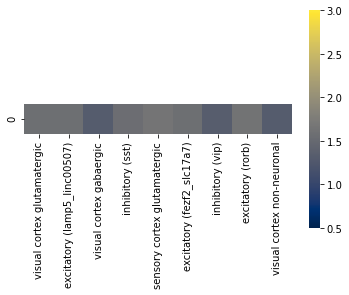

C1_top


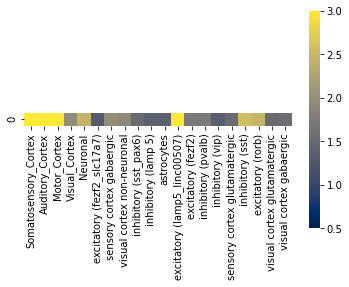

C2_bottom


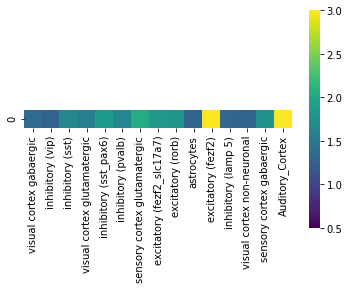

C2_top


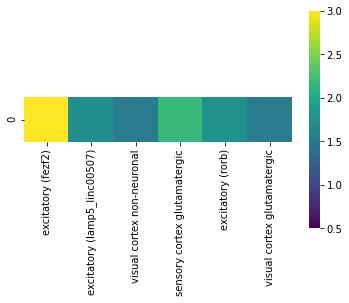

C3_bottom


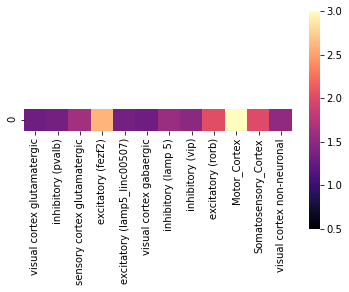

C3_top


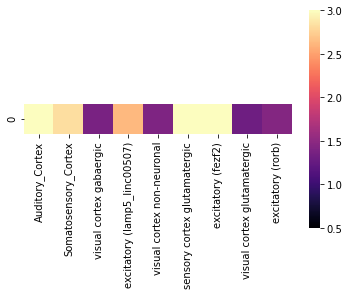

In [340]:
colors = {'C1':'cividis','C2':'viridis','C3':'magma'}
sortby = 'counts' # counts
valueby = 'FDR Q' # counts
for nm,gmap in go_maps.items():
    comp,tail = nm.split('_')
    if tail == 'top':
        ind = gmap.sort_values(sortby,ascending=True).index
    else:
        ind = gmap.sort_values(sortby,ascending=False).index
    sns.heatmap(gmap.loc[ind,valueby].T.values.reshape(1,-1),square = True,
                xticklabels=gmap.loc[ind,valueby].T.index,
               vmin=0.5,vmax=3,cmap=colors[comp])
    print(nm)
#     plt.savefig('/Users/jacobv/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/SubFigs/GO_Matrix_%s_FDR.pdf'%nm,
#                bbox_inches='tight')
    plt.show()

In [343]:
for comp in cdf.component.unique():
    for tail in cdf['tail'].unique():
        nm = comp+'_'+tail
        print(nm,
            cdf[(cdf.component==comp) & (cdf['tail']==tail) & (cdf.Category=='ToppCell Atlas')
           ].sort_values('q-value FDR B&H')[['Name','q-value FDR B&H']].head(),
              '\n')

C1_bottom                                                  Name  q-value FDR B&H
6   Visual_Cortex-Neuronal-Glutamatergic_Excit-GLU...         0.009663
7   Neuronal-Excitatory-eE(FEZF2_SLC17A7)-eE_2-SLC...         0.009663
8   Neuronal-Excitatory-eE(FEZF2_SLC17A7)-eE_2-SLC...         0.009663
9   Neuronal-Excitatory-eE(FEZF2_SLC17A7)-eE_2-SLC...         0.009663
10  Visual_Cortex-Neuronal-GABAergic-Inh-GABA_7-In...         0.009663 

C1_top                                                   Name  q-value FDR B&H
218  Visual_Cortex-Neuronal-Glutamatergic_Excit-GLU...     9.962000e-09
219  Visual_Cortex-Neuronal-Glutamatergic_Excit-GLU...     9.962000e-09
220  Visual_Cortex-Neuronal-Glutamatergic_Excit-GLU...     9.962000e-09
221  Visual_Cortex-Neuronal-Glutamatergic_Excit-GLU...     1.602000e-08
222  Neuronal-Excitatory-eA(LAMP5_LINC00507)|Neuron...     1.602000e-08 

C2_bottom                                                   Name  q-value FDR B&H
705  Somatosensory_Cortex-Neuronal-Glut

In [ ]:
go_maps['C2_bottom']

In [309]:
for x in go_maps['C3_top'].sort_values('counts',ascending=False).index.tolist():
    #print(x+' -')
    print('-'+x)

-transportation
-muscle activity
-cellular response
-protein kinase
-g protein-couple receptor
-neuronal migration
-cell signaling
-misc
-cytokines
-catabolism/metabolism
-neurostransmitter binding
-cellular activation
-homeostasis
-protein phosphorylation
-plasma membrane
-neuronal differentiation
-organism
-cell motility
-biosynthesis
-cell adhesion
-immune
-transcription
-circadian
-protein modification
-Pertussis
-neuropeptide signaling
-ion channel
-behavioral response
-neuronal morphogenesis


In [298]:
cdf[(cdf.component=='C2') & (cdf['tail']=='top') & (cdf.category=='synapse')]

,Category,ID,Name,Source,p-value,q-value Bonferroni,q-value FDR B&H,q-value FDR B&Y,Hit Count in Query List,Hit Count in Genome,Hit in Query List,component,tail,cluster,category
975,GO: Cellular Component,GO:0098688,parallel fiber to Purkinje cell synapse,,0.000082,0.02577,0.009216,0.05832,4,33,"GRIN2A,CADPS2,ATP2B2,ATP2B3",C2,top,31.0,synapse
976,GO: Cellular Component,GO:0042734,presynaptic membrane,,0.000122,0.03822,0.009216,0.05832,8,210,"KCTD8,GRIN2A,STX19,KCNC1,KCNC3,CADPS2,ATP2B2,A...",C2,top,51.0,synapse
977,GO: Cellular Component,GO:0045211,postsynaptic membrane,,0.000129,0.04038,0.009216,0.05832,10,334,"COL13A1,KCTD8,CNKSR2,GRIN2A,MET,KCNC1,KCNC3,KC...",C2,top,51.0,synapse
978,GO: Cellular Component,GO:0098794,postsynapse,,0.000139,0.04352,0.009216,0.05832,16,790,"CABP1,COL13A1,SYN3,INSYN1,KCTD8,CPLX2,CNKSR2,G...",C2,top,98.0,synapse
979,GO: Cellular Component,GO:0097060,synaptic membrane,,0.000147,0.04608,0.009216,0.05832,12,479,"COL13A1,KCTD8,CNKSR2,GRIN2A,MET,STX19,KCNC1,KC...",C2,top,51.0,synapse
980,GO: Cellular Component,GO:0060076,excitatory synapse,,0.000268,0.08412,0.014020,0.08872,5,81,"GRIN2A,MET,CADPS2,ATP2B2,ATP2B3",C2,top,165.0,synapse
983,GO: Cellular Component,GO:0098978,glutamatergic synapse,,0.001002,0.31450,0.034950,0.22120,11,512,"CABP1,SYN3,CPLX2,CNKSR2,GRIN2A,NR3C1,PPM1H,KCN...",C2,top,163.0,synapse
984,GO: Cellular Component,GO:0099056,integral component of presynaptic membrane,,0.001379,0.43290,0.041720,0.26400,5,116,"GRIN2A,KCNC1,KCNC3,ATP2B2,ATP2B3",C2,top,148.0,synapse


C1


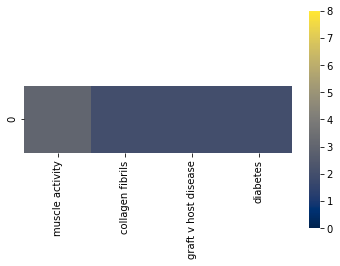

C1


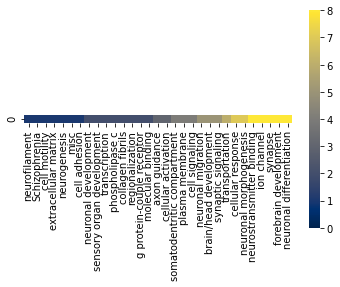

C2


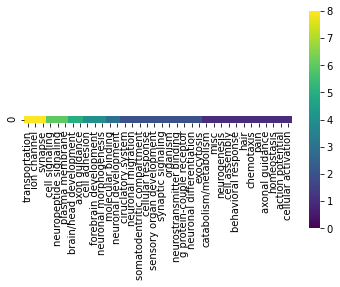

C2


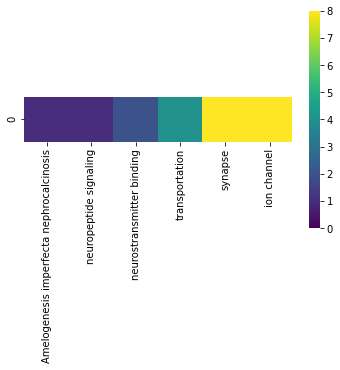

C3


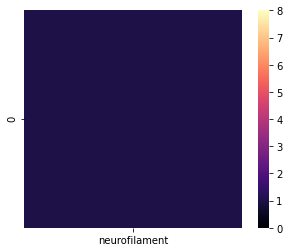

C3


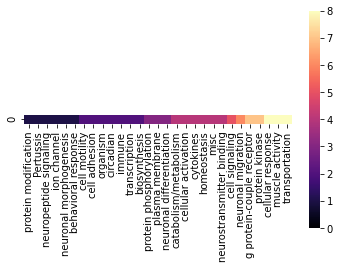

In [275]:
colors = {'C1':'cividis','C2':'viridis','C3':'magma'}
sortby = 'counts' # counts
value_by = 'counts'
for nm,gmap in go_maps.items():
    comp,tail = nm.split('_')
    if tail == 'top':
        ind = gmap.sort_values(sortby,ascending=True).index
    else:
        ind = gmap.sort_values(sortby,ascending=False).index
    sns.heatmap(gmap.loc[ind,value_by].T.values.reshape(1,-1),square = True,
                xticklabels=gmap.loc[ind,value_by].T.index,
               vmin=0,vmax=8,
                cmap=colors[comp])
    print(comp)
    plt.savefig('/Users/jacobv/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/SubFigs/GO_Matrix_%s_counts.pdf'%nm,
               bbox_inches='tight')
    plt.show()

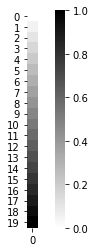

In [316]:
sns.heatmap(np.linspace(0,1,20).reshape(-1,1),square=True,cmap='binary')
plt.savefig('/Users/jacobv/Dropbox/Work/Projects/PLS_ABA/Manuscript/Figs/SubFigs/GO_Matrix_binary_cscale.pdf',
           bbox_inches='tight')